In [1]:
### Import libraries and set plot style

import numpy as np
from scipy.optimize import curve_fit
from cycler import cycler
import matplotlib.pyplot as plt
import matplotlib.transforms as trans
colors = ['#202020', '#d62728', '#1f77b4', '#2ca02c', '#ff7f0e', '#9467bd', '#bcbd22', '#e377c2', '#17becf', '#1f5a0a', '#8c564b', '#7f7f7f']
         ## black    red        blue       green      orange     violet     yellow     pink       lightblue  darkgreen  dirty-red  grey
plt.rcParams.update({'font.size': 15.5,
                     'axes.titlepad': 25,
                     'axes.labelpad': 20,
                     'axes.labelsize': 20,
                     'xtick.labelsize' : 15.5,
                     'ytick.labelsize' : 15.5,
                     'axes.prop_cycle': cycler('color', colors),
                     #'axes.grid': True,
                     'axes.linewidth': 0.5,
                     'lines.linewidth': 1.5,
                     'lines.markersize': 5,
                     'scatter.marker': 'o',
                     #'errorbar.capsize': 2,
                     'figure.dpi': 100.0,
                     'figure.figsize': [8, 5],
                     'xtick.top' : True,
                     'ytick.right' : True,
                     'xtick.direction' : 'out',
                     'ytick.direction' : 'out',
                     'xtick.major.size': 8,
                     'xtick.minor.size': 3,
                     'ytick.major.size': 8,
                     'ytick.minor.size': 3,
                     'xtick.major.width': 1,
                     'xtick.minor.width': 0.5,
                     'ytick.major.width': 1,
                     'ytick.minor.width': 0.5})

In [2]:
### Import raw data and define measurement specifications

SAMPLE = "20-PEI"
SAMPLE_SHORT = SAMPLE[:2]
# specify what temperatures where used and in what order
TEMPS = [70, 50, 30]
GASES = ["N$_2$", "CO$_2$"]
# specify which gas is used in which run: N_2 -> 0, CO_2 -> 1 (specified in "GASES")
# rows: measurements with fixed temperature, same order as "TEMPS" above
# columns: runs
# (compatability) the same gas may be used twice in a row
S = [[1, 0, 1, 0],
     [1, 0, 1, 0],
     [0, 1, 0, 1, 0]]
# ignore these runs: unusable / redundant data
id_out = ["50-0"]
# specify the starting times of the runs
# sometimes the measurement doesn't start at t=0: set GASCHANGE[0] to cut out degassing phase, otherwise set 0 as first value
# After that, put time in seconds for every time the gas is changed (or new ballon with same gas)
GASCHANGE = [[0, 6989, 16205, 25988],
             [1.8848e+04, 19289, 25645, 33843],
             [7.0136e+03, 10697, 18196, 25623, 32600]]
# columns (indices) of frequency, epsilon' (er), epsilon'' (ei) and time in ascii file
f_col, er_col, ei_col, t_col = 0, 2, 3, -1

# specify folder and filenames of raw data, files in same order as "TEMPS" above
folder = "raw data PEI20/"
results_folder = "results20"
files = ["13-10_M2_TBD031_PEI20_70C_CNCN.TXT",
         "13-13_M1_TBD031_PEI20_50C_NdryCNCN.TXT",
         "13-14_M2_TBD031_PEI20_30C_NdryCNCN.TXT"]
DATA = [[], [], []]

for m, f in enumerate(files) :
     # import ascii data, usually it has a header of 4 lines that is cut out
     data_ = np.genfromtxt(folder+f, delimiter='\t', skip_header=4)

     # remove points before start of first run
     after = data_[:,-1] >= GASCHANGE[m][0]
     data = data_[after]

     # add final time to GASCHANGE, needed in main and make time unit hours
     GASCHANGE[m].append(data[-1,-1])
     GASCHANGE[m] = np.array(GASCHANGE[m]) / 60.
     data[:,-1] = data[:,-1] / 60.

     DATA[m] = data

In [3]:
### Data processing

def gradient_matrix(y, x) :
    # y is a 2D array of shape (m,n) and x a vector of shape m
    # froms forward gradient of every column of y along x
    # accounts for in-between nans in y
    # returns two matrices of shape (m-1,n)
    # one for dy[:,k]/dx and one for the corresponding x values x[:,k] that depend on where nans were found

    m, n = y.shape
    y_der = np.full((m - 1, n), np.nan)
    x_der = np.full((m - 1, n), np.nan)

    for k in range(n):
        notnan = ~np.isnan(y[:, k])
        y_k = y[notnan, k]
        x_k = x[notnan]

        if len(y_k) >= 2:
            dy = y_k[1:] - y_k[:-1]
            dx = x_k[1:] - x_k[:-1]
            valid = dx != 0

            y_der_k = dy[valid] / dx[valid]
            x_der_k = 0.5 * (x_k[1:][valid] + x_k[:-1][valid])

            m_k = len(y_der_k)
            y_der[:m_k, k] = y_der_k
            x_der[:m_k, k] = x_der_k

    return y_der, x_der
    

f_out = [5e5] # ignore data of these frequencies
def extract_interpolate_and_derivative(data, num_points=0):
    """
    Extracts lists x_k for every measured data x at a fixed frequency k
    Creates a universal test set of time points
    Interpolates every fixed-frequency data set for those time points
    Computes derivative epsilon'_der along frequency axis
    """
    
    # Extract unique F_k values
    # ignore frequencies specified in f_out
    unique_f = np.unique(data[:, f_col])
    mask = ~np.isin(unique_f, f_out)
    unique_f = unique_f[mask]
    lnw = np.log(2*np.pi*unique_f)  # Compute ln(omega)
    
    # find time boundaries of data
    # and generate `num_points` equidistant t_i values
    initial_test_t, final_test_t = np.min(data[:,t_col])-0.2, np.max(data[:,t_col])-0.2
    if not num_points:
        num_points = int((final_test_t - initial_test_t) *2)
    t_test_set = np.linspace(initial_test_t, final_test_t, num_points)

    # er: real part of epsilon; ei: imag. part; t: corresponding measured time
    er_int, ei_int = [], []
    # Group er_k and ei_k based on unique F_k
    # unify to test times by interpolation
    for f_k in unique_f:
        mask = data[:, f_col] == f_k
        t_k = data[mask][:, t_col]
        er_k = data[mask][:, er_col]
        ei_k = data[mask][:, ei_col]

        er_int_k = np.interp(t_test_set, t_k, er_k, left=np.nan, right=np.nan)
        ei_int_k = np.interp(t_test_set, t_k, ei_k, left=np.nan, right=np.nan)
        
        er_int.append(er_int_k)
        ei_int.append(ei_int_k)

    er_int = np.array(er_int)
    ei_int = np.array(ei_int)


    # Compute gradient of er_k along ln(omega)
    er_der, lnw_der =  gradient_matrix(er_int, lnw)
    er_der = -np.pi/2 * er_der
    #er_der =  -np.pi/2 * np.gradient(er_int, lnw, axis=0)

    return unique_f, lnw_der.T, er_der.T, ei_int.T, t_test_set


def score(popt, pcov, y_data, f_data):
    """
    Computes a fit quality score based on R^2, reduced chi-square, AIC, BIC, and parameter covariances.

    Parameters:
        popt (np.ndarray): Optimized fit parameters from curve_fit.
        pcov (np.ndarray): Covariance matrix of fit parameters from curve_fit.
        y_data (np.ndarray): Measured values.
        f_data (np.ndarray): Fitted values.

    Returns:
        float: Fit quality score (higher is better).
    """
    N = len(y_data)  # Number of data points
    p = len(popt)    # Number of fit parameters
    dof = max(N - p, 1)  # Degrees of freedom (avoid division by zero)

    # Residuals
    residuals = y_data - f_data
    RSS = np.sum(residuals**2)  # Residual sum of squares
    TSS = np.sum((y_data - np.mean(y_data))**2)  # Total sum of squares

    # Coefficient of determination (R^2)
    r_squared = 1 - (RSS / TSS) if TSS > 0 else 0

    # Reduced chi-square (if assuming equal variance in y)
    chi_sq_red = RSS / dof

    # Akaike Information Criterion (AIC)
    aic = 2 * p + N * np.log(RSS / N)

    # Bayesian Information Criterion (BIC)
    bic = p * np.log(N) + N * np.log(RSS / N)

    # Covariance penalty: Large covariance values indicate poorly constrained parameters
    cov_trace = np.trace(pcov) if pcov is not None else 0
    cov_score = np.exp(-np.abs(cov_trace))  # Penalizes large uncertainties

    # Normalize scores
    chi_sq_score = np.exp(-abs(chi_sq_red - 1.0))  # Peaks at chi_sq_red ≈ 1
    aic_bic_score = np.exp(-0.1 * (aic + bic) / 2)  # Penalizes high values

    # Weighted sum (adjust weights if needed)
    score = (0.5 * r_squared) + (0.3 * chi_sq_score) + (0.1 * aic_bic_score) + (0.1 * cov_score)

    return score


In [4]:
### Specify fit function, boundaries and starting initial values; here: CC + CC + CC
# edit this section to change fit function

# base Cole/Cole function for imaginary part
def CC_I(w, de, a, wp) :
    den = 1 + (1j * w/wp)**a
    return -np.imag(de/den)

#base Cole/Cole function for derivative of real part
def CC_R(w, de, a, wp) :
    A = a*np.pi/2
    W = (w/wp)**a
    return A*de*W * np.cos(A - 2* np.arctan(np.sin(A)/(1/W+np.cos(A))) ) / (1 + 2*W*np.cos(A) + W**2)

p_labels = ["$\\Delta\\epsilon_2$", "$\\alpha_2$", "$\\omega_{P2}$ [rad/s]", 
            "$\\Delta\\epsilon_3$", "$\\alpha_3$", "$\\omega_{P3}$ [rad/s]",
            "$\\Delta\\epsilon_1$", "$\\alpha_1$", "$\\omega_{P1}$ [rad/s]"]
p_file_labels = ["de2", "a2", "w2",
                "de3", "a3", "w3",
                "de1", "a1", "w1"]

# starting initial guess for every run
p0_start = [
    # 70 (C-N-C-N)
    [1.18, 0.8138, 856.5, 1.67, 0.3716, 3601.0, 26530000.0, 0.761, 5.508e-09],
    [2.452, 0.6294, 36.43, 0.1634, 0.4391, 224000.0, 5622000.0, 1.0, 9.823e-08],
    [1.18, 0.8138, 856.5, 1.67, 0.3716, 3601.0, 26530000.0, 0.761, 5.508e-09],
    [2.452, 0.6294, 36.43, 0.1634, 0.4391, 224000.0, 2452000.0, 1.0, 2.255e-07],
    # 50 (N-C-N)
    [1.909, 0.6407, 9.041, 0.185, 0.3527, 56660.0, 2916000.0, 1.0, 5.175e-08],
    [1.317, 0.7602, 127.3, 0.6782, 0.3172, 2581.0, 60850000.0, 0.8563, 1.368e-09],
    [0.7945, 0.685, 11.22, 0.1605, 0.3917, 18920.0, 42100000.0, 1.0, 1.184e-08],
    # 30 (N-C-N-C-N)
    [1.883, 0.5876, 17.22, 0.4324, 0.3659, 17630.0, 18.13, 1.0, 0.05729],
    [1.863, 0.6188, 69.0, 0.4034, 0.4103, 86810.0, 66.73, 0.9199, 0.06306],
    [0.4619, 0.7285, 6.815, 0.269, 0.2751, 3864.0, 50230.0, 1.0, 1.371e-05],
    [0.2578, 0.2854, 358.4, 0.01912, 0.8838, 439200.0, 23460.0, 0.7279, 7.354e-07],
    [1.531, 0.5814, 2.653, 0.2165, 0.3102, 21470.0, 26990.0, 1.0, 2.44e-05]]

# boundaries
i_ = np.inf
wi1, wf1 = 1e-2, 2e3
wi2, wf2 = 1., 1e7
wi3, wf3 = 0., 3e-1
bounds = ([0., 0., wi1, 0., 0., wi2, 0., 0., wi3], [i_, 1., wf1, i_, 1., wf2, i_, 1., wf3])

# fit functions with three cole-cole terms
def der_real (lnw, de, a, wp, de_2, a_2, wp_2, de_3, a_3, wp_3) :
    w = np.exp(lnw)
    return np.log( CC_R(w, de, a, wp) + CC_R(w, de_2, a_2, wp_2) + CC_R(w, de_3, a_3, wp_3) )

def imag (lnw, de, a, wp, de_2, a_2, wp_2, de_3, a_3, wp_3) :
    w = np.exp(lnw)
    return np.log ( CC_I(w, de, a, wp) + CC_I(w, de_2, a_2, wp_2) + CC_I(w, de_3, a_3, wp_3) )

def combined_fit(x_all, de, a, wp, de_2, a_2, wp_2, de_3, a_3, wp_3):
    x, mask = x_all  # Unpack the concatenated x values and mask
    y_fit = np.where(mask == 0,   # Apply f1 where mask=0, f2 where mask=1
            der_real(x, de, a, wp, de_2, a_2, wp_2, de_3, a_3, wp_3), 
            imag(x, de, a, wp, de_2, a_2, wp_2, de_3, a_3, wp_3))
    return y_fit

# plot single terms
def plot_parts(ax1, w_, *popt) :
    # calculate the individual terms (set right parameter positions and functions)
    x1_ = CC_R(w_, *popt[:3])
    x2_ = CC_R(w_, *popt[3:6])
    x3_ = CC_R(w_, *popt[6:])
    # plot the terms
    ax1.plot(w_, x1_, linestyle=':', color='red')
    ax1.plot(w_, x2_, linestyle=':', color='blue')
    ax1.plot(w_, x3_, linestyle=':', color='black')
    # label with a number
    ax1.text(popt[2], popt[0]/12, "(ii)", color='red', fontsize=17)
    ax1.text(popt[5], max(popt[3]/16, 1e-2), "(iii)", color='blue', fontsize=17)
    if np.any(x3_ > 1e-2) :
        ax1.text(5e-1, 5e-2, "(i)", color='black', fontsize=17)


In [5]:
### fitting and plotting procedure

# indices of fit parameter omega, used in "fixorder" to make sure the three terms go from low to high frequency
peak_indices = [2, 5, 8]
def fixorder(p) :
    # fix order of parameters such that peaks are in ascending order
    # old function that might be useful, needs some work
    peaks = p[peak_indices]
    bigger_than_next = peaks[:-1] > peaks[1:]
    while np.any(bigger_than_next) :
        for i, cell in enumerate(bigger_than_next) :
            if cell :
                temp_ = p[i*3:i*3+3]
                p[i*3:i*3+3] = p[i*3+3:i*3+6]
                p[i*3+3:i*3+6] = temp_

                peaks = p[peak_indices]
                bigger_than_next = peaks[:-1] > peaks[1:]
                break
    return p
    

lnw_area = np.linspace(np.log(10), np.log(1e9), 1000)

def fit(x1, y1, x2, y2, p0, run_num) :
    # if the fit didn't converge or receives a bad "score" (see above), 
    # it will retry with the starting initial guess for the current run
    # starting guesses are specified above

    fitf = combined_fit

    # Combine x and y values into a single array (respectively) and create a mask
    x_all = np.concatenate([x1, x2])  # Flatten xdata
    y_all = np.concatenate([y1, y2])
    mask = np.concatenate([np.zeros_like(x1), np.ones_like(x2)])
    

    try :
        popt, pcov = curve_fit(fitf, (x_all, mask), y_all, p0=p0, bounds=bounds, nan_policy='omit')
        fitscore = score(popt, pcov, y_all, fitf((x_all, mask), *popt))

        if fitscore < 50000 :
            try :
                popt2, pcov2 = curve_fit(fitf, (x_all, mask), y_all, p0=p0_start[run_num], bounds=bounds, nan_policy='omit')
                fitscore2 = score(popt2, pcov2, y_all, fitf((x_all, mask), *popt2))
            except :
                fitscore2 = 0

            if fitscore < fitscore2 :
                popt = popt2
                fitscore = fitscore2
                print("FALLBACK 1: ", np.round(fitscore2,0))

        y = np.exp(der_real(lnw_area, *popt))
        a = np.trapezoid(y, lnw_area)
        return popt, a, np.round(fitscore,0)

    except  :
        try :
            popt, pcov = curve_fit(fitf, (x_all, mask), y_all, p0=p0_start[run_num], bounds=bounds, nan_policy='omit')
            fitscore3 = score(popt, pcov, y_all, fitf((x_all, mask), *popt))
            print("FALLBACK 2: ", np.round(fitscore3,0))

            y = np.exp(der_real(lnw_area, *popt))
            a = np.trapezoid(y, lnw_area)
            return popt, a, np.round(fitscore3,0)

        except Exception as err :
            print([float(pi) for pi in np.round(p0_start[run_num],4)])
            print(j, i, str(type(err))[8:-2], ": ", err)
            
    return p0, 0, 0


def round_sig(x, n):
    # round to n significant digits
    if x == 0:
        return 0
    return float(round(x, n - int(__import__('math').floor(__import__('math').log10(abs(x)))) - 1))


# for smooth plot of fit function
# dense omega values, equidistant in the log regime
lnw_ = np.linspace(-0.5, 15.5, 100)
w_ = np.exp(lnw_)
f_ = w_/2/np.pi

title_text = "BDS of  "

def plot(w_der, x_der, w, x_i, popt, dt, run, id, fitscore) :
    # whole output routine

    # output optimal fit parameters, starting initial guess of the run and fitscore
    # for trouble shooting and detailed insights
    print("fit score", fitscore)
    #print("in. guess at t=0", [float(pi) for pi in p0_start[run]])
    print("fit parameters", [round_sig(pi, 4) for pi in popt])

    fig, ax1 = plt.subplots()
    yscale = 'log'
    plt.xscale('log')
    ax1.set_yscale(yscale)

    # calculate fitted function and individual terms for the plot
    # "..._" for fit data and without "_" for measurement data
    x_der_ = np.exp(der_real(lnw_, *popt))
    x_i_ = np.exp(imag(lnw_, *popt))

    # plot er_der
    ax1.scatter(w_der, x_der, label="$\\epsilon'_{der}$")
    ax1.plot(w_, x_der_, color='r')
    plot_parts(ax1, w_, *popt)
    ax1.set_ylabel("$\\log_{10}\\left(~~\\epsilon'_{der} ~~\\right)$") # = -\\frac{\\pi}{2} ~ \\frac{\\partial\\epsilon'}{\\partial\\ln(\\omega)}

    # change axes labels such that only exponent is shown (10^3 -> 3)
    xticks = ax1.get_xticks()
    yticks = ax1.get_yticks()
    new_labels_x = ([int(np.round(np.log10(tick))) for tick in xticks])
    new_labels_y = ([int(np.round(np.log10(tick))) for tick in yticks])
    ax1.set_xticks(xticks)
    ax1.set_yticks(yticks)
    ax1.set_xticklabels(new_labels_x)
    ax1.set_yticklabels(new_labels_y)
    # set limits such that ei is moved up and fits are cut to window of measurement data
    ax1.set_ylim(1/2* np.min(x_der) , 10* np.max(x_der))

    # create right axis and plot ei
    ax2 = ax1.twinx()
    ax2.set_yscale(yscale)
    ax2.scatter(w, x_i, color='r', label="$\\epsilon''$")
    ax2.plot(w_, x_i_, color='g')
    ax2.tick_params(axis='y', labelcolor='r')
    ax2.set_ylabel("$\\log_{10}\\left(~~\\epsilon'' ~~\\right)$", color='r')

    # change axes labels such that only exponent is shown (10^3 -> 3)
    yticks2 = ax2.get_yticks()
    new_labels_y2 = ([int(np.log10(tick)) if tick > 0 else '' for tick in yticks2])
    ax2.set_yticks(yticks2)
    ax2.set_yticklabels(new_labels_y2)
    # set limits such that ei is moved up and fits are cut to window of measurement data
    ax2.set_ylim(1/10* np.min(x_i) , 2* np.max(x_i))

    # create title: BDs -> ID -> measurement time
    timestr = "t = " + str(np.round(dt,1)) + " min"
    title = title_text + SAMPLE_SHORT +'-'+ id + "  at  " + timestr
    plt.title(title)
    ax1.set_xlabel("$\\log_{10}\\left(~~\\omega~ [rad/s] ~~\\right)$")

    # activate legend and plot
    ax1.legend()
    ax2.legend(bbox_to_anchor=(1, 0.87))
    #plt.savefig(results_folder + "/fits/"+id+'-'+str(np.round(dt))+"min.pdf", bbox_inches='tight')
    plt.show()

/tmp/ipykernel_111910/274465480.py:29: RuntimeWarning: invalid value encountered in log
  ln_er_der = np.log(er_der)
/tmp/ipykernel_111910/525089787.py:7: RuntimeWarning: invalid value encountered in divide
  return -np.imag(de/den)


fit score 975910.0
fit parameters [2.427, 0.6884, 8.897, 0.2004, 0.3855, 115900.0, 8288.0, 1.0, 1.156e-05]


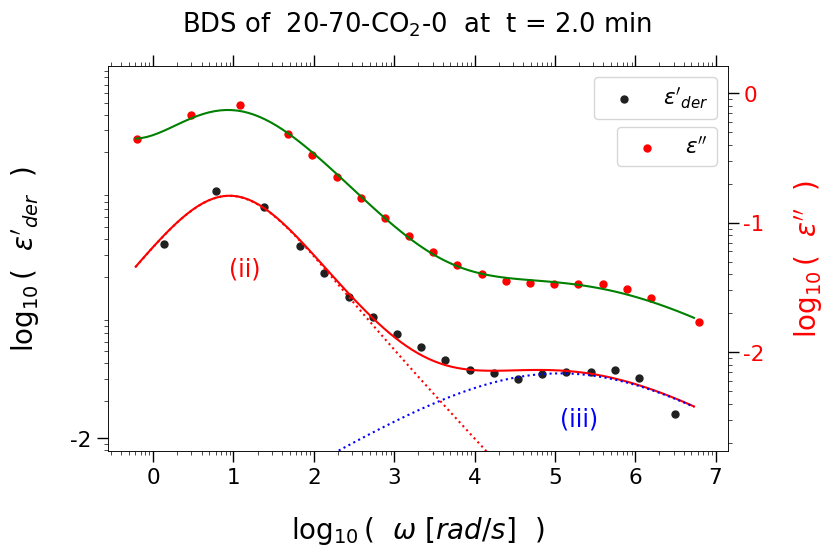

fit score 926851.0
fit parameters [2.437, 0.6871, 8.381, 0.198, 0.3861, 117600.0, 7622.0, 1.0, 1.126e-05]


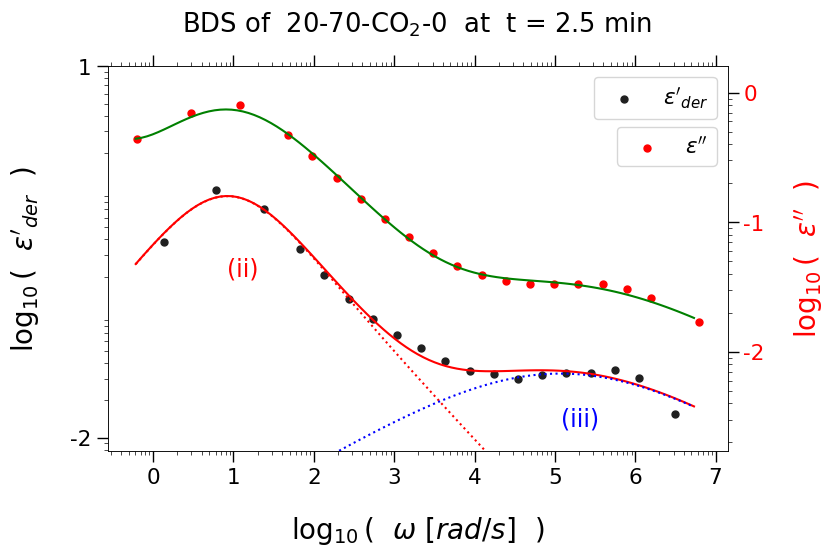

fit score 893412.0
fit parameters [2.448, 0.6861, 7.95, 0.1976, 0.3844, 115700.0, 6872.0, 1.0, 1.109e-05]


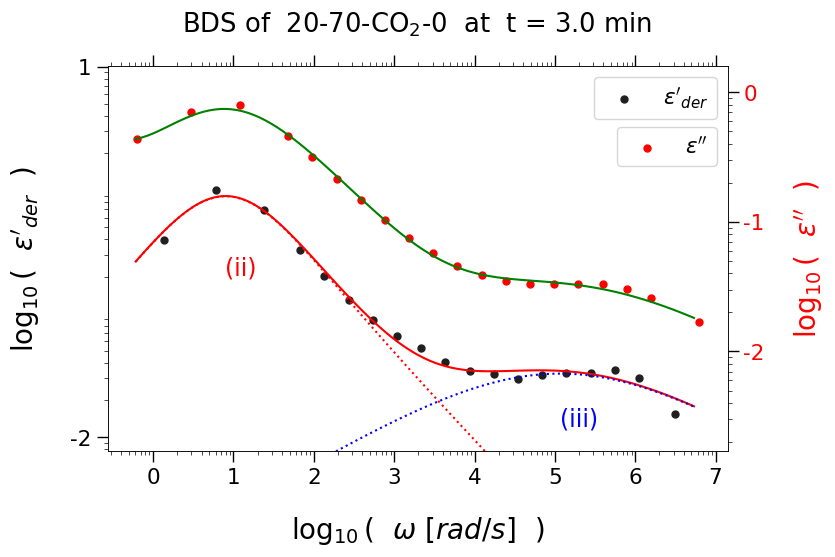

fit score 1006018.0
fit parameters [2.477, 0.6822, 6.869, 0.1931, 0.3837, 115300.0, 4833.0, 1.0, 1.098e-05]


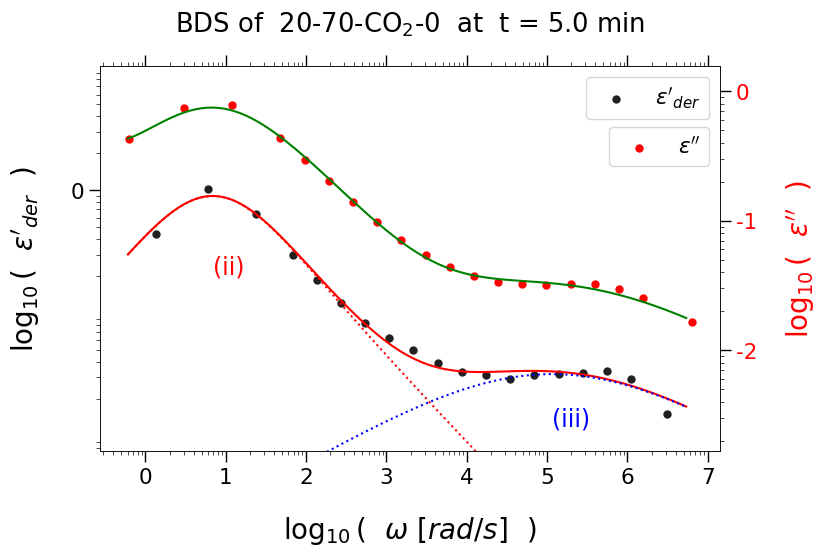

fit score 1146867.0
fit parameters [2.529, 0.6737, 5.68, 0.186, 0.3863, 116300.0, 2692.0, 1.0, 1.041e-05]


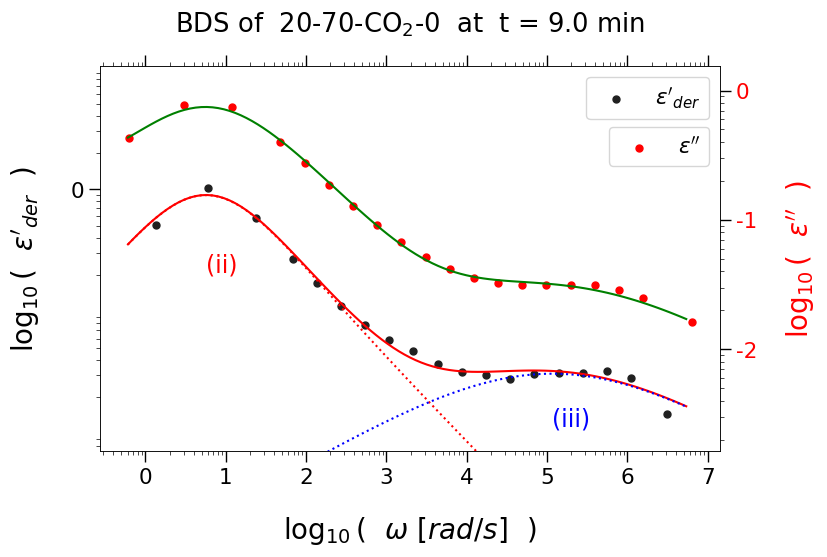

fit score 1667796.0
fit parameters [2.573, 0.6692, 4.825, 0.1841, 0.3799, 110500.0, 1830.0, 1.0, 6.403e-06]


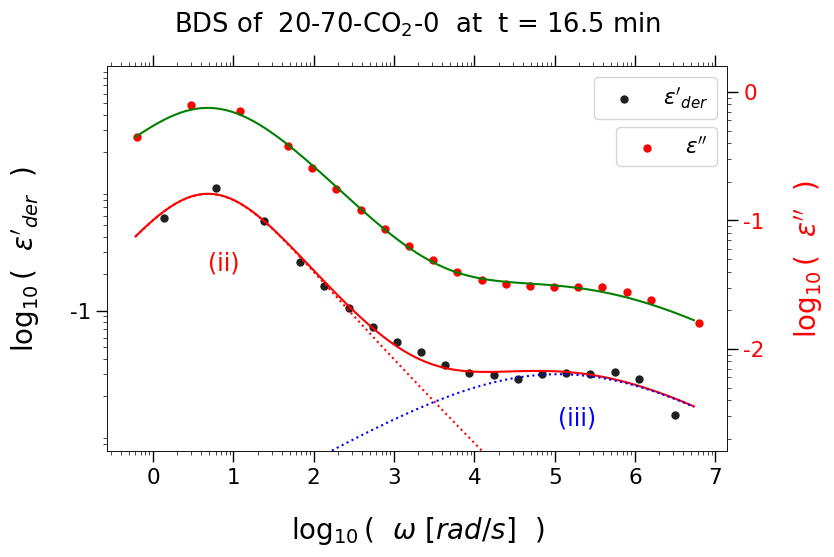

fit score 2095589.0
fit parameters [2.588, 0.6703, 4.397, 0.1869, 0.3678, 95960.0, 1544.0, 1.0, 3.202e-06]


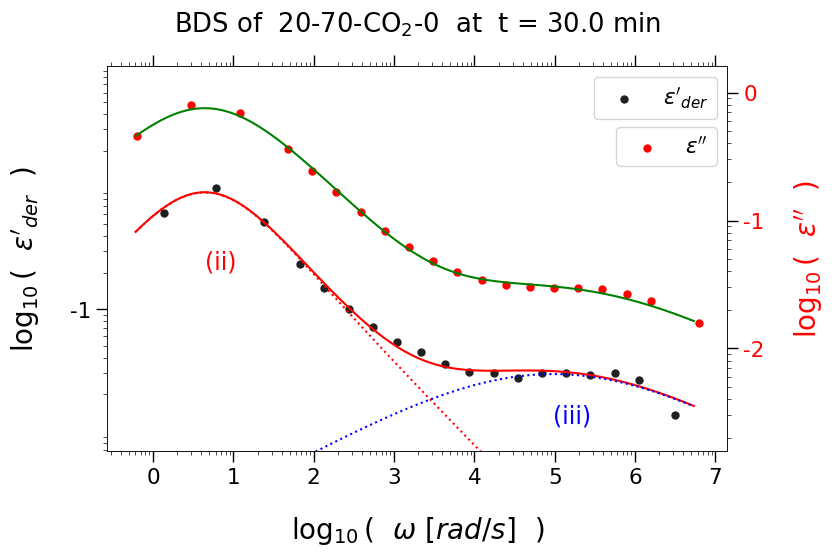

fit score 2782594.0
fit parameters [2.605, 0.6713, 4.097, 0.1885, 0.3597, 81520.0, 5.692e-06, 1.0, 1.263e-10]


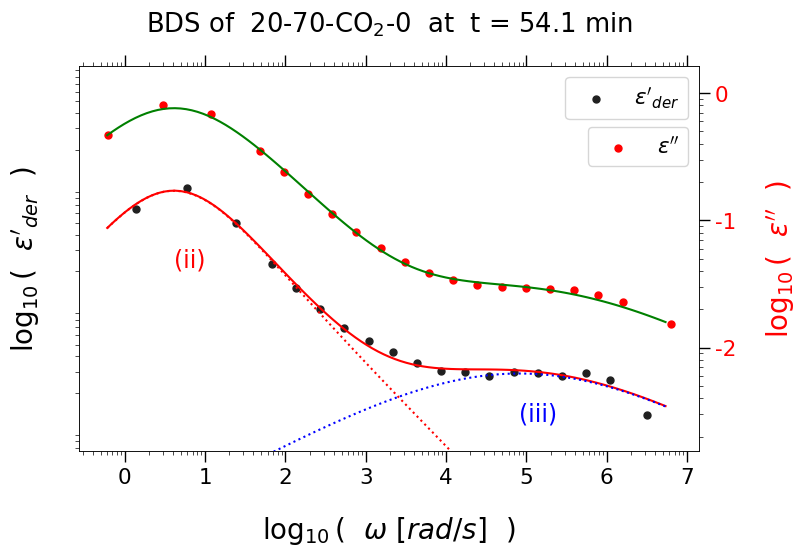

FALLBACK 2:  2.0
fit score 15289123.0
fit parameters [1.685, 0.7854, 5.291, 0.0944, 0.4795, 249500.0, 460.5, 0.2854, 1e-10]


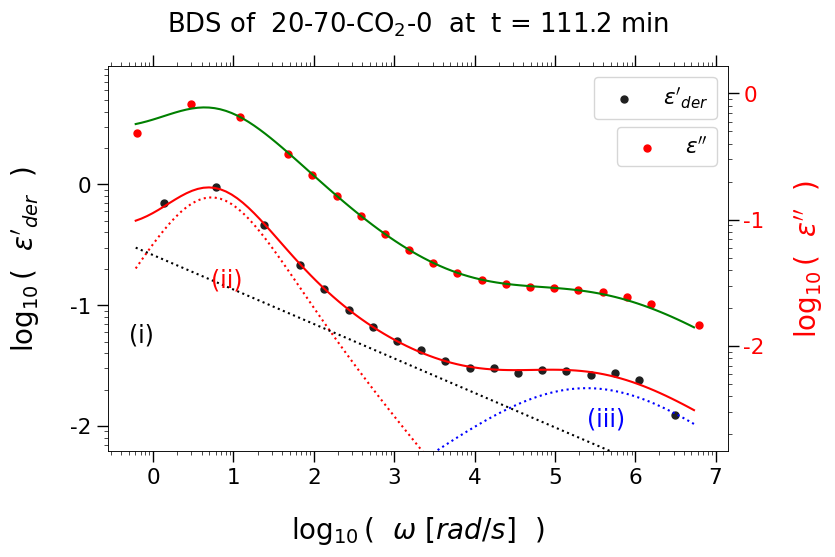

fit score 47103.0
fit parameters [2.353, 0.6318, 13.79, 0.1077, 0.5228, 276300.0, 884400.0, 0.9402, 9.221e-08]


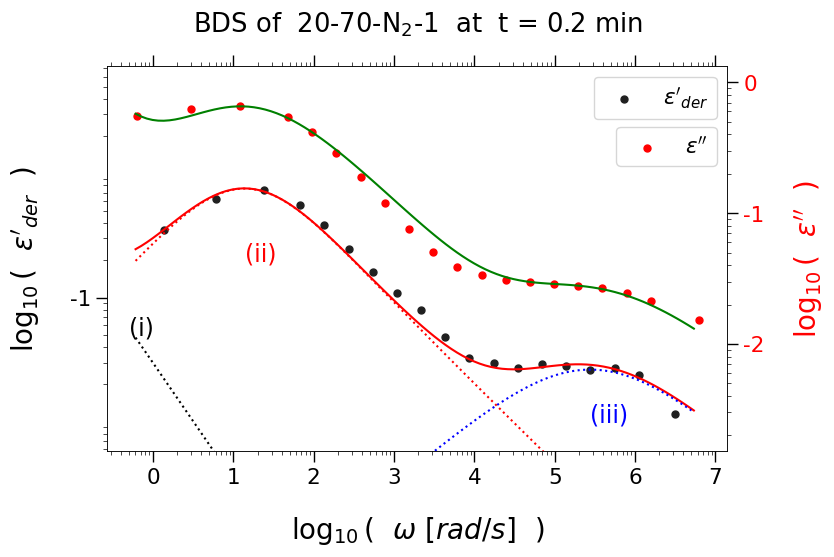

fit score 4747990.0
fit parameters [2.452, 0.6294, 36.43, 0.1634, 0.4391, 224000.0, 2452000.0, 1.0, 2.255e-07]


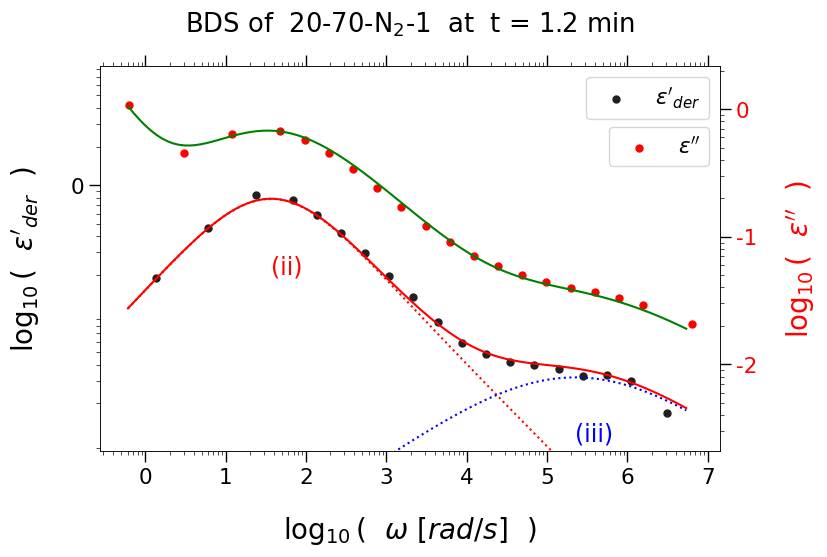

fit score 223845158.0
fit parameters [2.356, 0.6597, 128.5, 0.236, 0.4031, 143600.0, 705700.0, 0.8538, 1.969e-07]


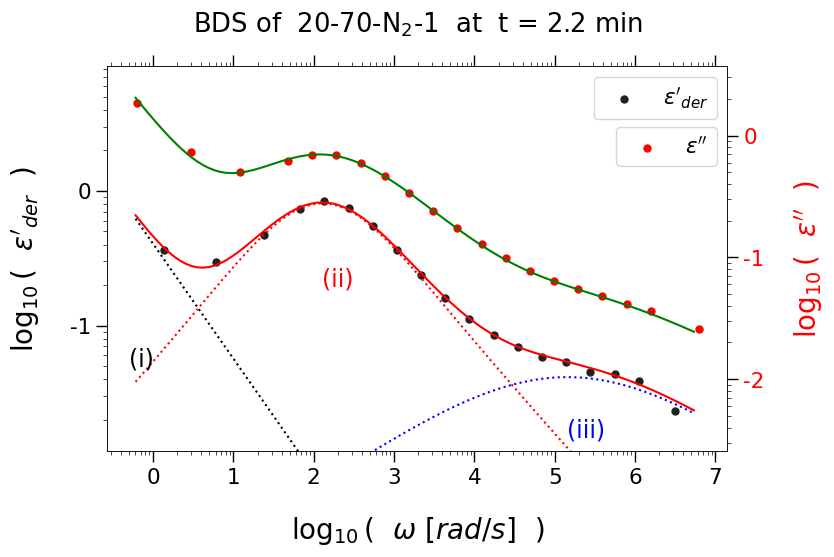

fit score 28048671.0
fit parameters [1.944, 0.777, 312.8, 0.649, 0.3248, 5384.0, 805400.0, 0.8273, 3.116e-07]


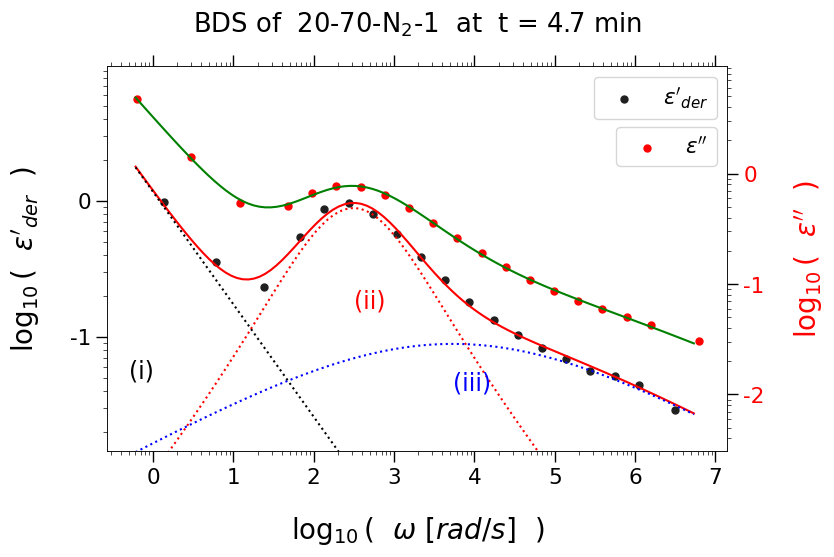

fit score 43640754.0
fit parameters [1.766, 0.7632, 443.5, 0.8447, 0.3546, 5218.0, 4227000.0, 0.8124, 6.082e-08]


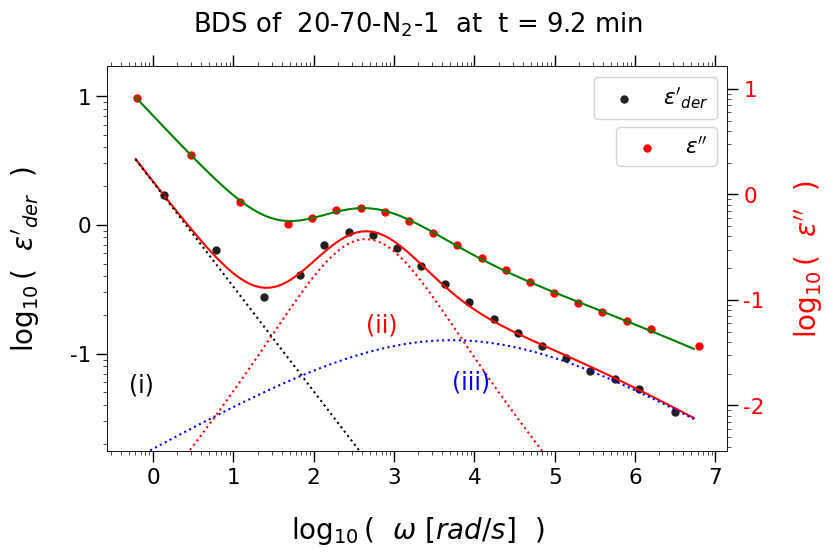

fit score 210878719.0
fit parameters [1.51, 0.7831, 539.2, 1.143, 0.3717, 4665.0, 9561000.0, 0.7981, 2.669e-08]


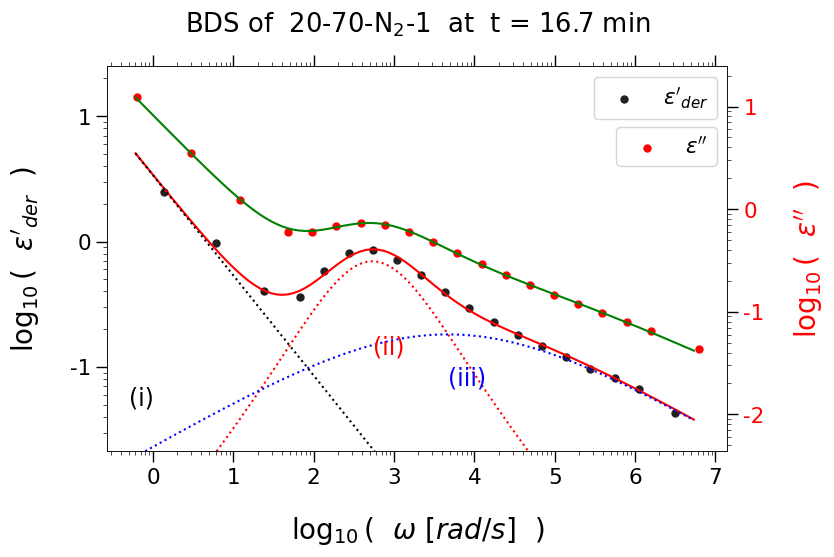

fit score 301265405.0
fit parameters [1.452, 0.7888, 658.5, 1.226, 0.3752, 6640.0, 19130000.0, 0.7837, 1.11e-08]


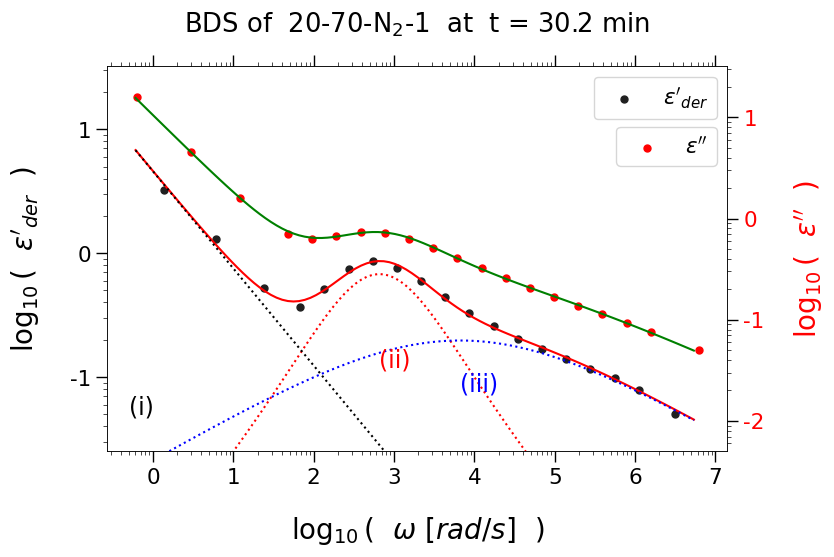

fit score 491214226.0
fit parameters [1.338, 0.7943, 780.9, 1.428, 0.3689, 5139.0, 23990000.0, 0.7768, 8.58e-09]


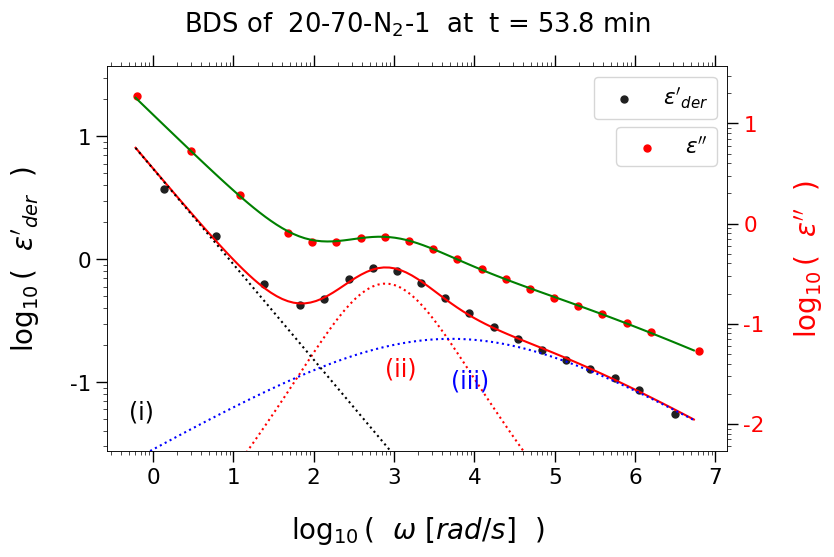

fit score 214010628.0
fit parameters [1.18, 0.8138, 856.5, 1.67, 0.3716, 3601.0, 26530000.0, 0.761, 5.508e-09]


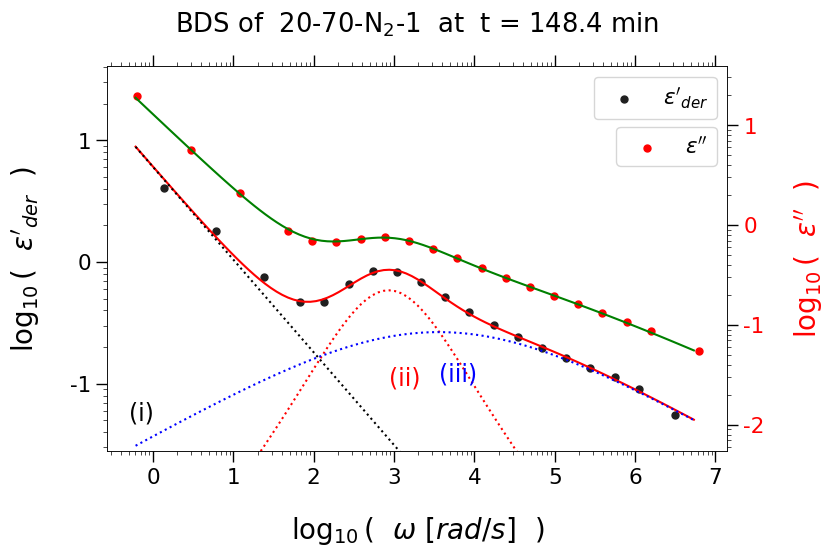

FALLBACK 1:  1.0
fit score 150.0
fit parameters [1.42, 0.72, 21.56, 0.862, 0.09811, 1282.0, 19080000.0, 0.778, 2.159e-09]


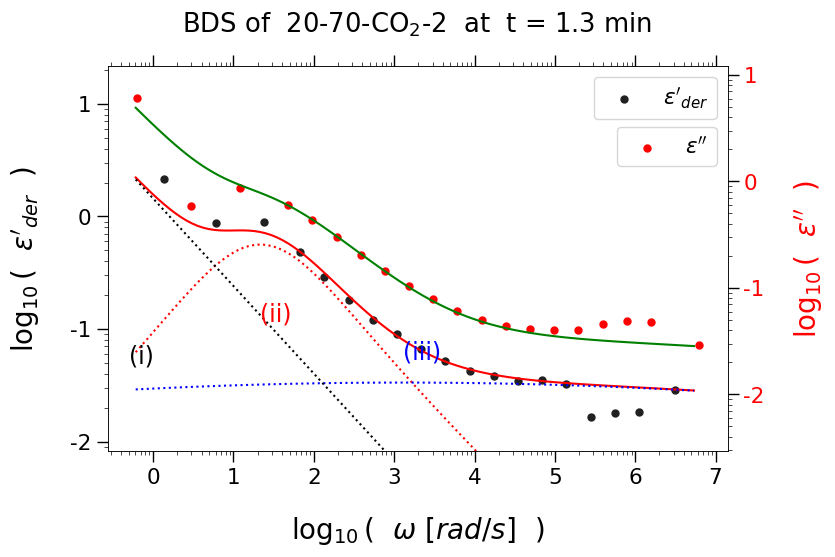

fit score 893176.0
fit parameters [2.225, 0.7454, 11.91, 0.5433, 0.1729, 1966.0, 12630000.0, 0.844, 1.363e-09]


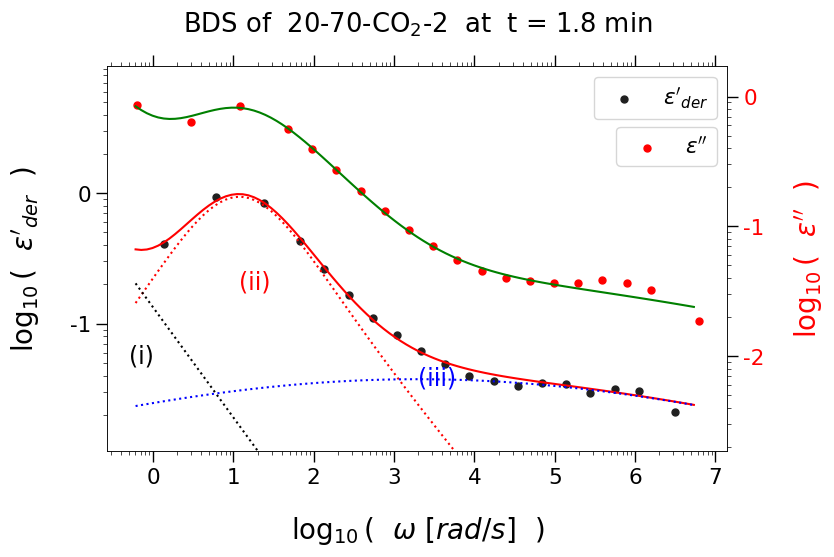

fit score 115781.0
fit parameters [2.242, 0.7684, 10.67, 0.447, 0.2084, 2504.0, 10830000.0, 0.8651, 9.555e-10]


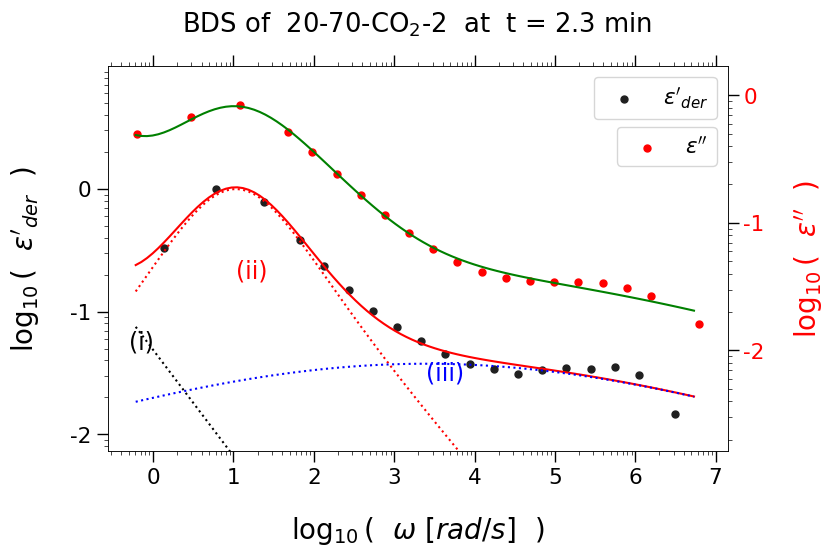

fit score 529731.0
fit parameters [2.573, 0.6744, 6.063, 0.1787, 0.4157, 109400.0, 2015000.0, 1.0, 2.28e-08]


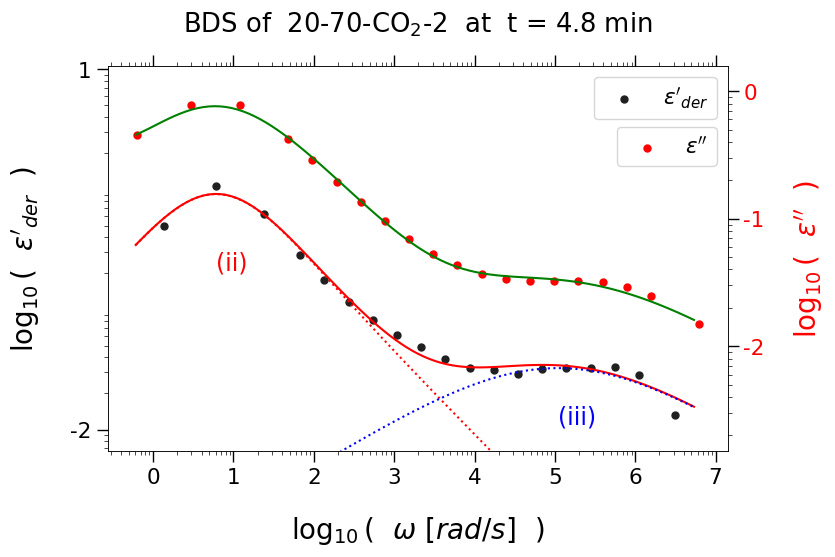

fit score 570320.0
fit parameters [2.68, 0.6597, 4.487, 0.1673, 0.4256, 115100.0, 1895.0, 1.0, 3.327e-06]


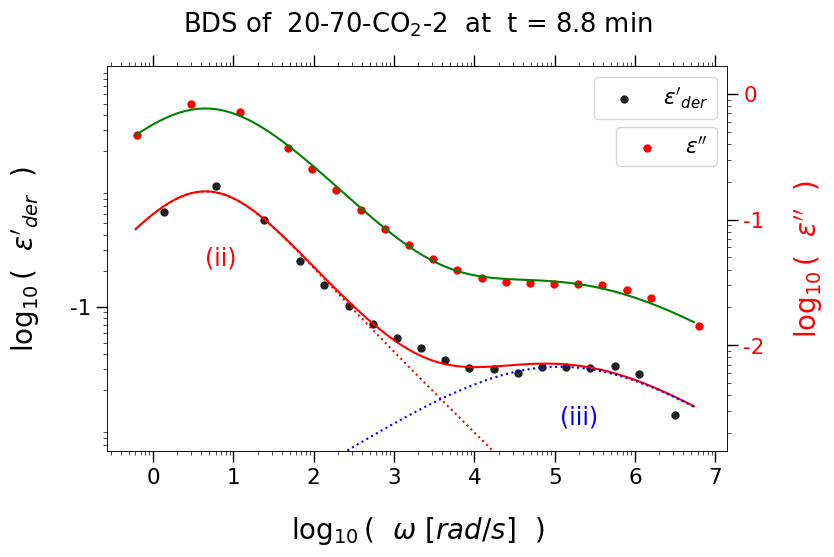

fit score 707133.0
fit parameters [2.719, 0.6537, 3.531, 0.164, 0.4174, 104900.0, 227.5, 1.0, 3.429e-15]


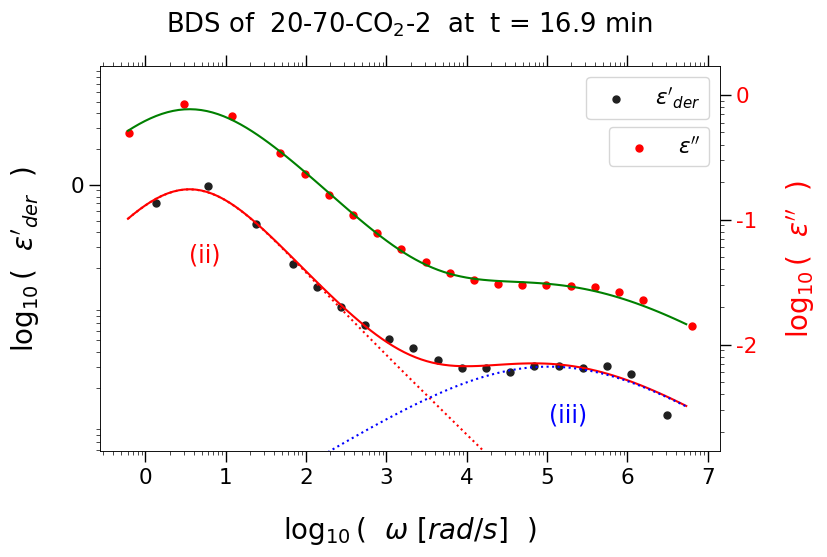

fit score 862224.0
fit parameters [2.715, 0.6564, 3.425, 0.1663, 0.4063, 92990.0, 0.2814, 1.0, 1.111e-12]


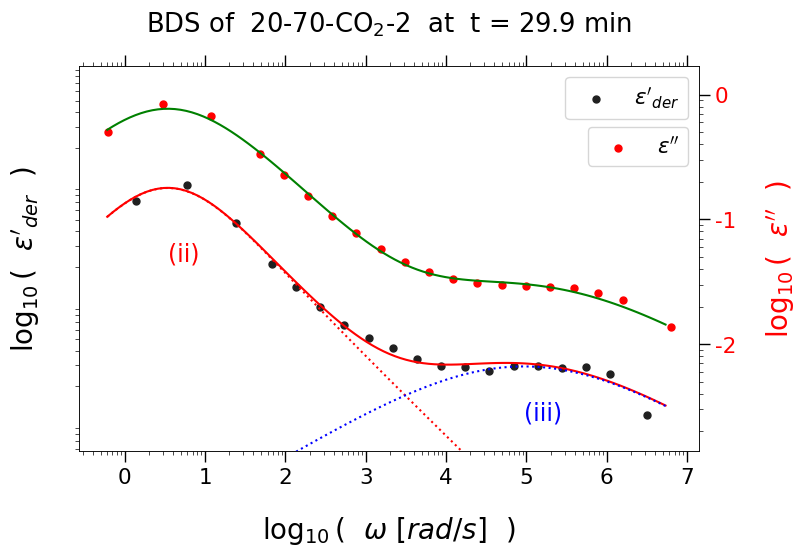

fit score 45637990.0
fit parameters [2.111, 0.7673, 4.233, 0.04414, 0.7096, 322200.0, 4.044, 0.1877, 1.996e-05]


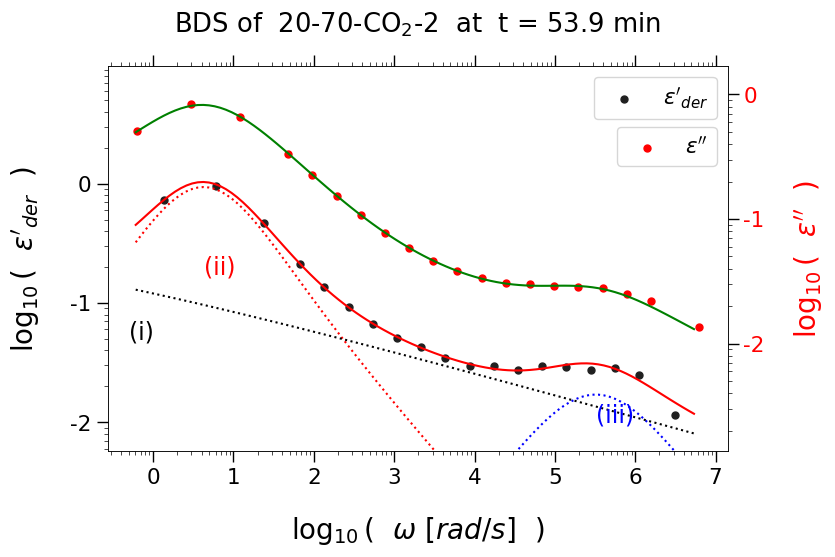

fit score 16430459.0
fit parameters [2.111, 0.7689, 3.801, 0.04095, 0.6852, 284300.0, 2.746, 0.1959, 0.0002979]


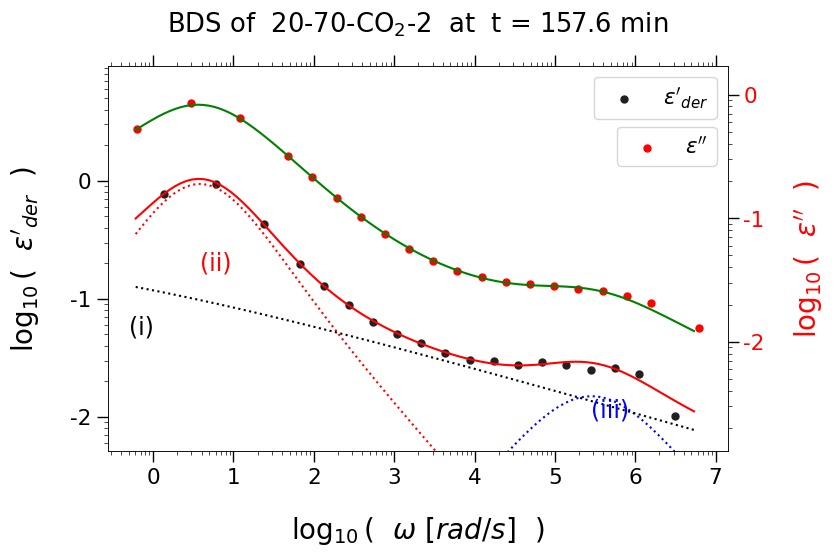

fit score 1285390.0
fit parameters [2.693, 0.6679, 3.157, 0.1789, 0.3694, 49420.0, 347800.0, 1.0, 5.864e-26]


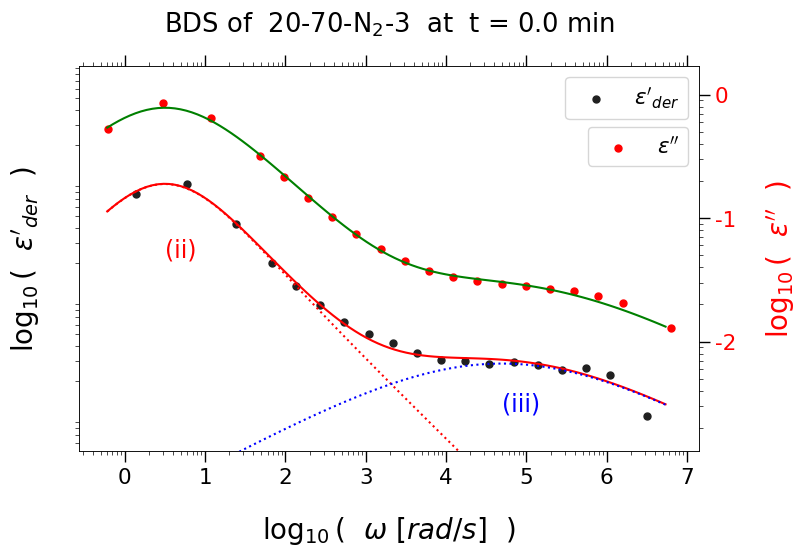

fit score 62594.0
fit parameters [2.541, 0.6399, 2.466, 1.269, 0.1837, 1.0, 9.14, 1.0, 9.622000000000003e-37]


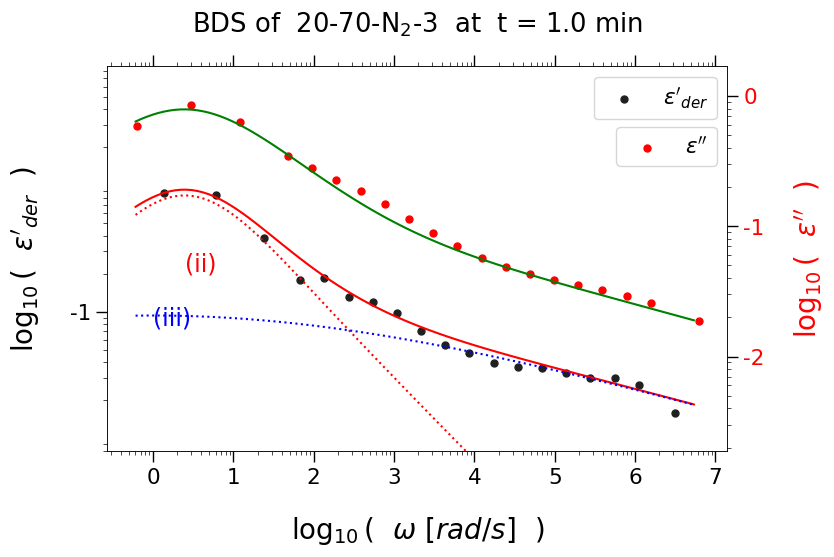

fit score 7726414.0
fit parameters [2.021, 0.7524, 142.9, 0.5624, 0.2652, 3103.0, 7.771, 0.9274, 0.1388]


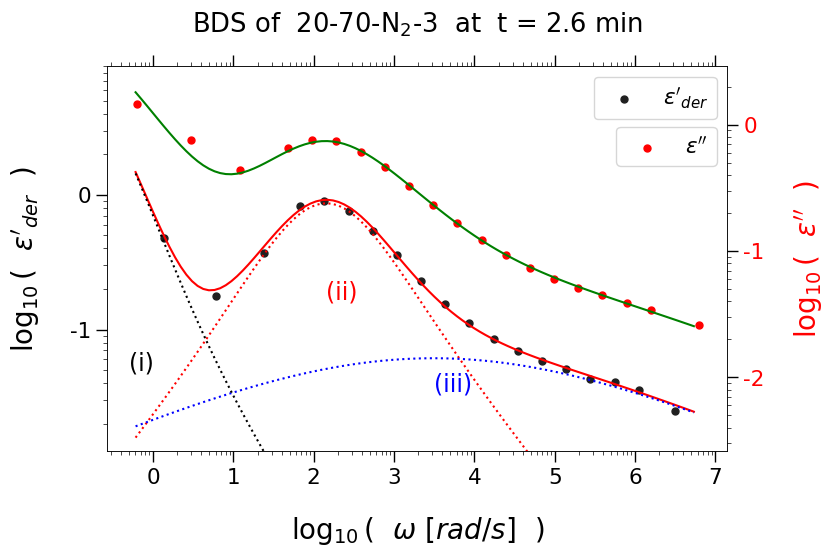

fit score 29665793.0
fit parameters [1.94, 0.7763, 261.8, 0.7333, 0.2868, 2134.0, 31.78, 0.8323, 0.04861]


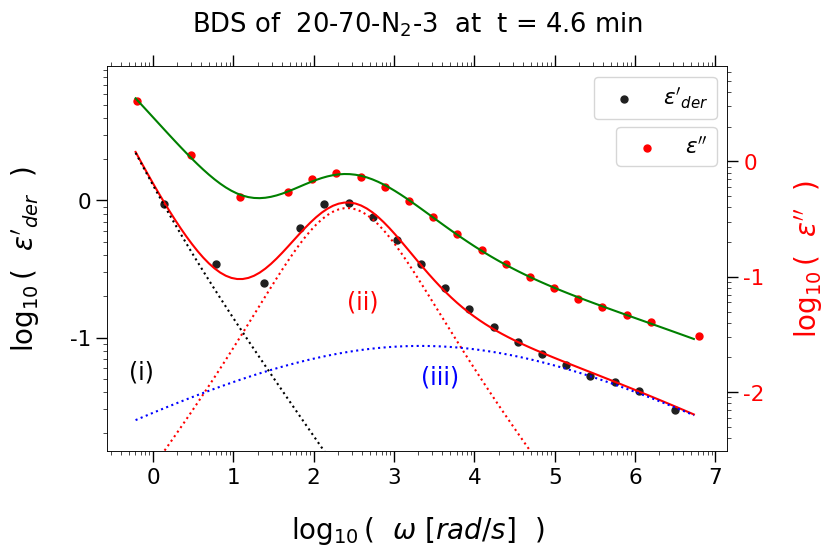

fit score 31618469.0
fit parameters [1.788, 0.75, 395.9, 0.8735, 0.3259, 3333.0, 88.51, 0.7728, 0.01972]


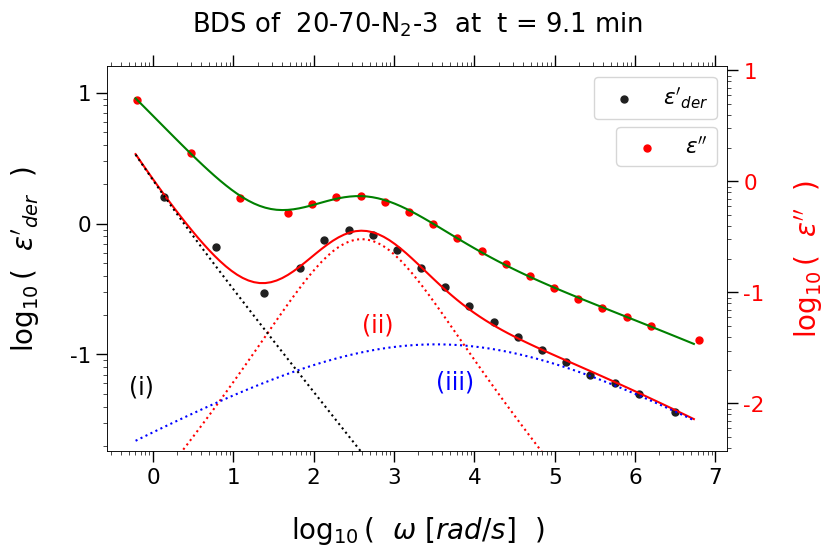

fit score 272936835.0
fit parameters [1.492, 0.7737, 491.2, 1.195, 0.356, 3331.0, 905.2, 0.7408, 0.001147]


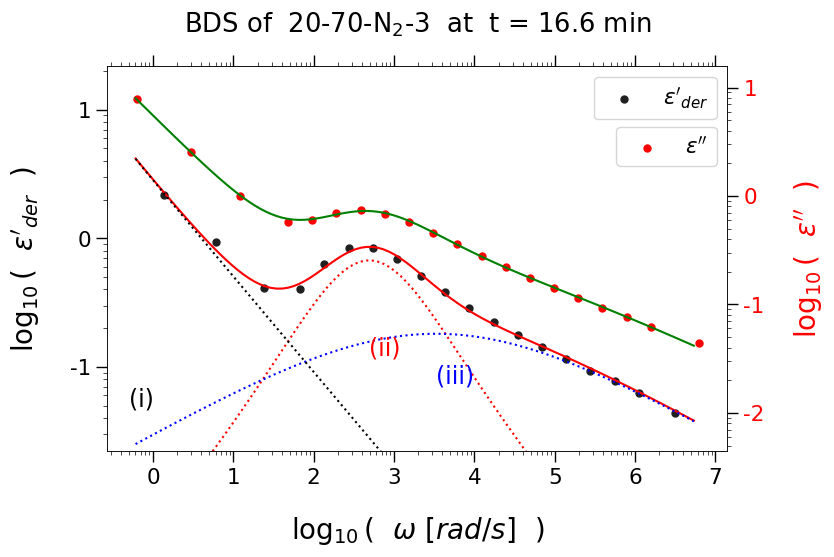

fit score 561160212.0
fit parameters [1.387, 0.7902, 618.9, 1.329, 0.3617, 4595.0, 7384.0, 0.7381, 0.0001013]


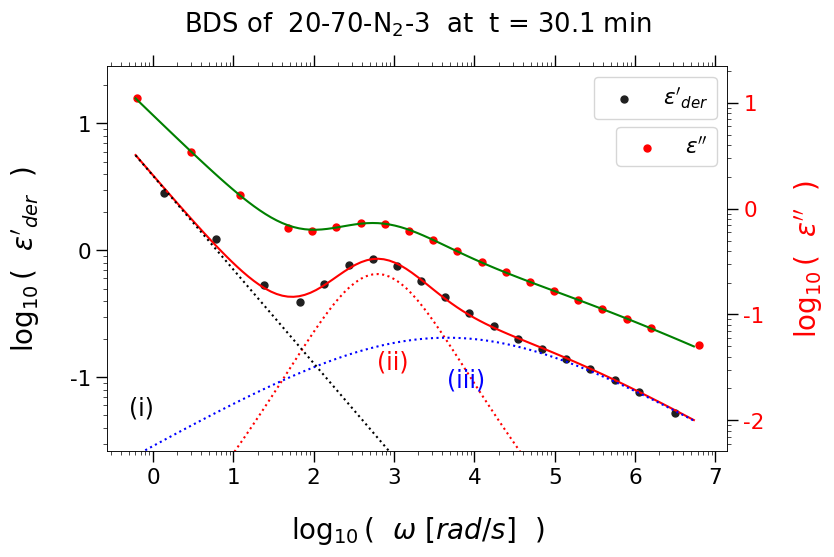

fit score 1040921756.0
fit parameters [1.305, 0.7953, 751.8, 1.495, 0.3594, 4154.0, 219300.0, 0.746, 1.656e-06]


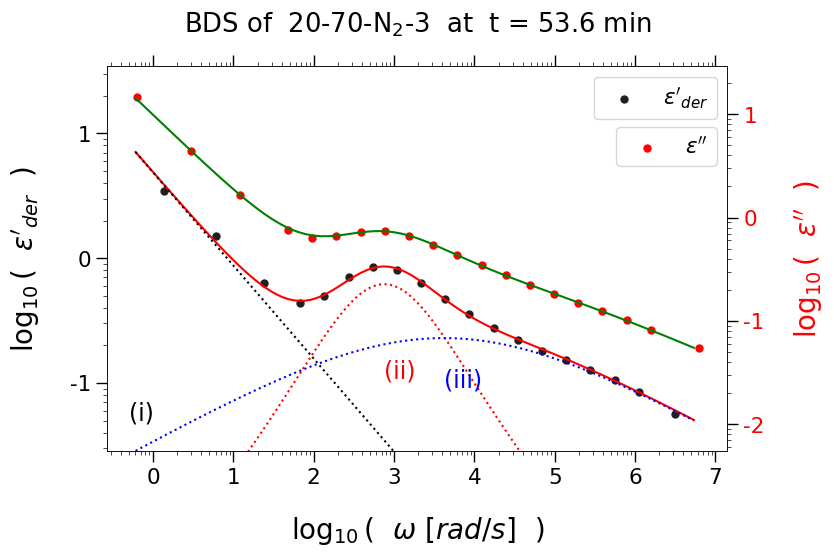

fit score 422015613.0
fit parameters [1.19, 0.813, 889.6, 1.683, 0.3647, 3559.0, 4139000.0, 0.7492, 4.534e-08]


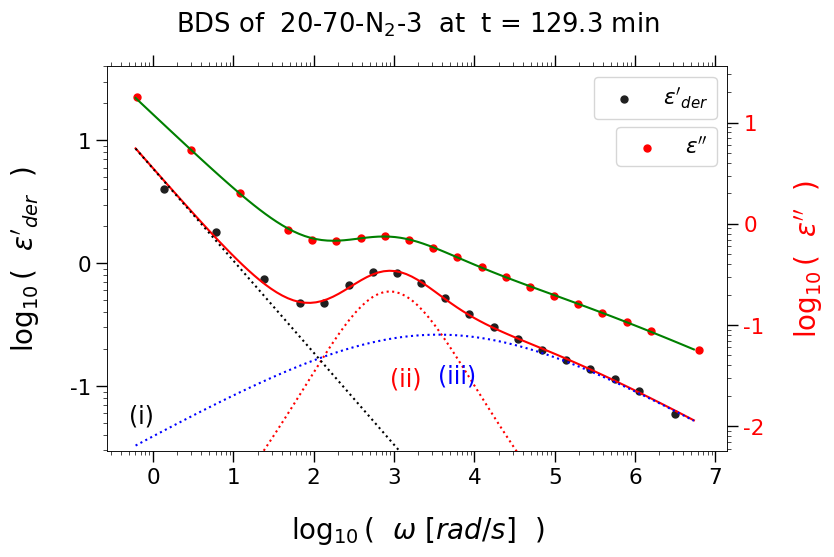

/tmp/ipykernel_111910/274465480.py:29: RuntimeWarning: invalid value encountered in log
  ln_er_der = np.log(er_der)


fit score 192919.0
fit parameters [1.921, 0.6342, 8.967, 0.1759, 0.3647, 66200.0, 2458000.0, 1.0, 6.063e-08]


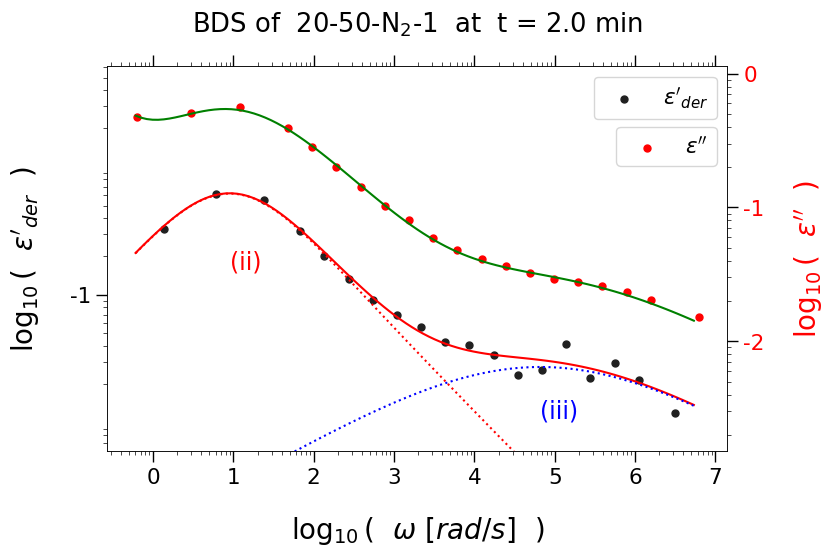

fit score 6674693.0
fit parameters [1.826, 0.6809, 11.36, 0.2453, 0.3065, 17090.0, 1542000.0, 1.0, 1.176e-07]


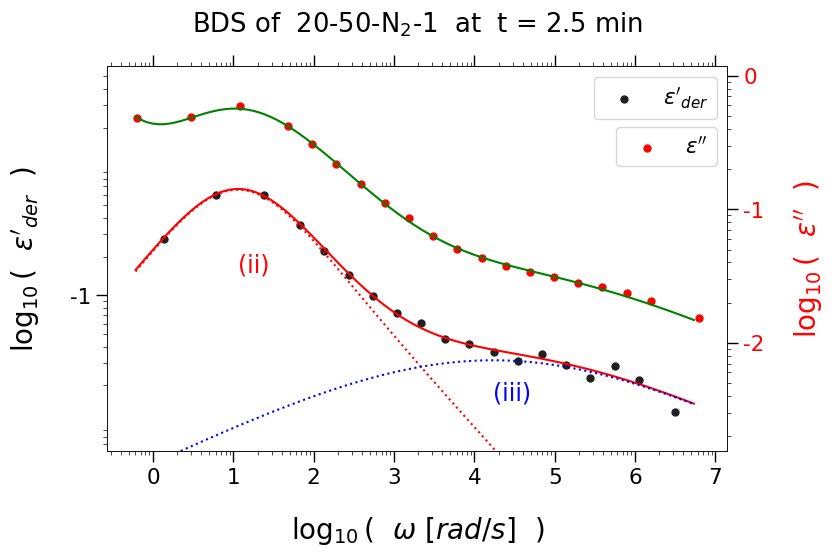

fit score 10812774.0
fit parameters [1.781, 0.6998, 13.21, 0.2643, 0.2957, 12040.0, 1159000.0, 1.0, 1.743e-07]


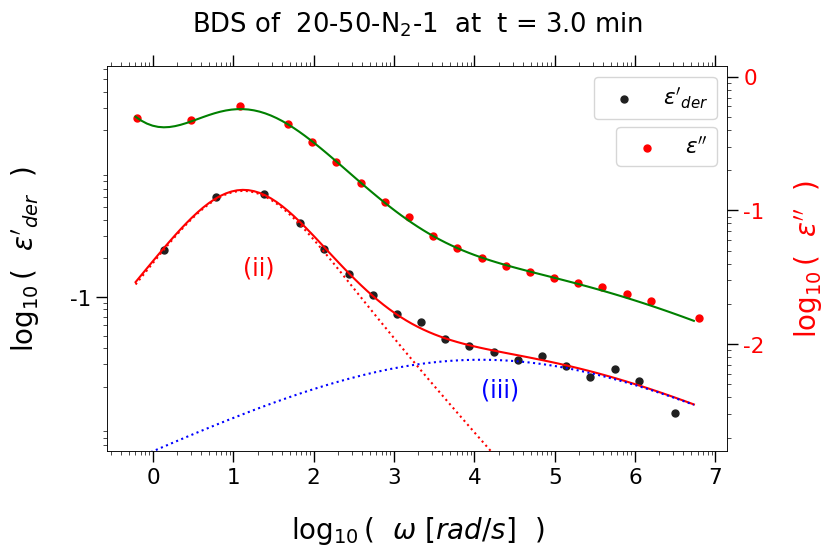

fit score 32709610.0
fit parameters [1.789, 0.7072, 15.64, 0.295, 0.2798, 8558.0, 1252000.0, 1.0, 1.855e-07]


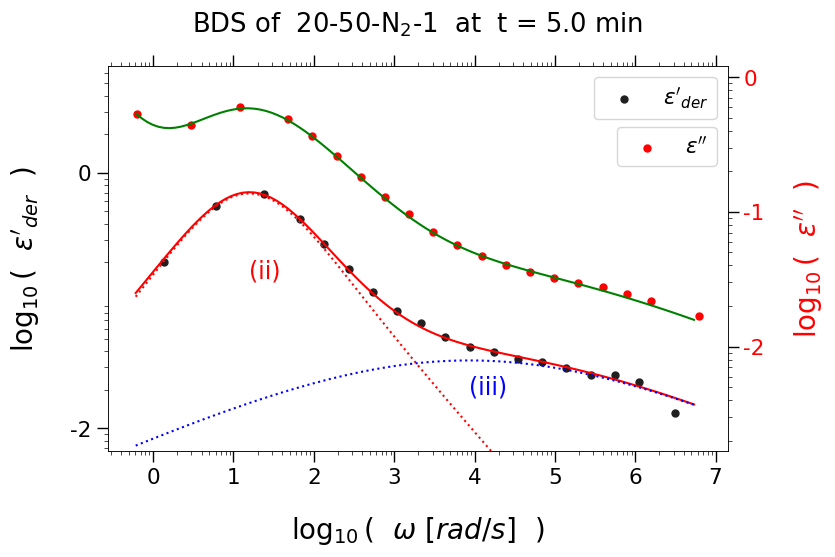

fit score 72462467.0
fit parameters [1.767, 0.7122, 21.5, 0.3159, 0.2722, 7706.0, 3562000.0, 1.0, 8.347e-08]


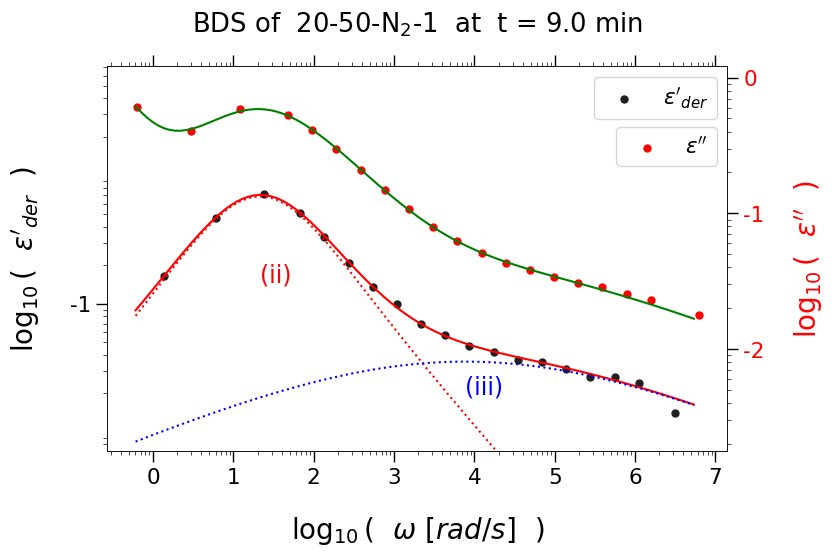

fit score 114886283.0
fit parameters [1.665, 0.7209, 31.57, 0.3975, 0.2476, 3031.0, 17910000.0, 0.9643, 1.182e-08]


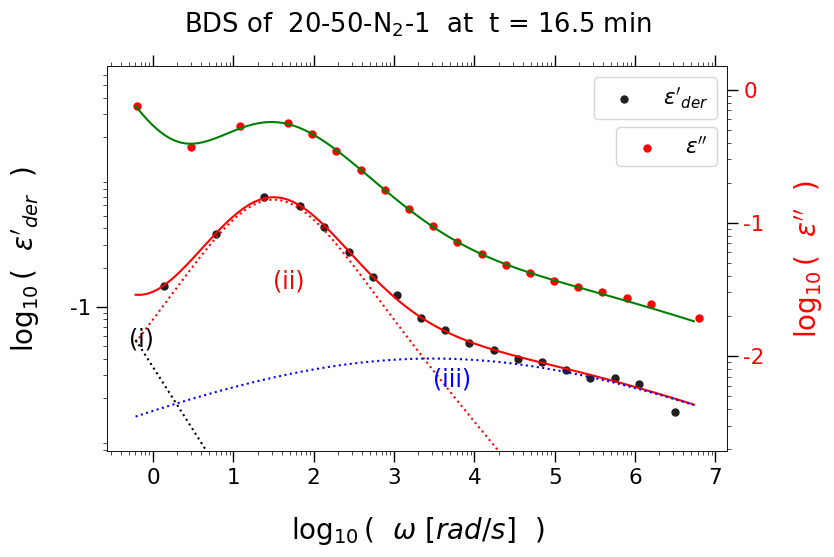

fit score 152454769.0
fit parameters [1.508, 0.7375, 53.95, 0.5699, 0.2348, 659.4, 48420000.0, 0.936, 3.732e-09]


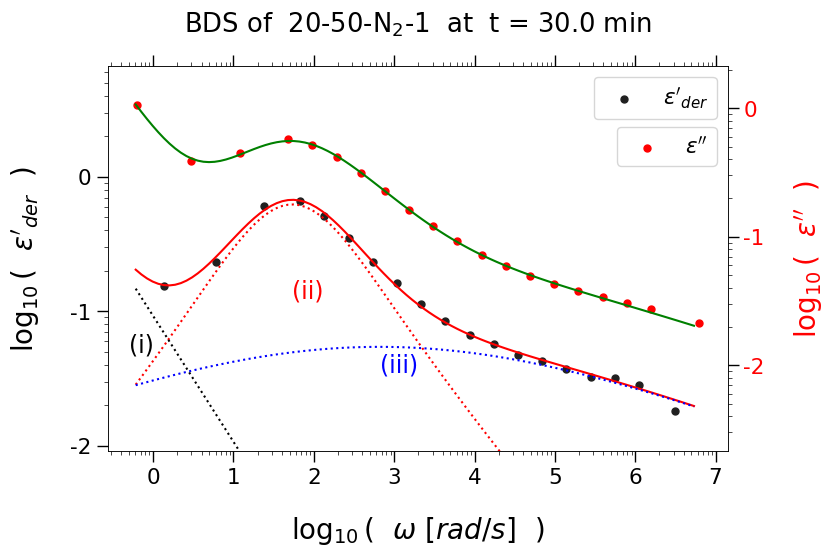

fit score 21556486.0
fit parameters [1.421, 0.7421, 90.86, 0.6012, 0.2742, 1420.0, 59900000.0, 0.8943, 2.052e-09]


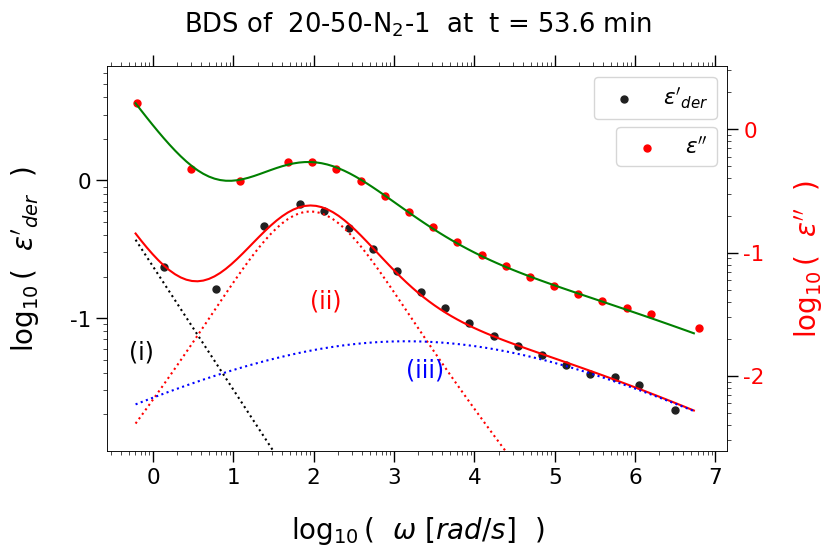

FALLBACK 1:  815.0
FALLBACK 1:  11139.0
fit score 9528150.0
fit parameters [1.322, 0.7568, 126.6, 0.6876, 0.3145, 2497.0, 5276000.0, 0.8768, 3.685e-08]


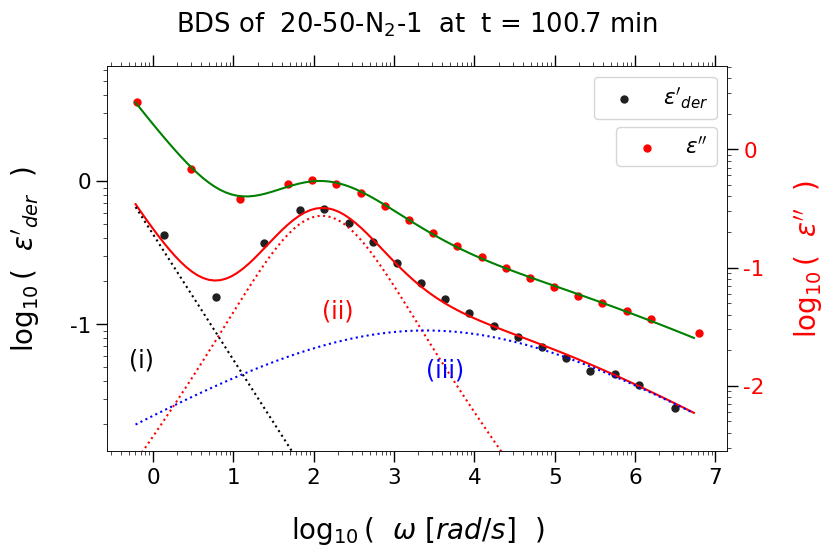

fit score 984.0
fit parameters [0.7551, 0.7644, 76.12, 0.3994, 0.2583, 1385.0, 29260000.0, 0.8265, 2.315e-09]


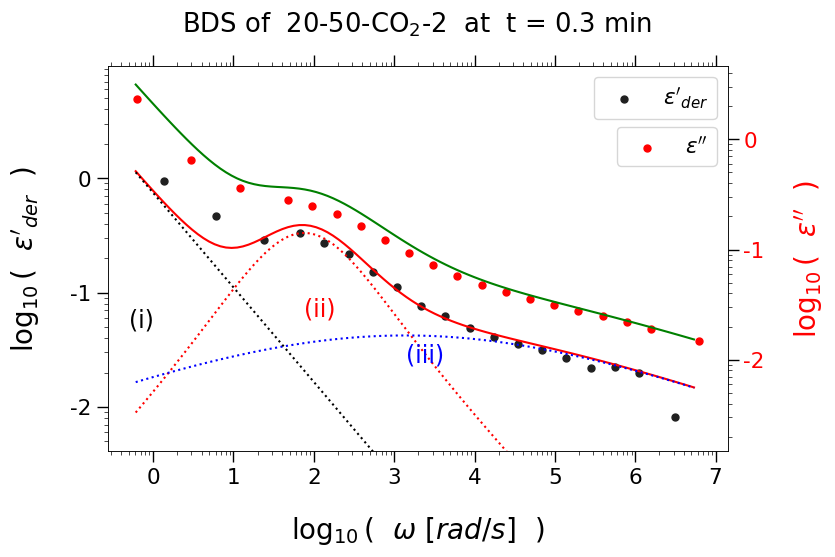

fit score 204.0
fit parameters [0.4577, 0.6864, 44.35, 0.3291, 0.216, 1315.0, 24550000.0, 0.8159, 1.747e-09]


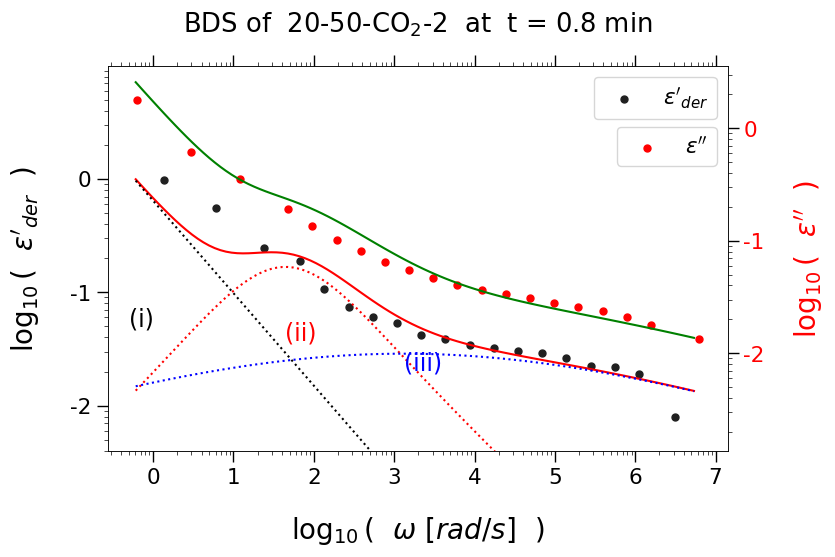

fit score 783.0
fit parameters [0.313, 0.6316, 16.63, 0.2833, 0.2689, 1780.0, 15590000.0, 0.8012, 1.317e-09]


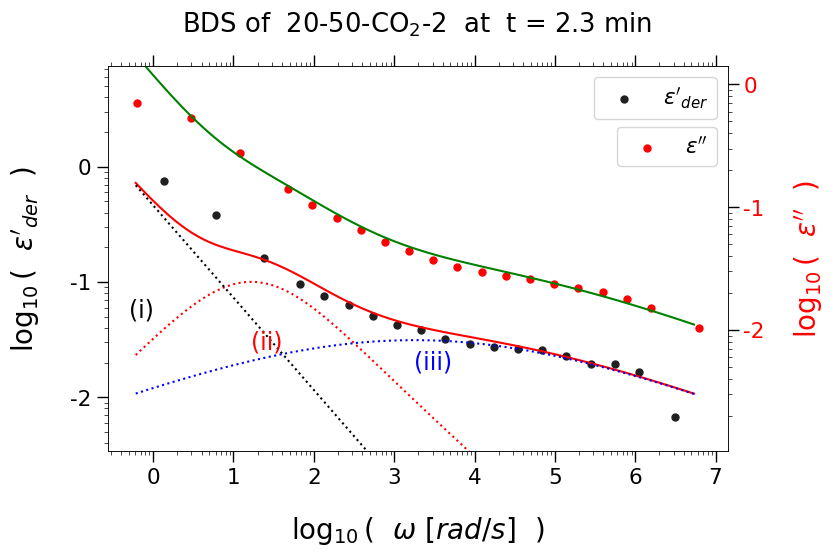

fit score 13092.0
fit parameters [0.4727, 0.6043, 4.208, 0.2191, 0.2892, 3365.0, 8573000.0, 0.7568, 4.442e-10]


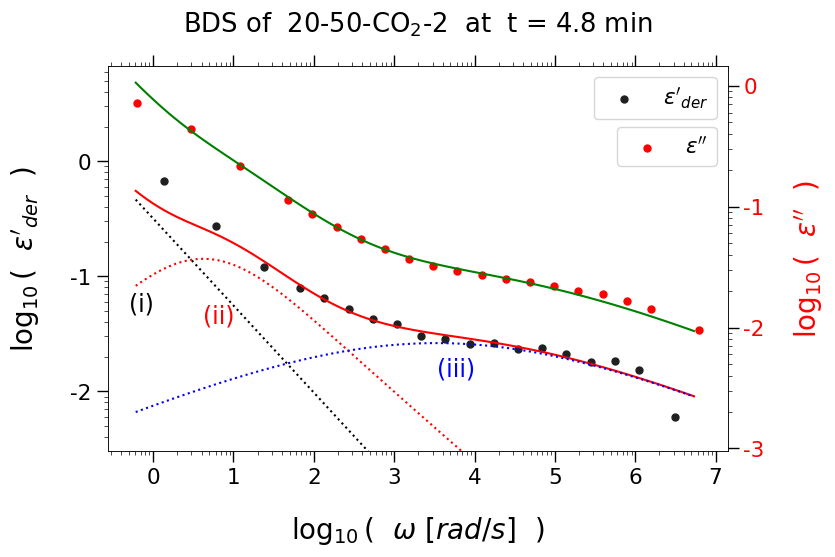

fit score 54075.0
fit parameters [0.6081, 0.5735, 2.046, 0.1738, 0.3294, 8576.0, 3680000.0, 0.7206, 3.477e-10]


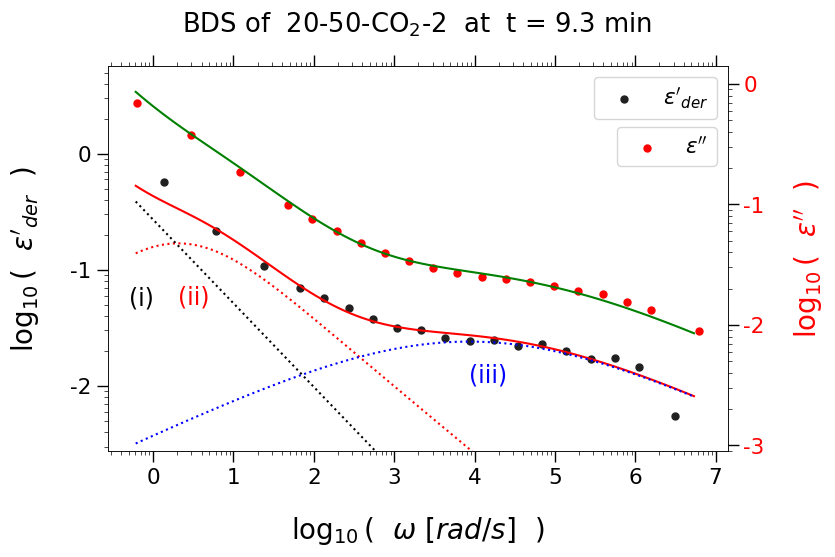

fit score 91383.0
fit parameters [0.8966, 0.5115, 0.6021, 0.1443, 0.3553, 16560.0, 2040000.0, 0.7022, 3.079e-10]


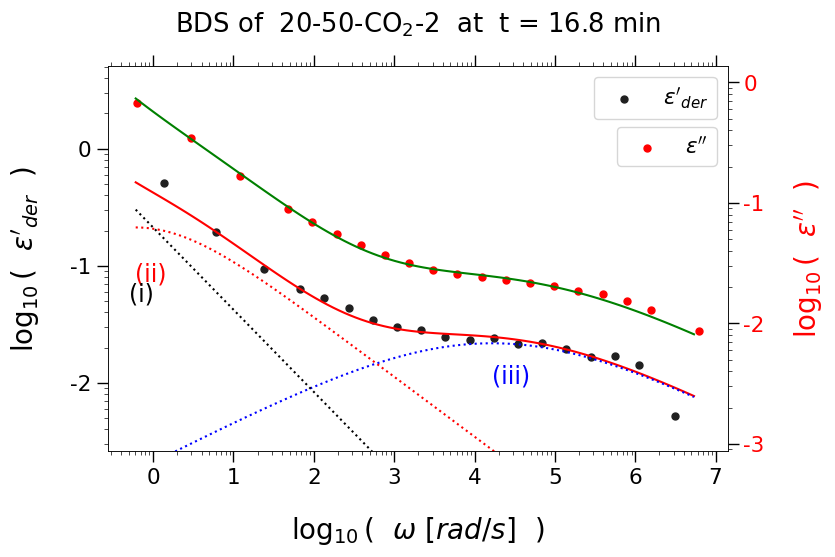

fit score 96564.0
fit parameters [1.13, 0.5013, 0.3495, 0.1387, 0.36, 19250.0, 2040000.0, 0.7075, 3.061e-10]


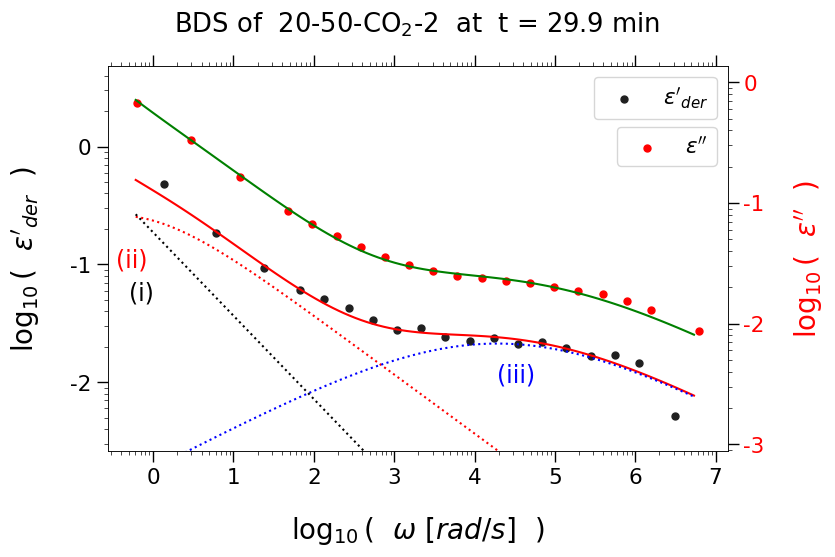

fit score 82731.0
fit parameters [1.13, 0.5013, 0.3495, 0.1387, 0.36, 19250.0, 2040000.0, 0.7075, 3.061e-10]


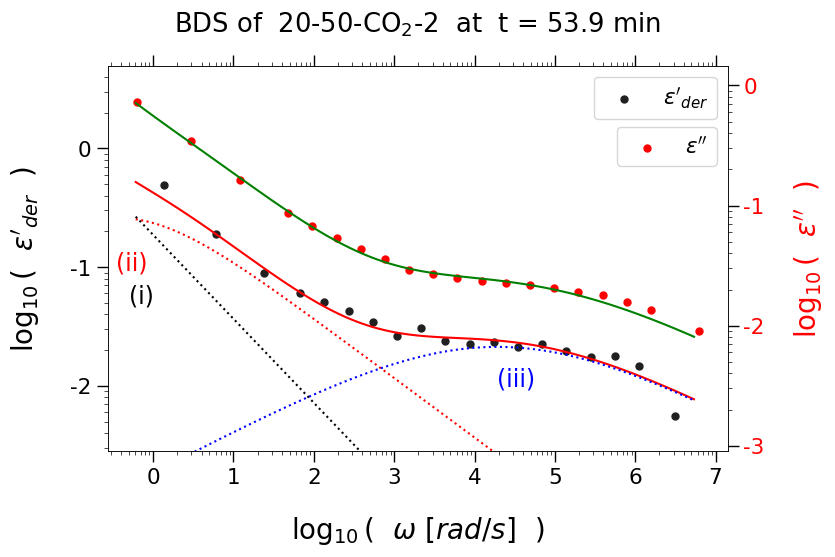

fit score 108634.0
fit parameters [1.13, 0.5013, 0.3495, 0.1387, 0.36, 19250.0, 2040000.0, 0.7075, 3.061e-10]


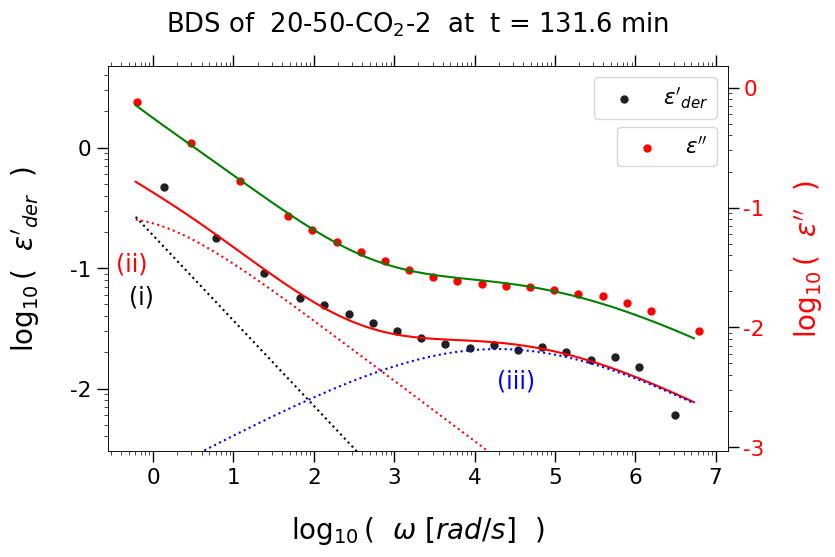

fit score 36274.0
fit parameters [0.7945, 0.685, 11.22, 0.1605, 0.3917, 18920.0, 42100000.0, 1.0, 1.184e-08]


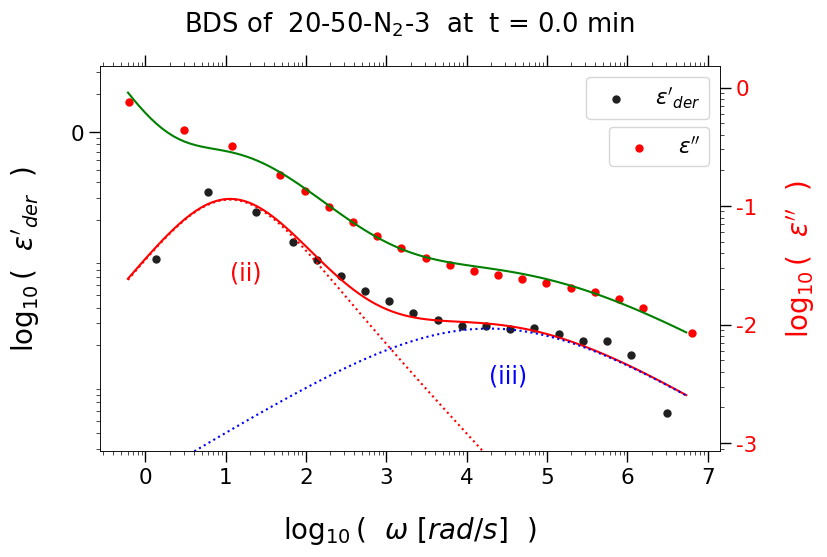

fit score 70070.0
fit parameters [1.133, 0.7875, 11.45, 0.3258, 0.2742, 1278.0, 5219000.0, 1.0, 7.022e-08]


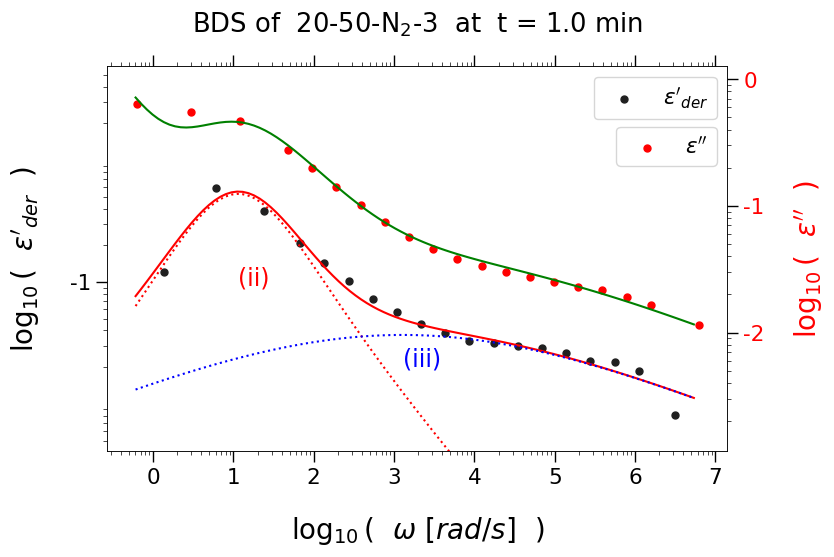

fit score 62541456.0
fit parameters [1.753, 0.6802, 10.87, 0.2528, 0.2934, 13220.0, 2015000.0, 1.0, 9.933e-08]


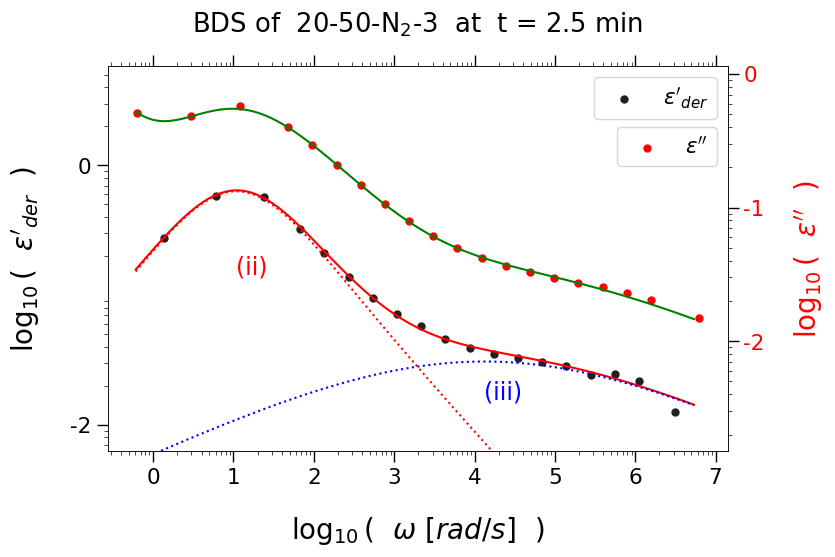

fit score 123518908.0
fit parameters [1.672, 0.7248, 16.29, 0.3407, 0.2525, 3391.0, 889500.0, 1.0, 2.53e-07]


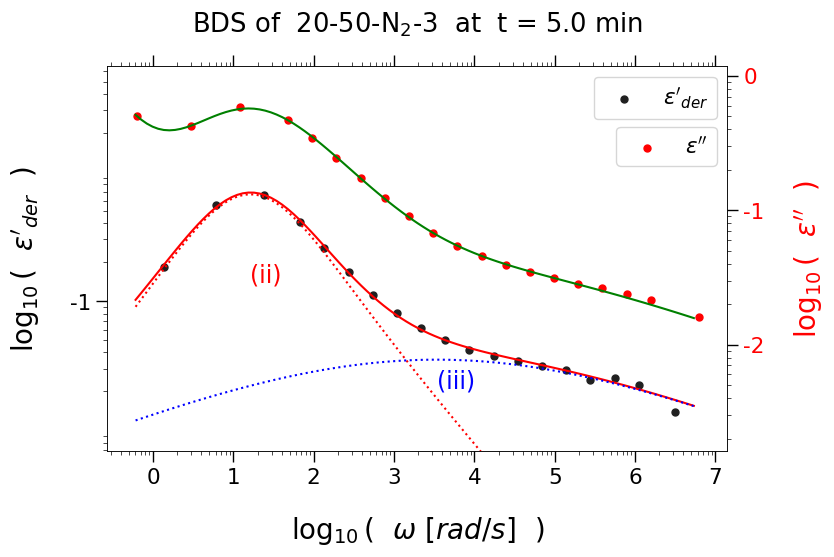

fit score 158983630.0
fit parameters [1.64, 0.7349, 20.63, 0.3901, 0.2389, 1802.0, 415400.0, 1.0, 5.915e-07]


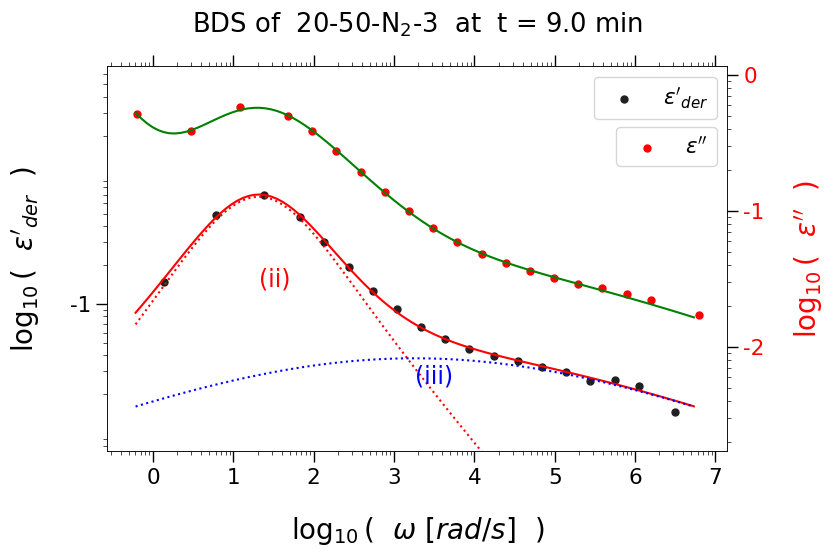

fit score 256064023.0
fit parameters [1.62, 0.7319, 27.88, 0.4253, 0.2348, 1508.0, 1170000.0, 1.0, 2.546e-07]


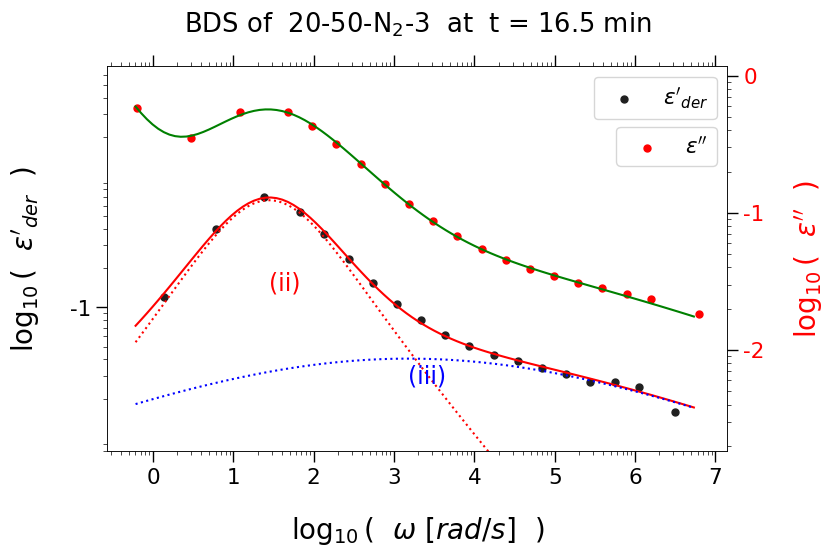

fit score 286011345.0
fit parameters [1.514, 0.7355, 44.48, 0.6291, 0.2151, 222.0, 8265000.0, 0.979, 3.751e-08]


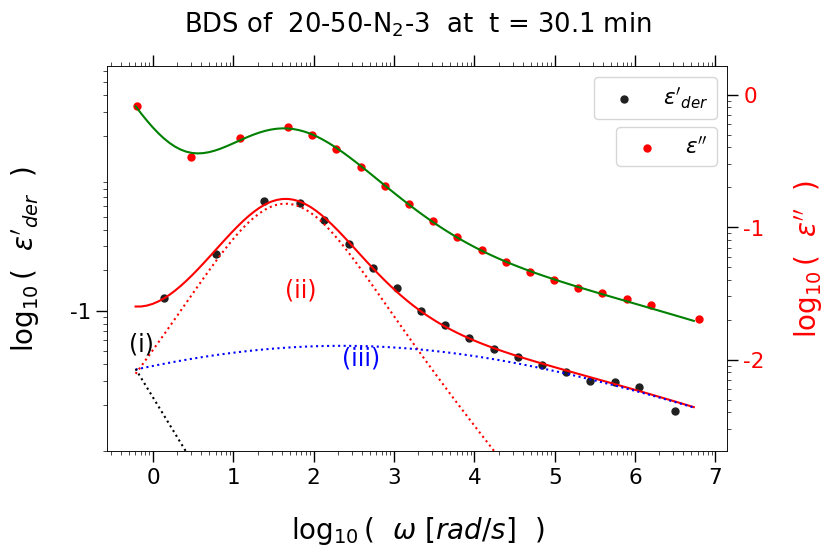

fit score 19140046.0
fit parameters [1.427, 0.7472, 79.01, 0.5911, 0.2636, 1166.0, 16080000.0, 0.9013, 7.856e-09]


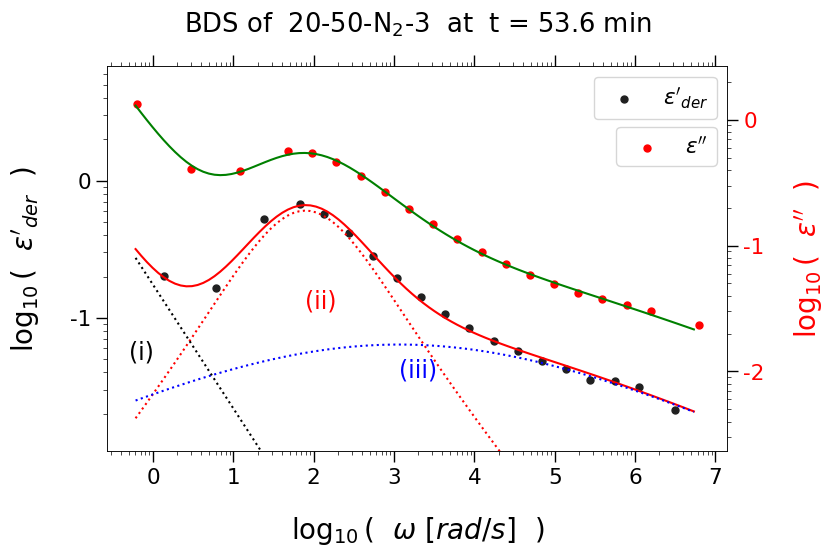

FALLBACK 1:  610.0
fit score 12197.0
fit parameters [1.218, 0.7851, 125.9, 0.73, 0.3122, 1704.0, 3975000.0, 0.7685, 4.28e-09]


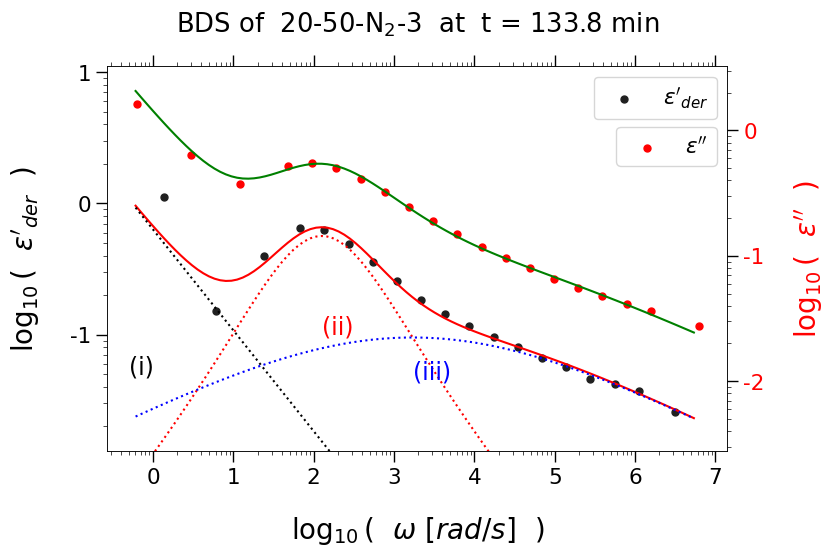

/tmp/ipykernel_111910/274465480.py:29: RuntimeWarning: invalid value encountered in log
  ln_er_der = np.log(er_der)
/tmp/ipykernel_111910/525089787.py:7: RuntimeWarning: invalid value encountered in divide
  return -np.imag(de/den)


FALLBACK 1:  3875993619.0
fit score 3875993619.0
fit parameters [1.883, 0.5876, 17.22, 0.4324, 0.3659, 17630.0, 18.13, 1.0, 0.05729]


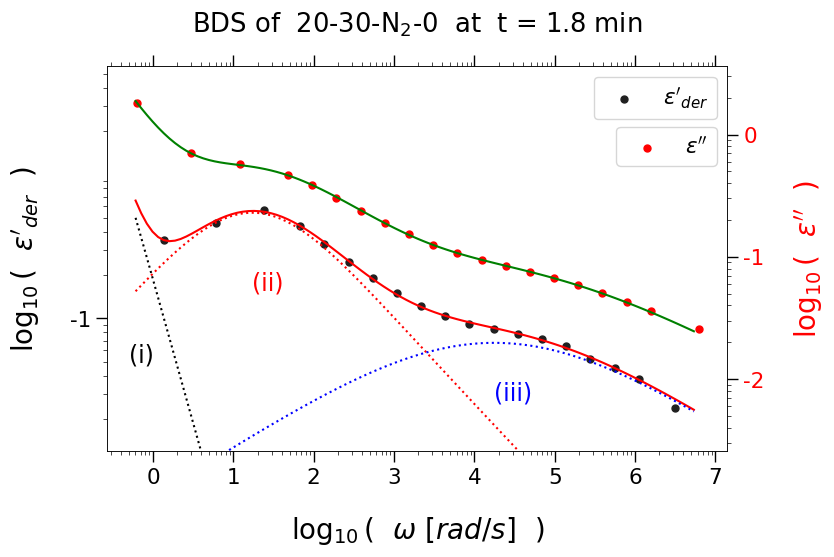

fit score 3889814239.0
fit parameters [1.883, 0.5867, 17.74, 0.429, 0.3668, 18850.0, 16.71, 0.9999, 0.0652]


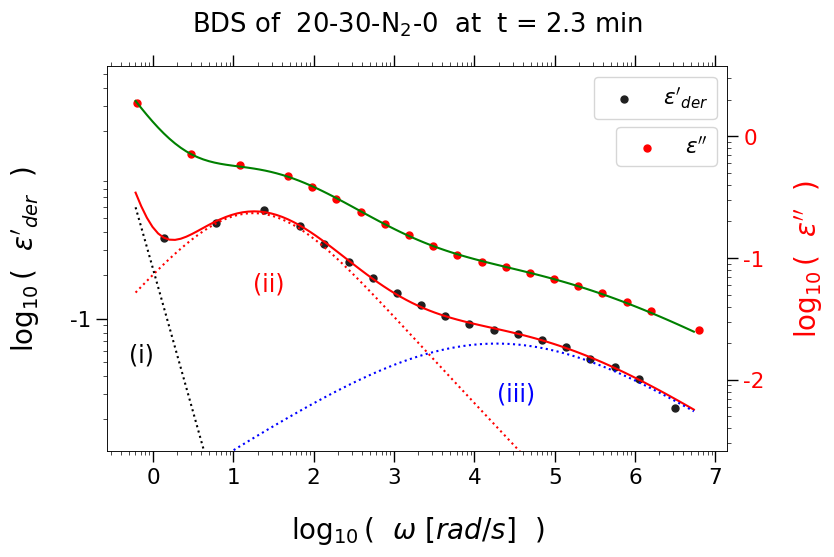

fit score 4740182619.0
fit parameters [1.885, 0.5851, 18.47, 0.4257, 0.369, 20430.0, 15.71, 1.0, 0.07281]


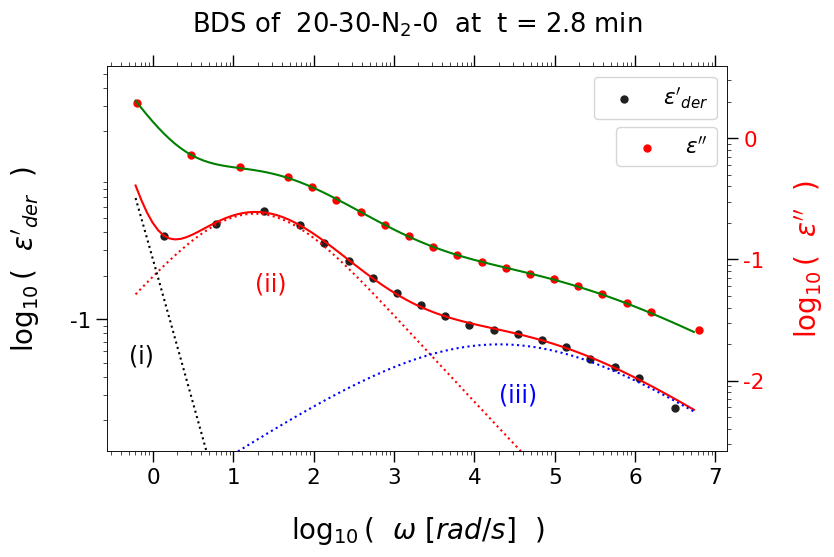

fit score 6618061924.0
fit parameters [1.927, 0.5791, 21.57, 0.407, 0.3806, 28820.0, 16.4, 1.0, 0.08499]


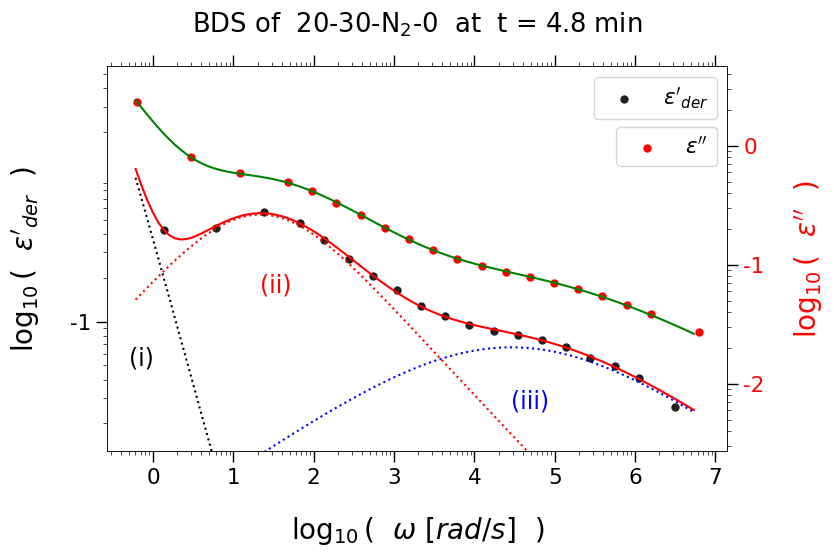

fit score 5500657212.0
fit parameters [1.931, 0.588, 28.98, 0.4081, 0.3907, 38340.0, 17.73, 1.0, 0.1117]


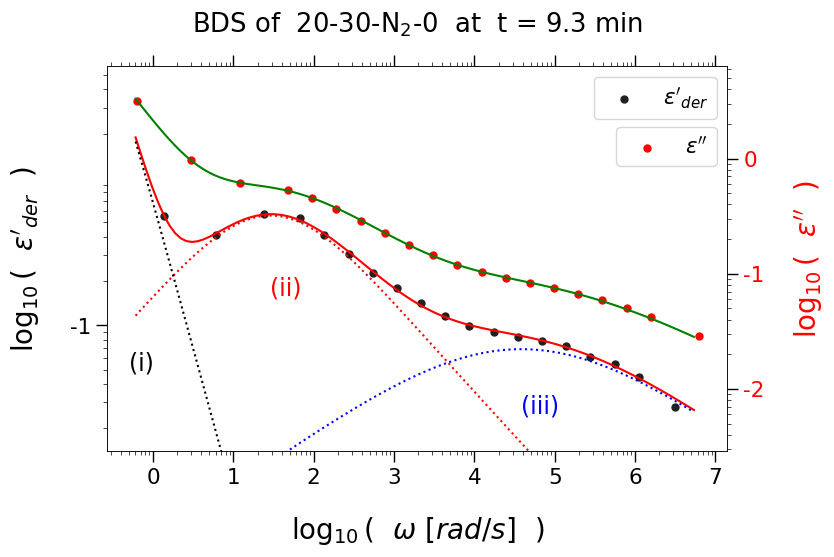

fit score 2836364432.0
fit parameters [1.962, 0.5993, 38.91, 0.411, 0.401, 51070.0, 21.82, 1.0, 0.1305]


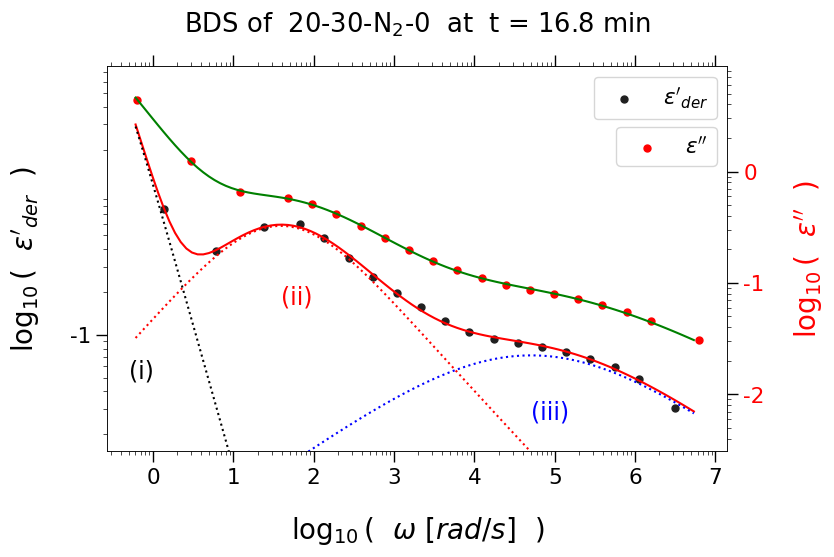

fit score 1628854389.0
fit parameters [1.997, 0.6025, 51.2, 0.3997, 0.4144, 73870.0, 32.15, 0.9794, 0.1204]


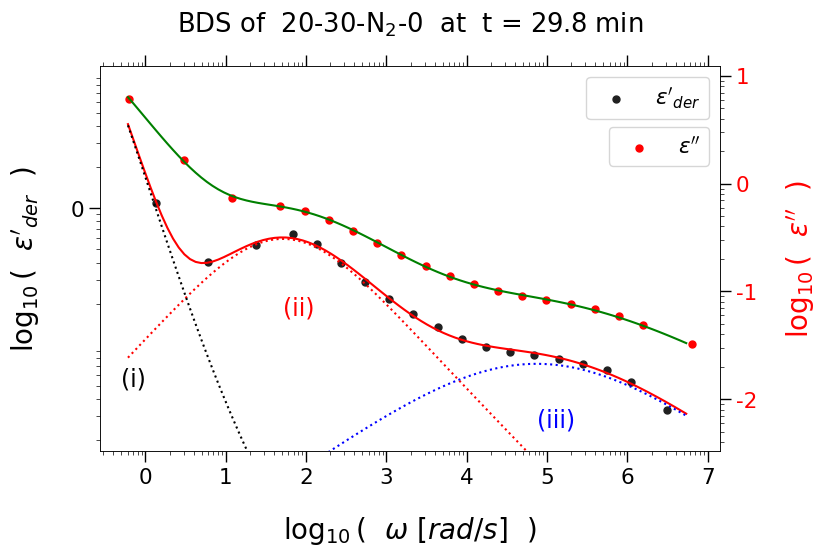

fit score 978337059.0
fit parameters [1.866, 0.6187, 68.42, 0.4044, 0.4106, 85600.0, 64.76, 0.9229, 0.06536]


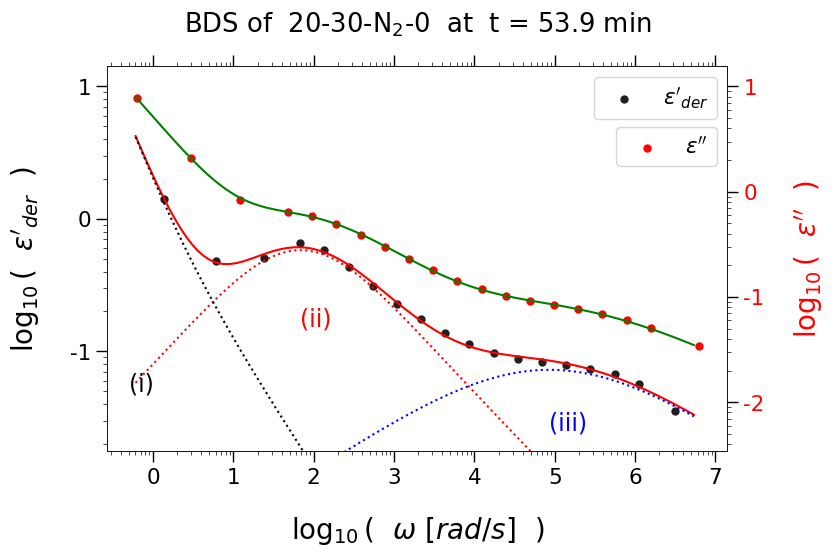

fit score 777226930.0
fit parameters [1.863, 0.6188, 69.0, 0.4034, 0.4103, 86810.0, 66.73, 0.9199, 0.06306]


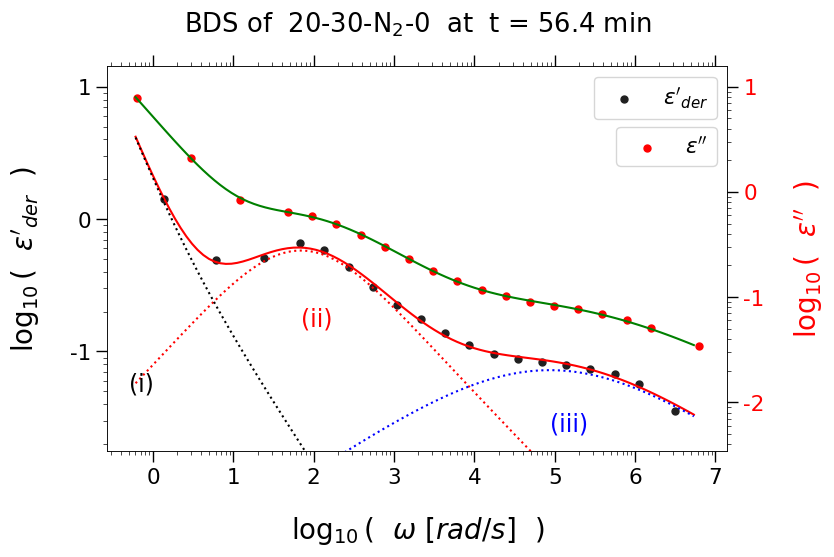

fit score 154022.0
fit parameters [0.09907, 0.7738, 2000.0, 0.1152, 0.5688, 176000.0, 12.28, 0.5602, 0.01493]


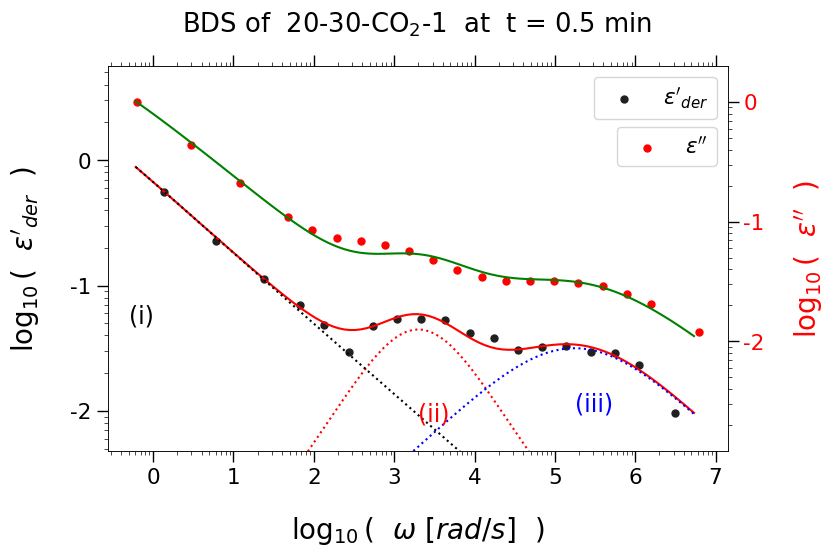

fit score 8346005.0
fit parameters [0.3009, 0.3157, 311.9, 0.04836, 0.7371, 287200.0, 4.681, 0.6967, 0.1134]


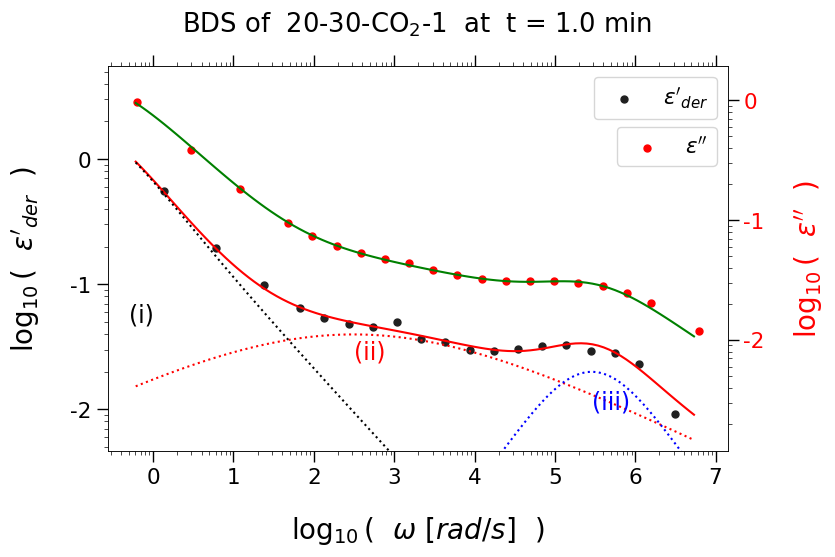

fit score 5200796.0
fit parameters [0.2853, 0.3166, 276.2, 0.04667, 0.738, 283400.0, 7.661, 0.6732, 0.03802]


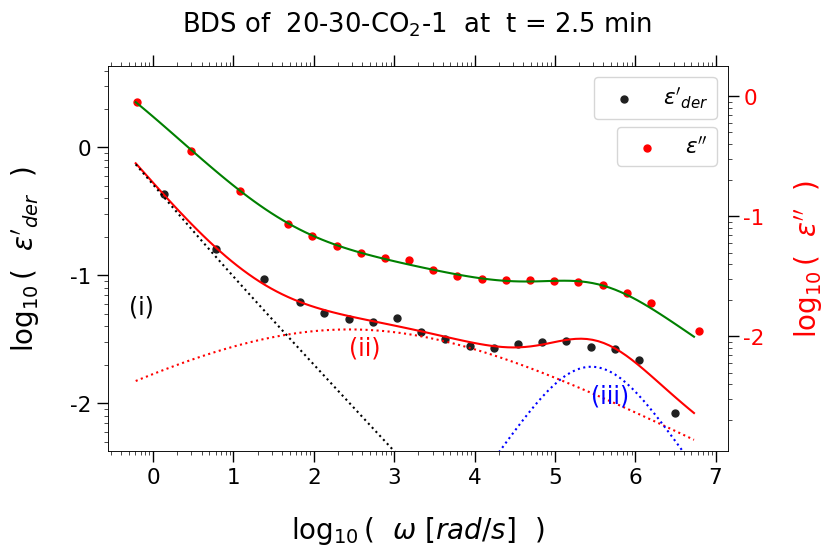

fit score 5478534.0
fit parameters [0.2609, 0.3182, 336.7, 0.04399, 0.7435, 288300.0, 13.09, 0.6624, 0.01357]


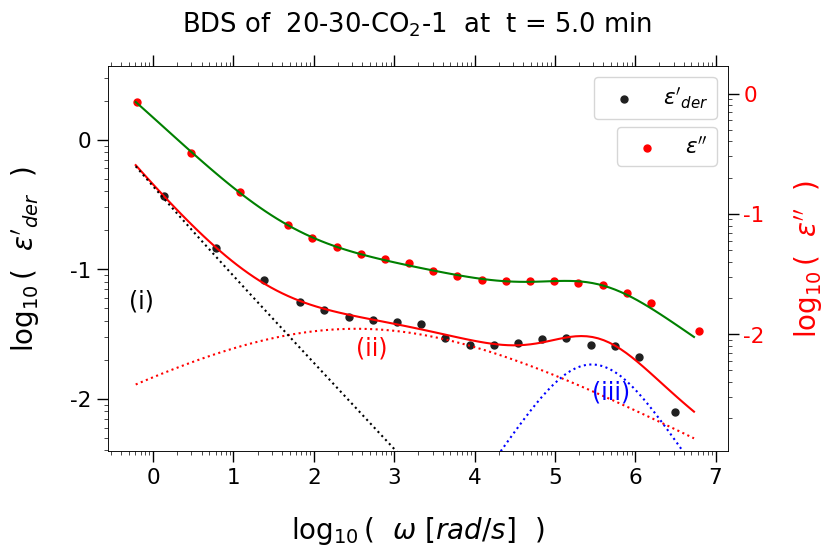

fit score 4291836.0
fit parameters [0.2573, 0.3128, 302.6, 0.04139, 0.7455, 292400.0, 21.66, 0.6709, 0.005978]


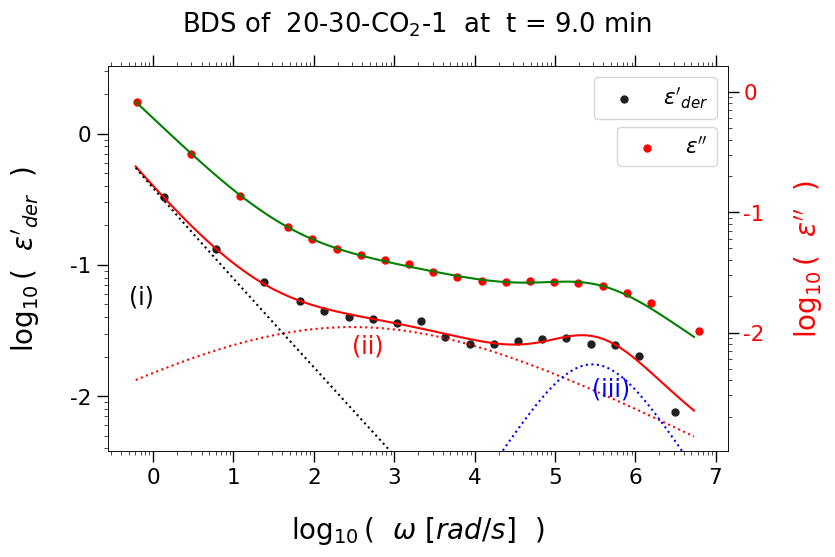

fit score 3807589.0
fit parameters [0.2453, 0.3091, 345.9, 0.03765, 0.7559, 306200.0, 490.3, 0.6672, 4.966e-05]


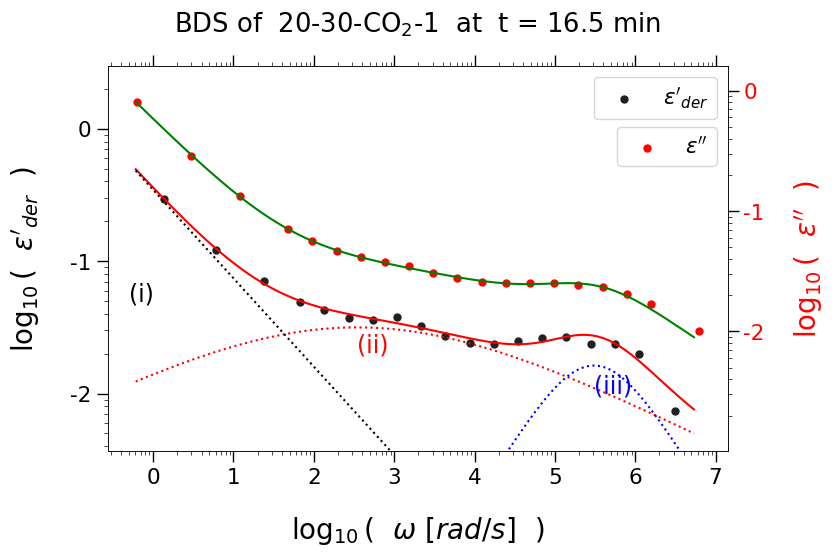

fit score 3654410.0
fit parameters [0.2392, 0.3048, 443.0, 0.03201, 0.7818, 338800.0, 2253.0, 0.683, 6.815e-06]


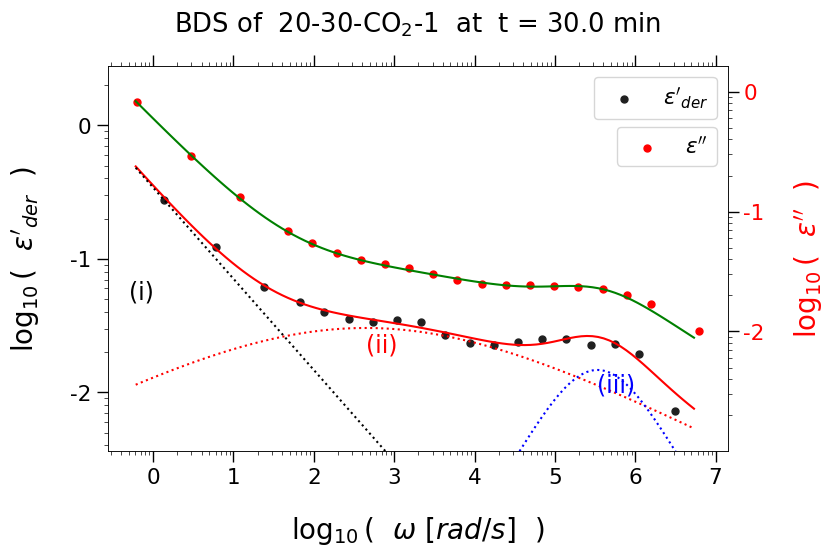

fit score 3514875.0
fit parameters [0.2583, 0.2851, 349.0, 0.02599, 0.8203, 369400.0, 6251.0, 0.7133, 2.891e-06]


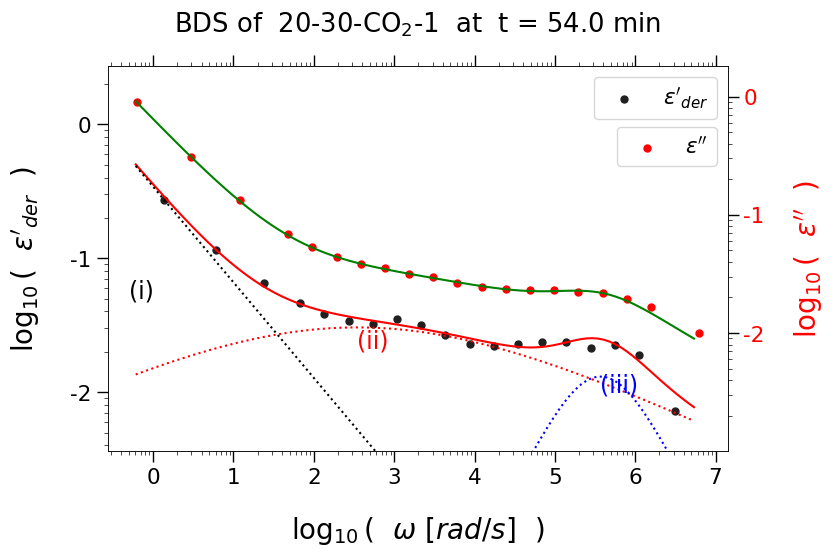

fit score 1766641.0
fit parameters [0.2812, 0.2697, 225.3, 0.02026, 0.8731, 419700.0, 10180.0, 0.7697, 4.478e-06]


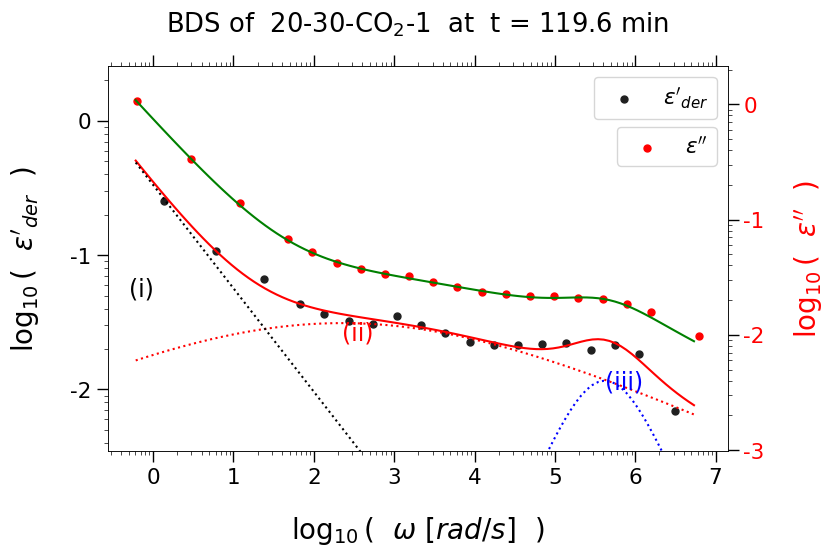

fit score 116682.0
fit parameters [0.3587, 0.8305, 7.055, 0.4125, 0.2201, 256.7, 50110.0, 1.0, 1.449e-05]


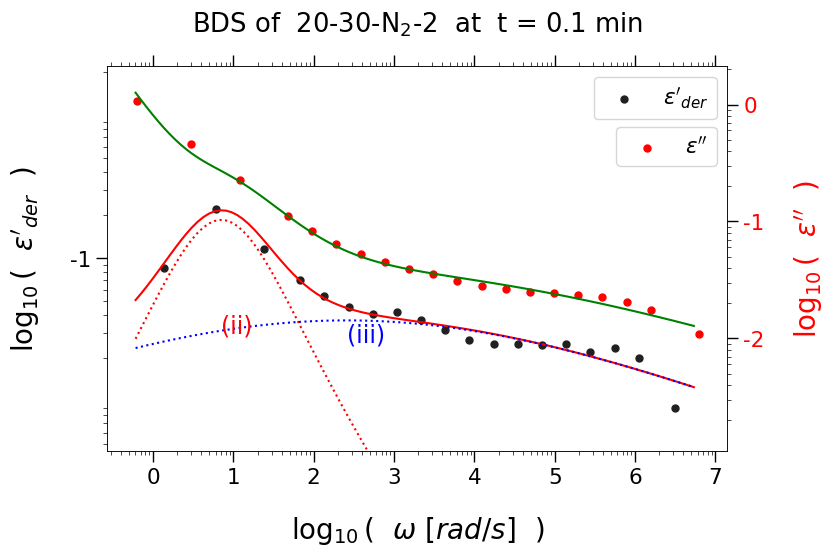

fit score 444285.0
fit parameters [1.205, 0.6406, 2.152, 0.2769, 0.2674, 5059.0, 19340.0, 1.0, 2.95e-05]


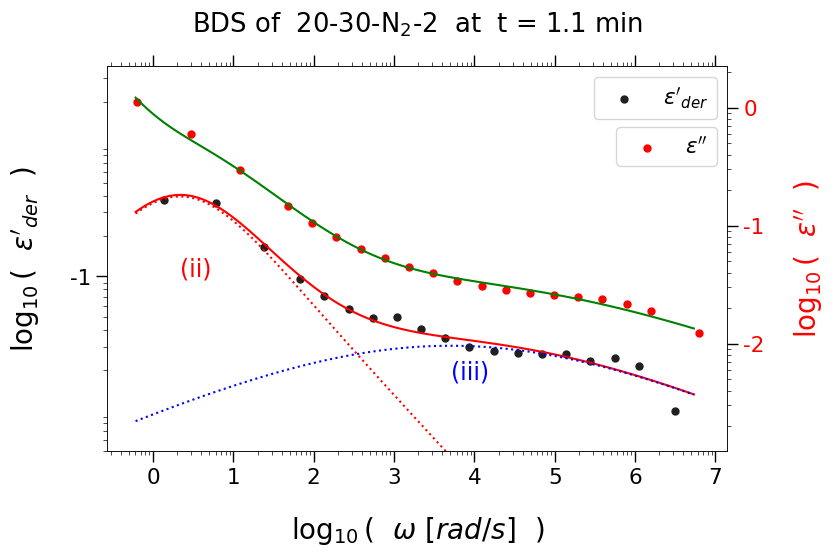

fit score 828292.0
fit parameters [2.373, 0.5682, 0.8062, 0.2201, 0.3079, 21950.0, 14610.0, 1.0, 2.615e-05]


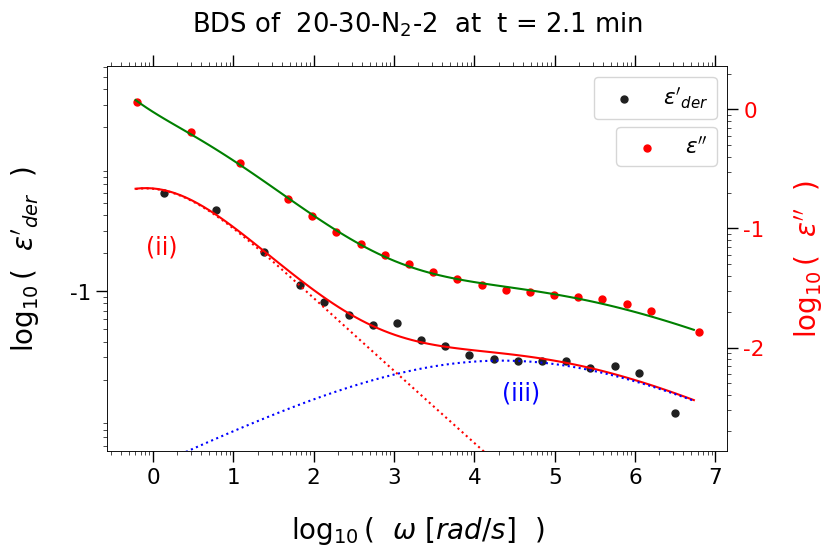

fit score 1387433.0
fit parameters [1.947, 0.6402, 2.192, 0.2771, 0.2774, 8896.0, 15010.0, 1.0, 2.538e-05]


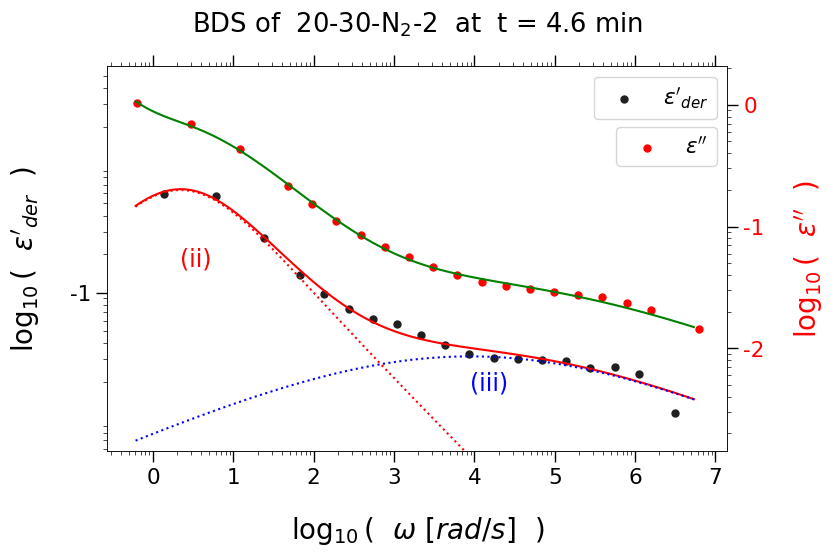

fit score 1990582.0
fit parameters [1.916, 0.6529, 2.872, 0.2763, 0.2811, 9964.0, 13780.0, 1.0, 2.403e-05]


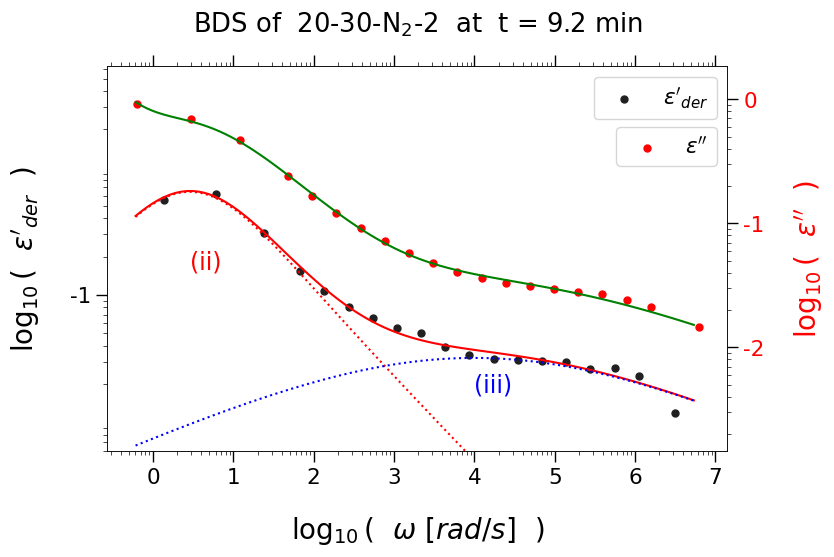

fit score 3384168.0
fit parameters [1.925, 0.6446, 3.309, 0.257, 0.2916, 15980.0, 13030.0, 1.0, 2.255e-05]


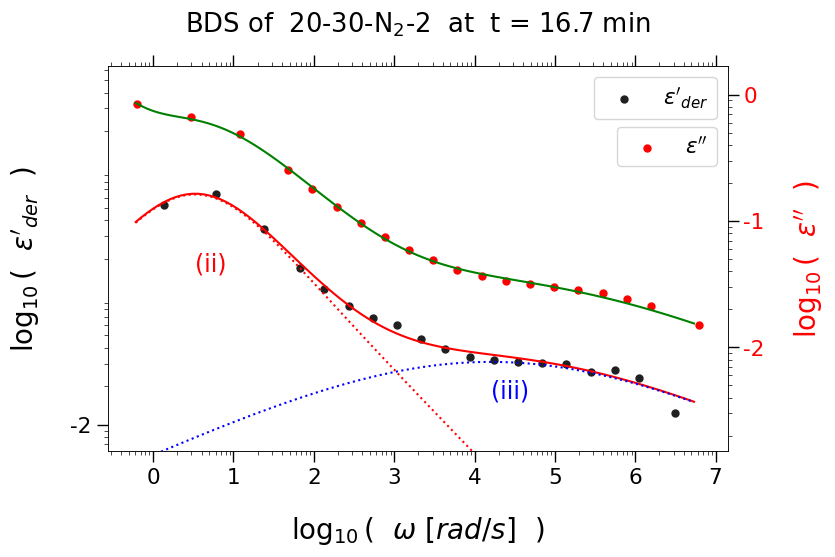

fit score 4814077.0
fit parameters [1.87, 0.6494, 4.422, 0.2664, 0.2861, 16870.0, 14300.0, 1.0, 2.089e-05]


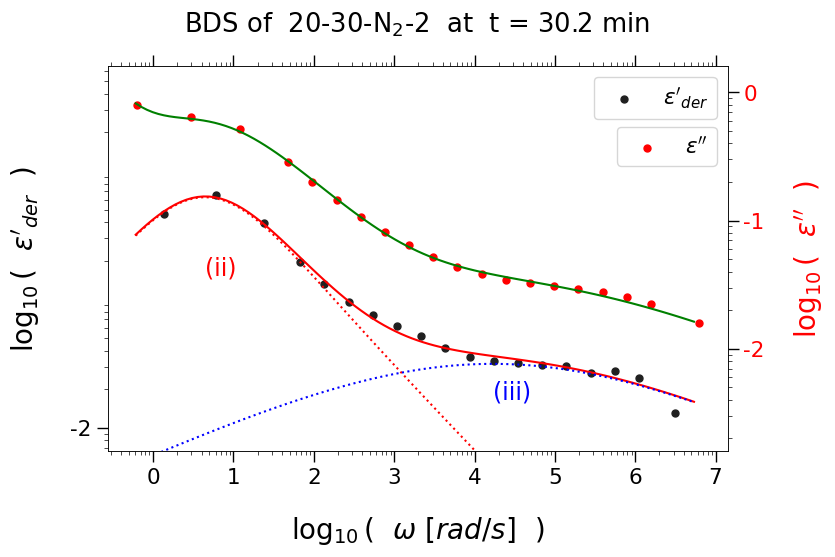

fit score 10124303.0
fit parameters [1.792, 0.6673, 7.228, 0.312, 0.263, 12020.0, 19740.0, 1.0, 1.919e-05]


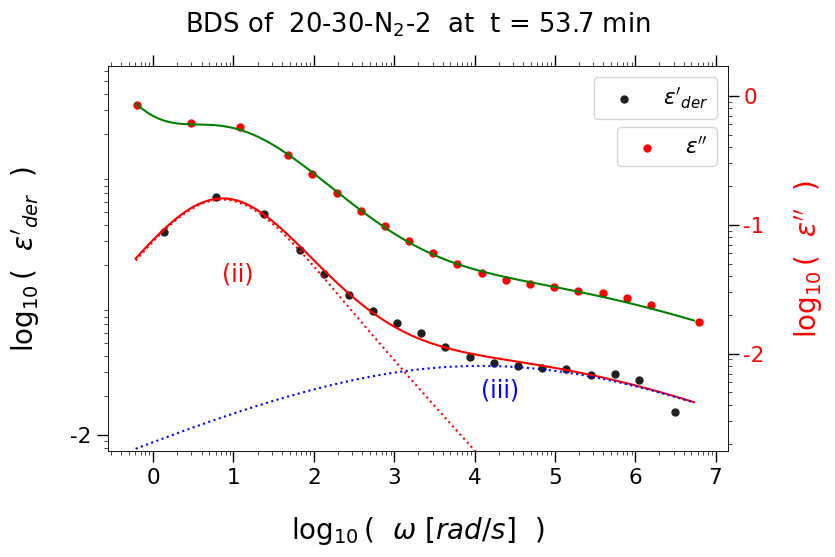

fit score 17652761.0
fit parameters [1.719, 0.6933, 13.45, 0.3812, 0.2429, 6964.0, 76740.0, 1.0, 7.474e-06]


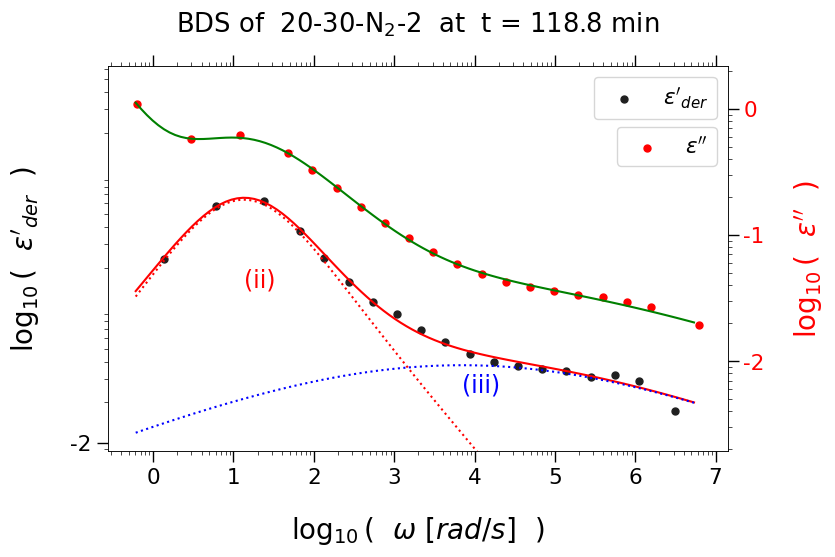

fit score 110492.0
fit parameters [4.657, 0.4118, 0.1819, 0.06284, 0.6134, 405300.0, 291.8, 0.9969, 0.0006558]


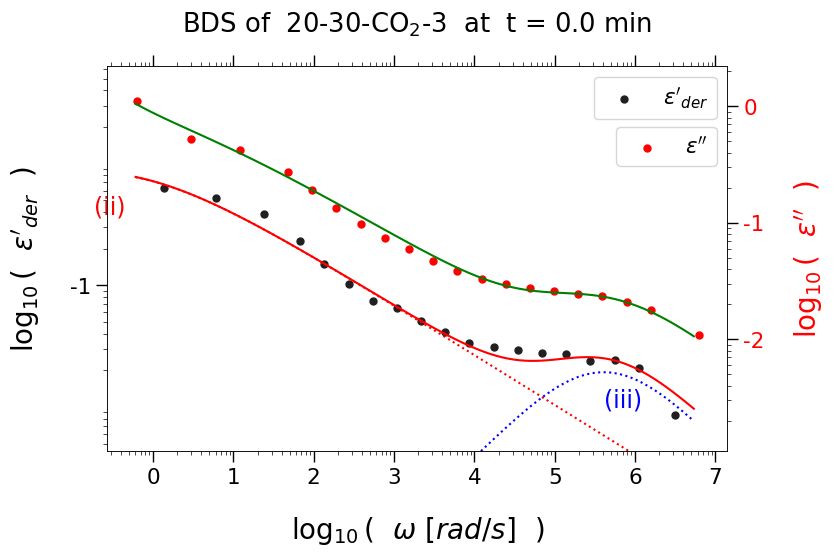

FALLBACK 1:  105511.0
fit score 105511.0
fit parameters [0.1937, 0.3298, 2000.0, 0.02057, 0.8609, 461200.0, 17990.0, 0.6159, 1.569e-07]


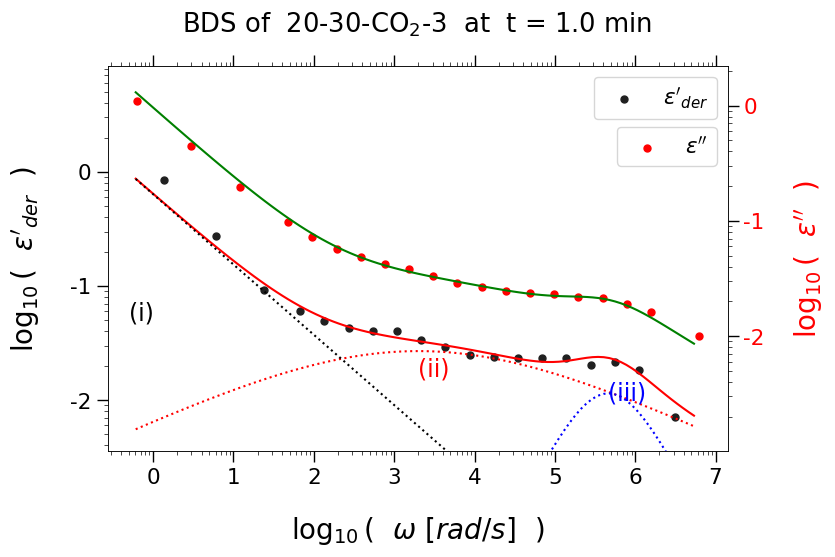

fit score 2395985.0
fit parameters [0.2176, 0.3136, 981.3, 0.02032, 0.8642, 432900.0, 21720.0, 0.6428, 1.643e-07]


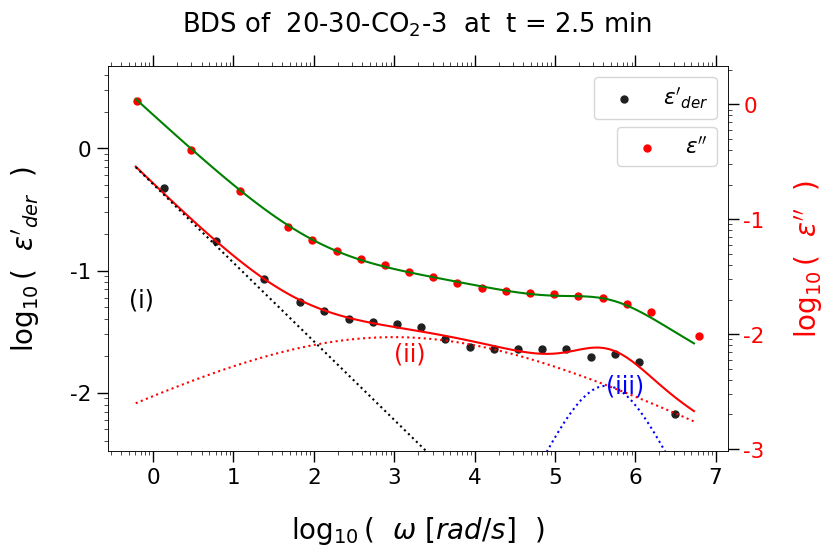

fit score 1660315.0
fit parameters [0.2282, 0.3088, 727.3, 0.01998, 0.8763, 431100.0, 27000.0, 0.6636, 1.65e-07]


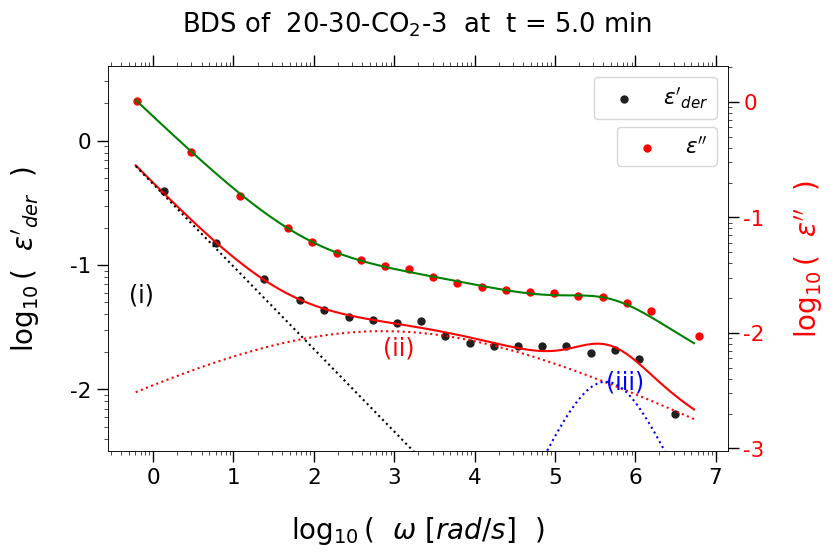

fit score 1942577.0
fit parameters [0.2361, 0.3033, 532.4, 0.02085, 0.8635, 414900.0, 29110.0, 0.682, 2.08e-07]


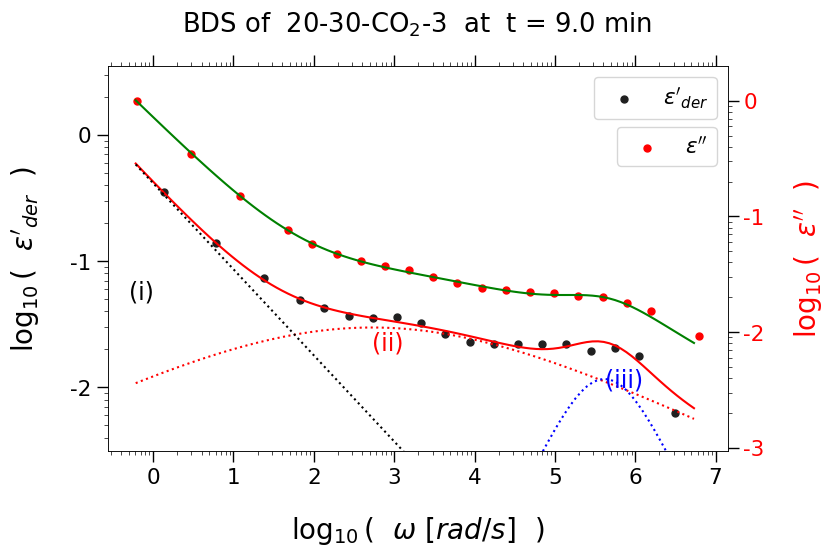

fit score 1612814.0
fit parameters [0.2449, 0.2948, 479.2, 0.019, 0.8948, 437100.0, 26290.0, 0.7019, 3.645e-07]


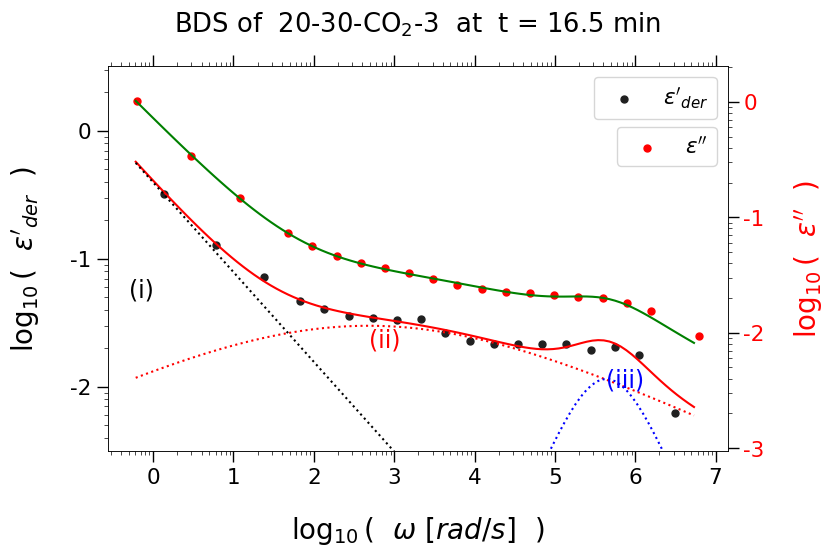

fit score 3304340.0
fit parameters [0.2576, 0.2855, 360.3, 0.0191, 0.8843, 439800.0, 16320.0, 0.7277, 1.207e-06]


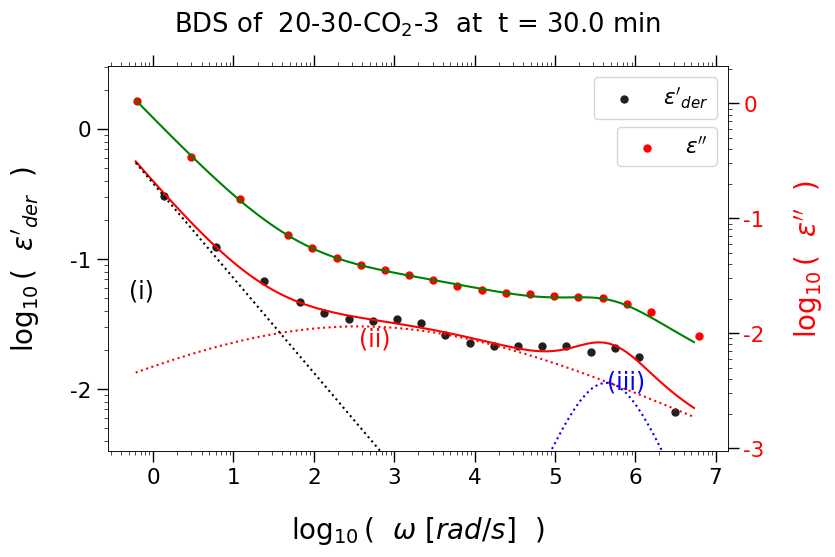

FALLBACK 1:  43402.0
fit score 1105750.0
fit parameters [0.2751, 0.2777, 246.9, 0.01907, 0.8896, 448800.0, 10430.0, 0.7607, 4.214e-06]


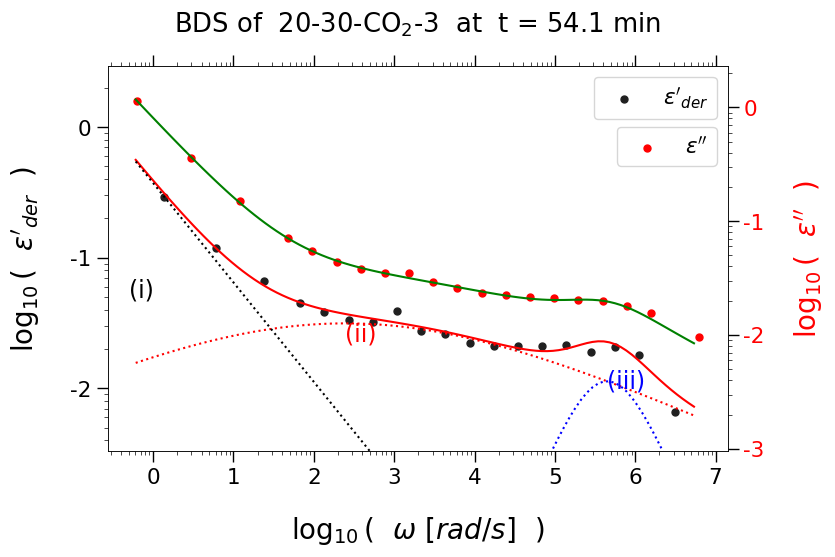

FALLBACK 1:  46116.0
fit score 2788035.0
fit parameters [0.2921, 0.2635, 178.3, 0.01756, 0.9007, 459000.0, 14390.0, 0.7878, 4.417e-06]


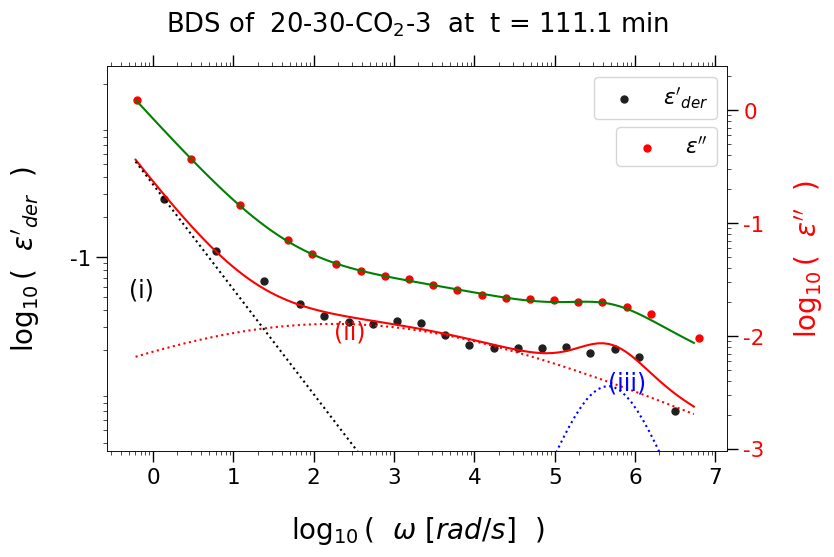

fit score 373201.0
fit parameters [1.754, 0.5064, 1.006, 0.1719, 0.3469, 44680.0, 20070.0, 1.0, 3.1e-05]


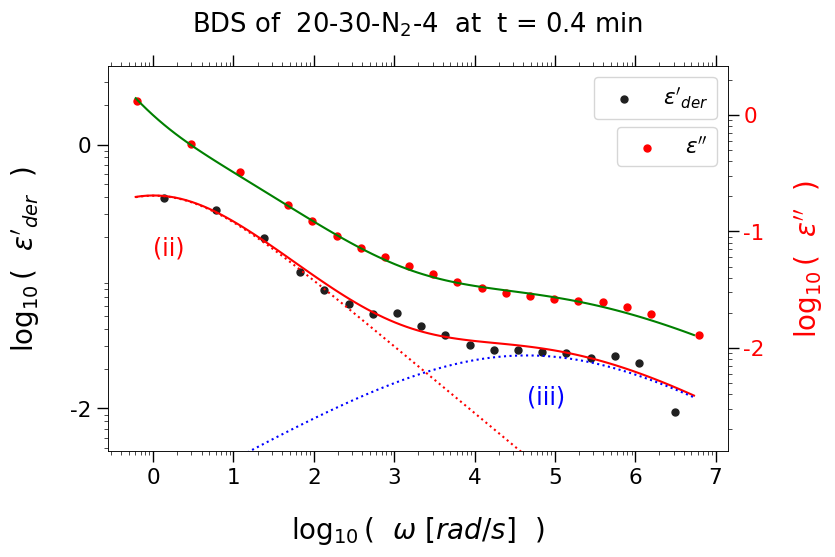

fit score 422420.0
fit parameters [1.582, 0.5663, 2.46, 0.2004, 0.3242, 29220.0, 29940.0, 1.0, 2.187e-05]


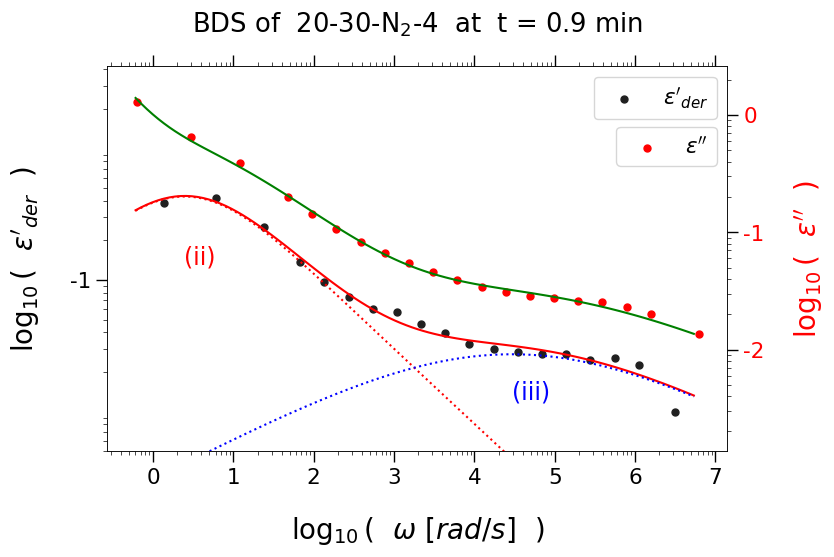

fit score 1080034.0
fit parameters [1.955, 0.5919, 2.769, 0.2366, 0.3014, 21540.0, 24000.0, 1.0, 2.385e-05]


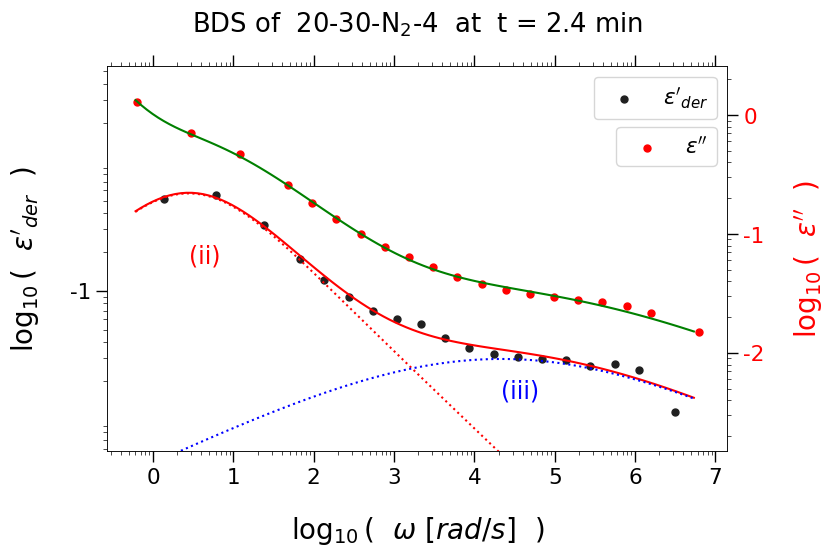

fit score 2281970.0
fit parameters [1.916, 0.6153, 4.495, 0.2533, 0.2946, 21930.0, 32170.0, 1.0, 1.875e-05]


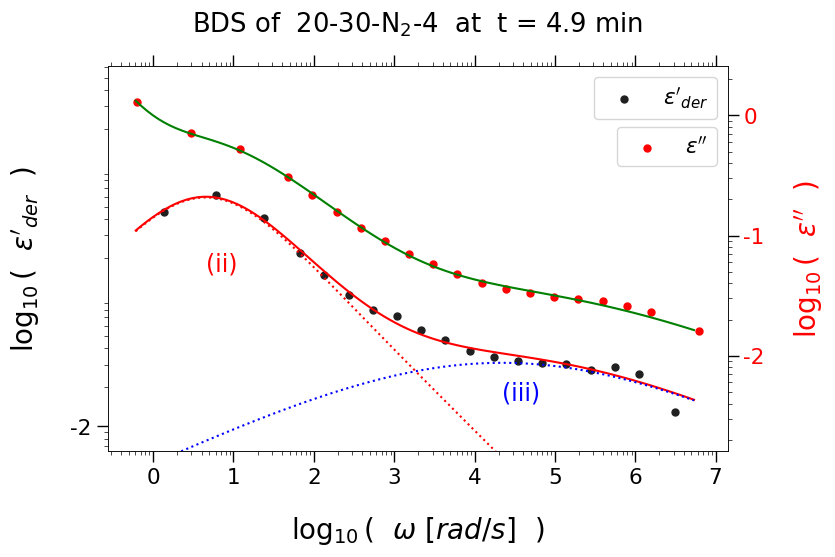

fit score 2816021.0
fit parameters [1.871, 0.6379, 6.246, 0.2858, 0.2785, 15830.0, 38780.0, 1.0, 1.653e-05]


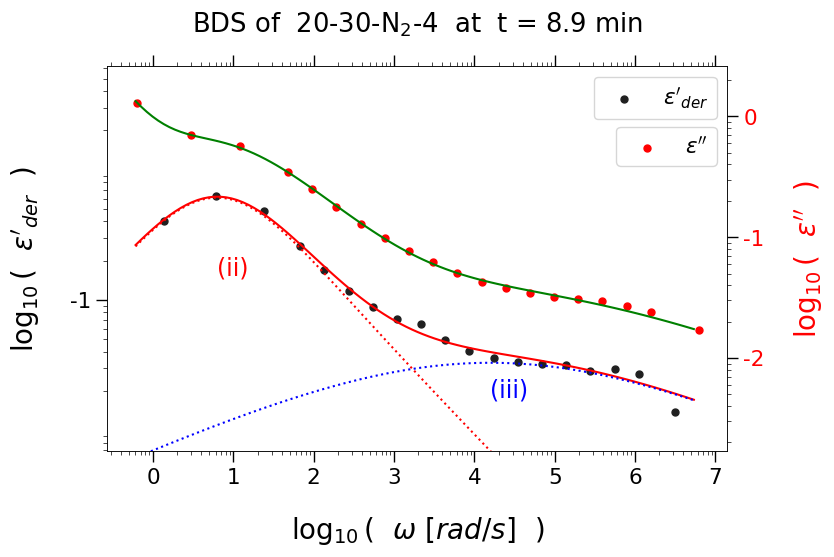

fit score 4605279.0
fit parameters [1.846, 0.6485, 8.104, 0.2972, 0.2749, 16130.0, 57990.0, 1.0, 1.152e-05]


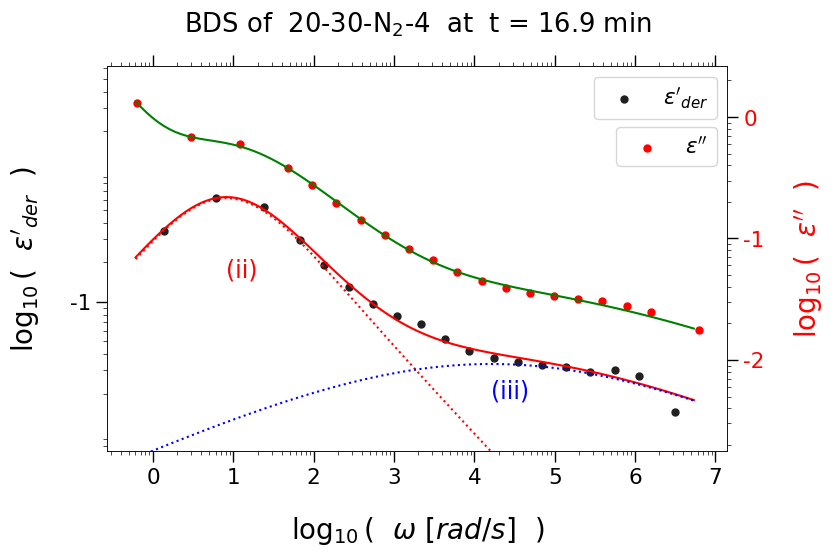

fit score 6380408.0
fit parameters [1.832, 0.6536, 9.612, 0.2974, 0.2764, 18580.0, 69420.0, 1.0, 9.528e-06]


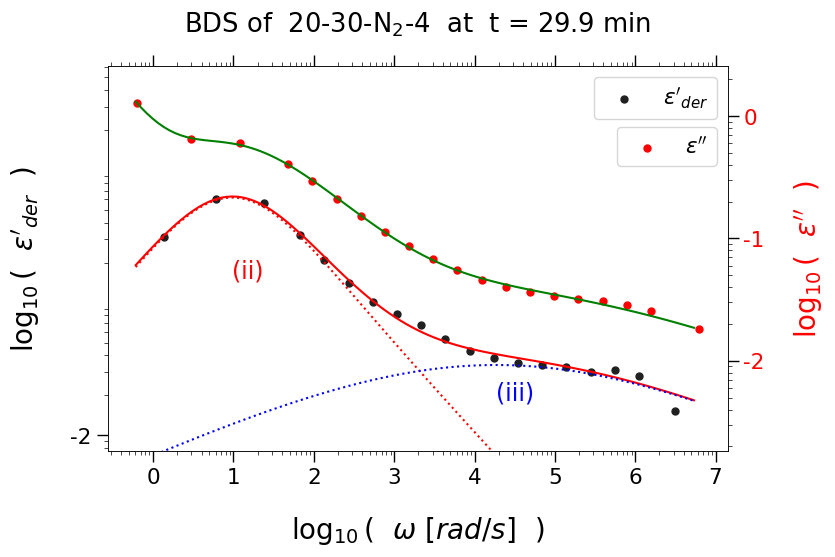

fit score 6457041.0
fit parameters [1.805, 0.6621, 11.27, 0.3041, 0.2755, 18430.0, 229700.0, 1.0, 2.86e-06]


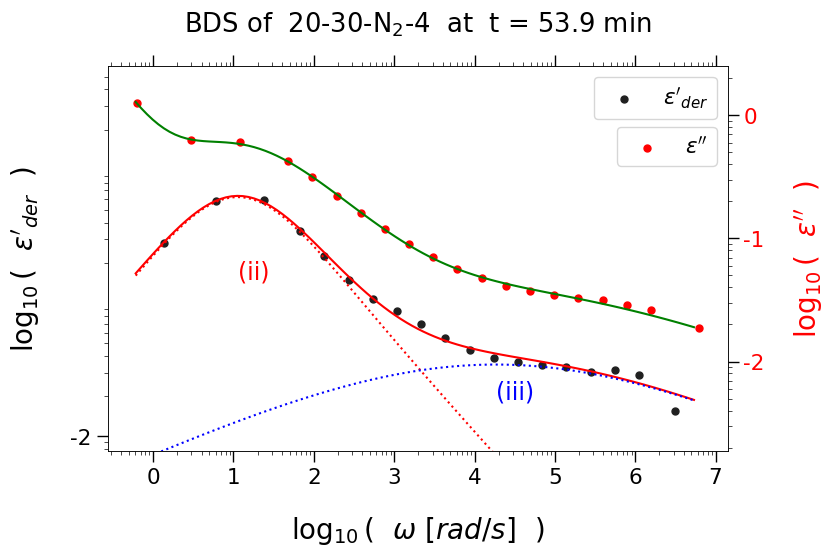

fit score 11062527.0
fit parameters [1.779, 0.6759, 14.39, 0.342, 0.2601, 12660.0, 23640000.0, 1.0, 3.208e-08]


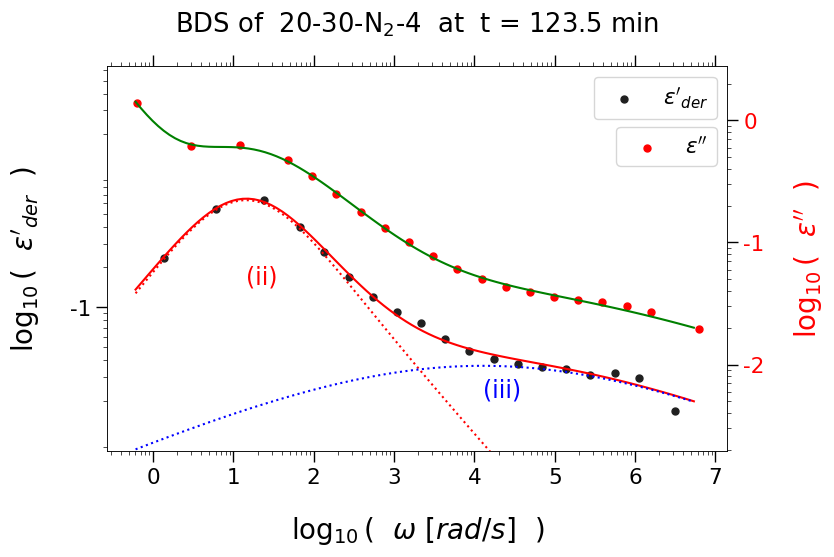

In [6]:
### main

# selection of a few indices where the plot is shown; quadratic: show many at the start and less later
plotI = np.linspace(0,4,8)
plottimes = np.exp( plotI )-1
plottimes = np.append(plottimes, [1e5, 1e5])
# ignore last tol minutes of each run to avoid faulty data from next run
tol = 5

# combined lists that save the fit data, will contain numpy arrays of different length, one array per run
P_ALL = []
DT_ALL = []
A_ALL = []
# save ID for easier handling, P_ALL[j] will correspond to ID[j]
# ID is temperature-gas-run ie. "70-N_2-1", as shown in plots
ID = []

# go throgh all temperatures, or rather their respective datasets
for m, data in enumerate(DATA) :
    temp = str(TEMPS[m])

    # f is an array of the unique frequencies
    # er_der is a 2D array of all "numerical derivative of real part"-values
    # er_der[i] / ei[i] (one row of the matrix) is one spectrum
    # where i corresponds to the time
    # ei[:,k] (one column) is the time evolution at a fixed frequency
    # The array contains one whole measurement with fixed temperature and all gas runs
    f, lnw_der, er_der, ei, t = extract_interpolate_and_derivative(data)
    ln_er_der = np.log(er_der)
    w = 2*np.pi*f
    lnw = np.log(w)
    w_der = np.exp(lnw_der)
    
    # go throgh all runs, one run starts with change of gas
    for j, t0 in enumerate(GASCHANGE[m][:-1]) :
        if temp+'-'+str(j) in id_out :
            continue
        gas = GASES[S[m][j]]
        ID.append(temp+'-'+gas+'-'+str(j))
        run_num = len(ID) - 1

        t1 = GASCHANGE[m][j+1]-tol
        # indices of start/end of current run
        t0_i = np.searchsorted(t, t0, side="left")
        t1_i = np.searchsorted(t, t1, side="right")

        p0 = p0_start[run_num]
        # stack of numpy arrays of all fit parameters of current run: [ [a,b,c,...], [a,b,c,...], ... ]
        PARAMS = []
        # stack of times; needed because fit doesn't always converge. DT[i] corresponds to PARAMS[i]
        DT = []
        A = []

        plot_i = 0
        for i in range(t0_i, t1_i) :
            # time relative to change of gas (=start of current run)
            dt = t[i]-t0

            # if the fit converged, p0 (next initial guess) will be the optimal parameters   
            p0, a, fitscore = fit(lnw_der[i], ln_er_der[i], lnw, np.log(ei[i]), p0, run_num)
            #p0 = fixorder(p0)

            if fitscore > 50:#17000 :
                # save fit parameters and time if the fit was successful
                PARAMS.append(p0)
                A.append(a)
                DT.append(dt)

                # plot a small selection of spectra
                if dt > plottimes[plot_i] or i==t1_i-1 :
                    plot(w_der[i], er_der[i], w, ei[i], p0, dt, run_num, ID[-1], fitscore)
                    plot_i += 1


        # after processing whole run: save all the fit data of the run in big combined list
        # swap axes of PARAMS, such that the colums-rows are times-fit parameters
        P = np.swapaxes(PARAMS, 0, 1)
        P_ALL.append(P)
        DT_ALL.append(np.array(DT))
        A_ALL.append(np.array(A))

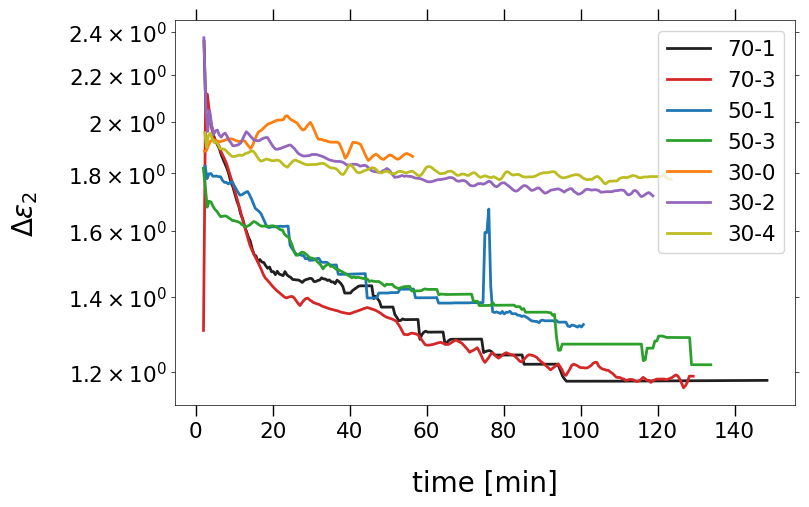

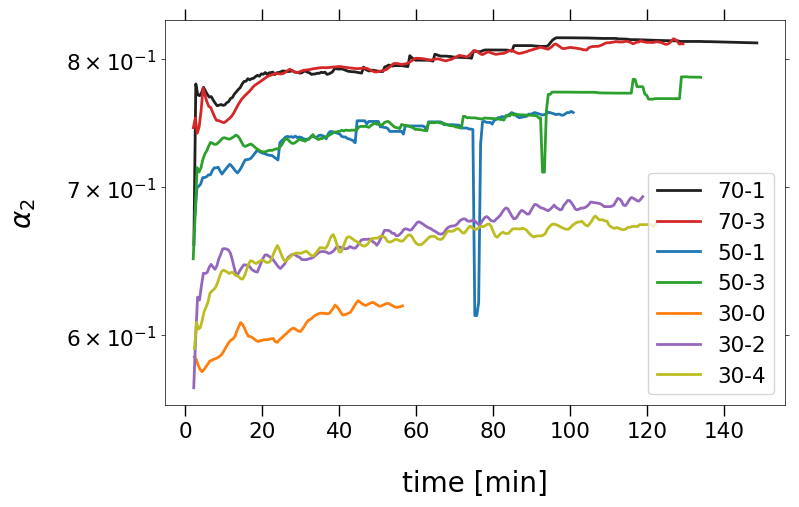

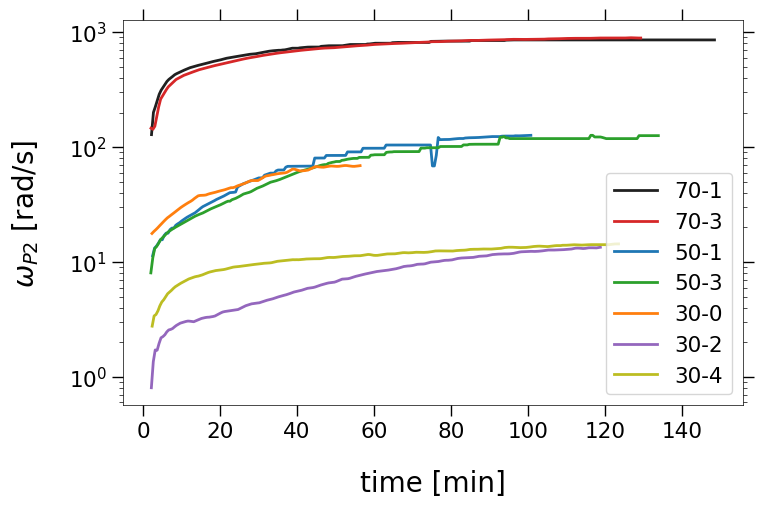

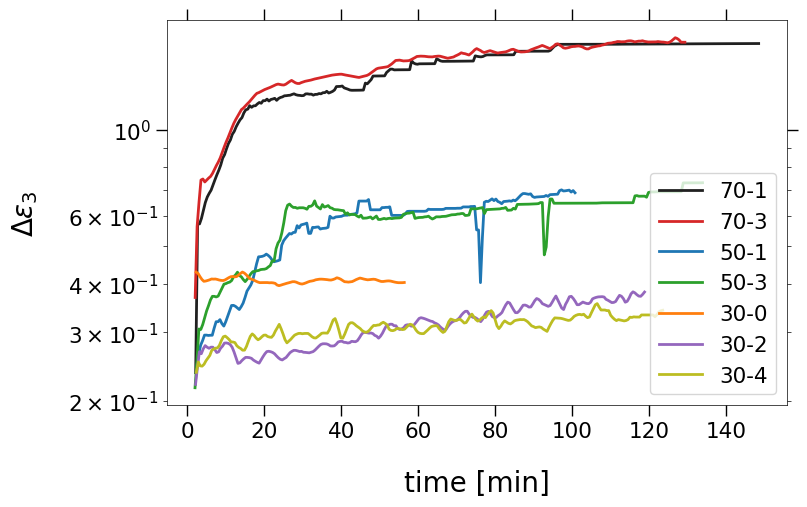

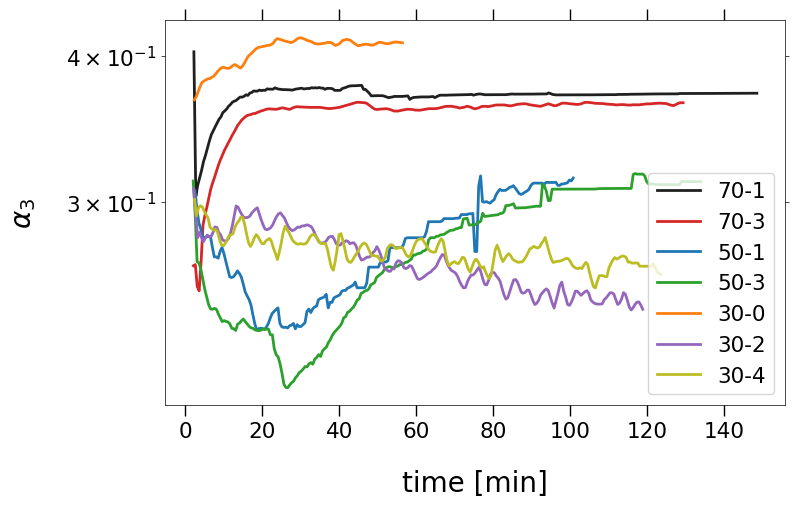

...

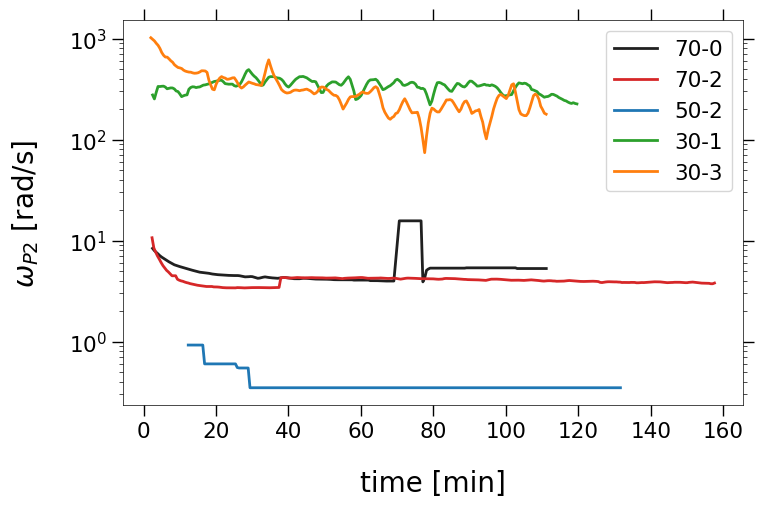

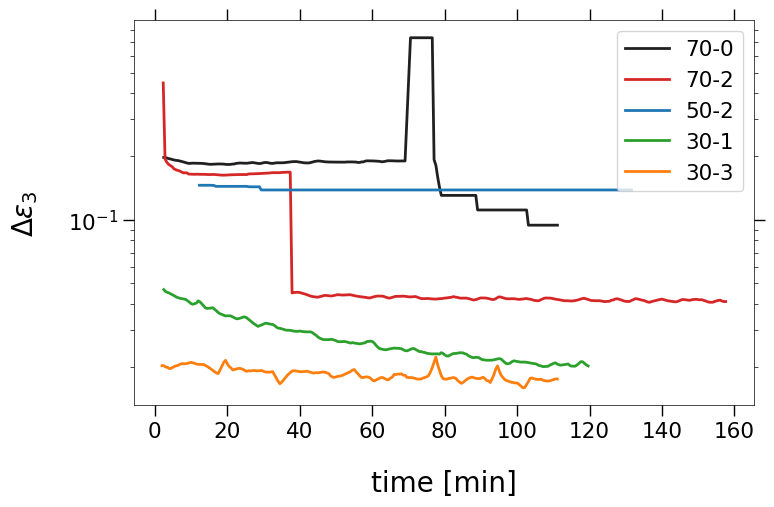

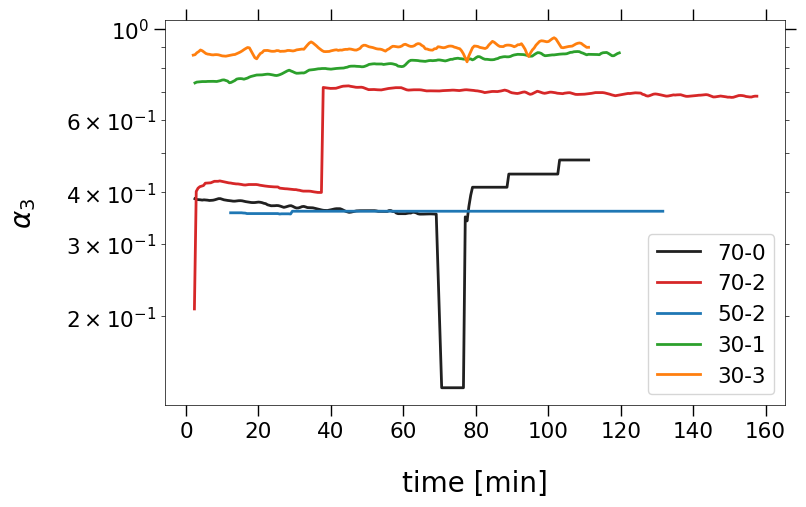

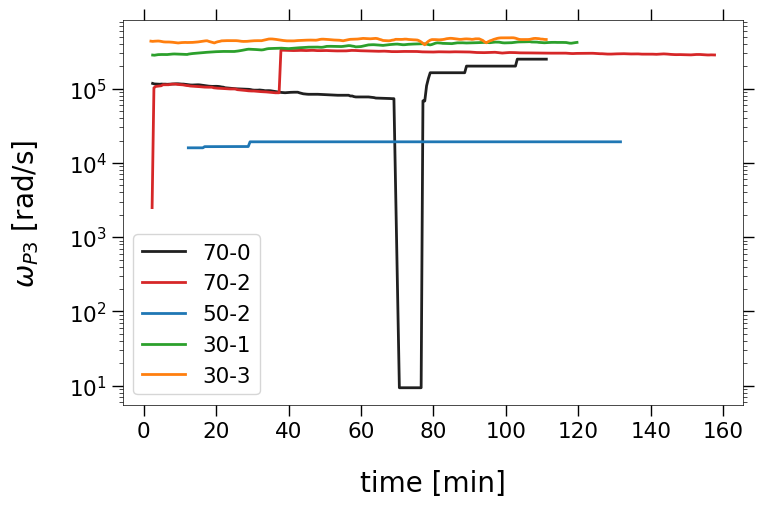

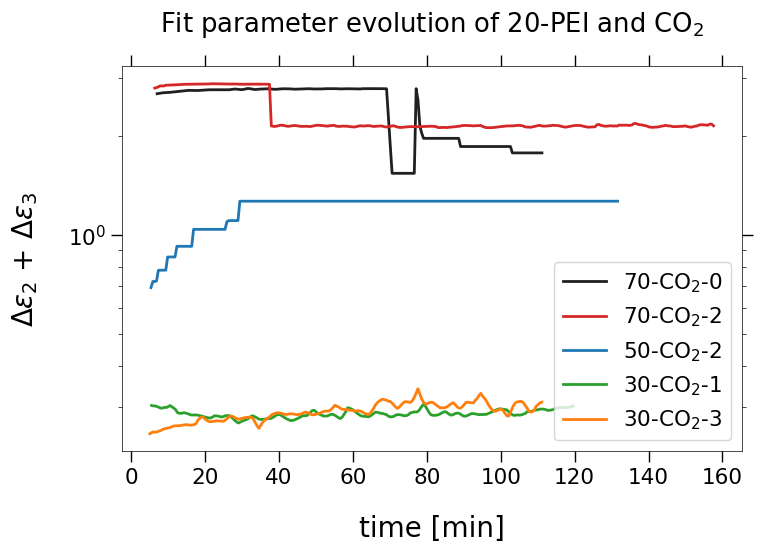

In [7]:
### Plot time evolution of fit parameters

title_text = "Fit parameter evolution of "+ SAMPLE + " and "

# cut out the start up to t_min
t_min = 2
good = [DT_ALL[j] > t_min for j in range(len(DT_ALL))]
DT_ALL_ = [DT_ALL[j][good[j]] for j in range(len(DT_ALL))]
P_ALL_ = [P_ALL[j][:, good[j].flatten()] for j in range(len(DT_ALL))]

# j: run with specific temp and gas
# i: parameters

for gas in GASES :
    for i, parameter in enumerate(p_labels[:-3]) :
        plt.xscale('linear')
        plt.yscale('log')

        #l, u = 1e50, -1

        for j, id in enumerate(ID) :
            if id[3] != gas[0] :#or (id[0]=='3' and id[-1]=='0') :
                continue
            if id[3] == "C" and id[0] == "5":
                n = 20
            else :
                n = 0
            #if id[0] == "7" and id[-1] == "2" :
            #    continue
            label = id[:2] + id[-2:]

            x, y = DT_ALL_[j][n:], P_ALL_[j][i][n:]
            #lower_threshold, upper_threshold = np.percentile(y, [5, 95])
            #l, u = min(lower_threshold, l), max(upper_threshold, u)

            plt.plot(x, y, label=label, lw=2)
            #plt.title(title_text + gas)

        plt.xlabel("time [min]")
        plt.ylabel(parameter)
        plt.legend()
        #plt.savefig(results_folder + "/param/"+gas+" "+p_file_labels[i]+".pdf", bbox_inches='tight')
        plt.show()

    plt.xscale('linear')
    plt.yscale('log')

    for j, id in enumerate(ID) :
        if id[3] != gas[0] :#or (id[0]=='3' and id[-1]=='0') :
            continue
        de_sum = P_ALL[j][0] + P_ALL[j][3]
        plt.plot(DT_ALL[j][10:], de_sum[10:], label=id, lw=2)
        plt.title(title_text + gas)

    plt.xlabel("time [min]")
    plt.ylabel(p_labels[0] + " + " + p_labels[3])
    plt.legend()
    plt.show()

[0.84553, 5.5899, 1.099, 63.824, 0.54185]
[0.75905, 9.0508, 0.99818, 131.07, 0.45664]


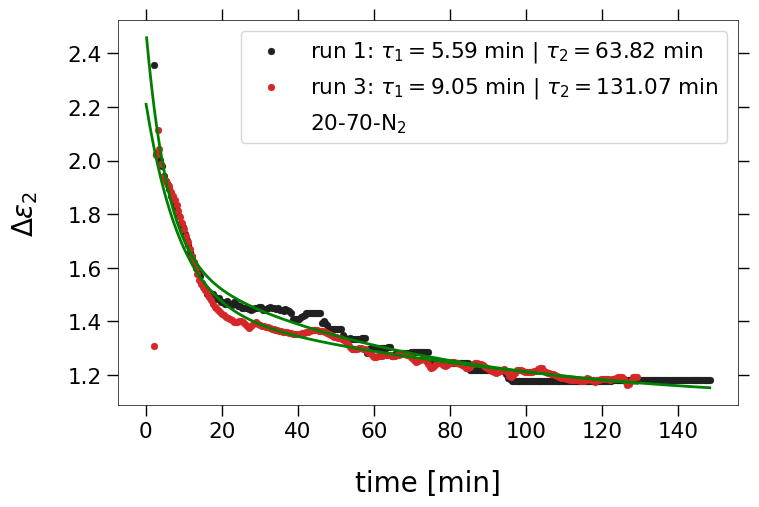

[0.62778, 25.255, 1.3344]
[0.58923, 88.1, 1.113]


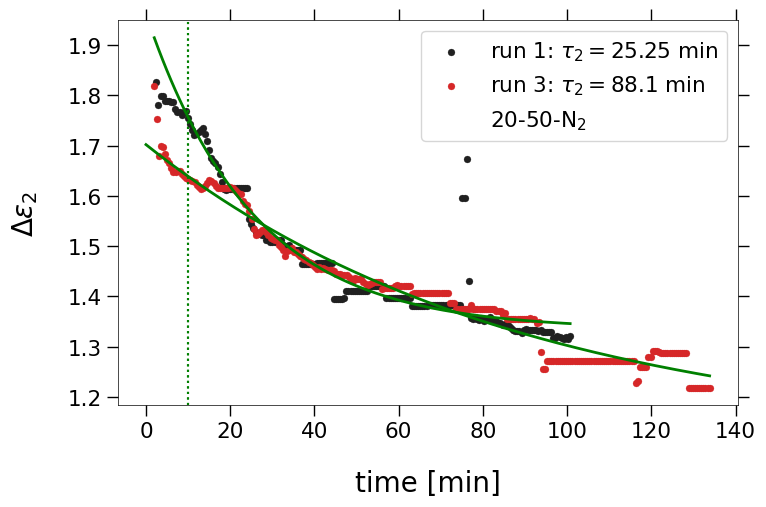

[0.31666, 45.624, 1.7001]
[0.1291, 31.218, 1.7818]


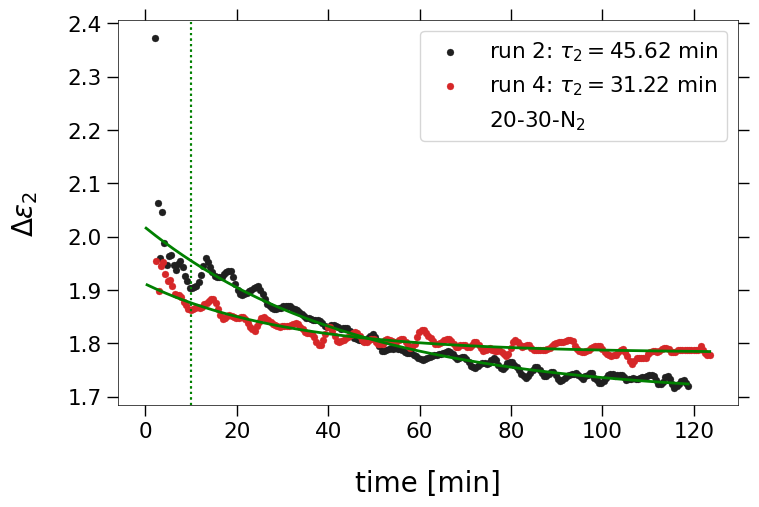

[-0.059351, 68.313, 0.82547]
[-0.064346, 39.891, 0.81531]


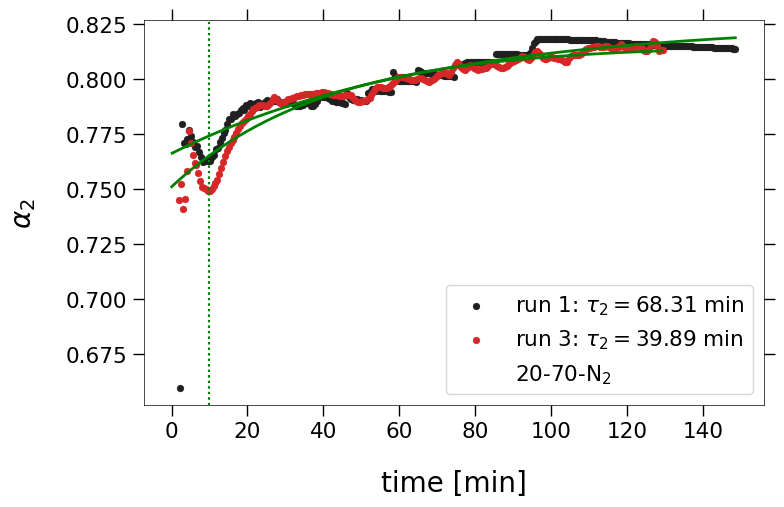

[-0.06283, 19.383, 0.74819]
[-681.76, 1646500.0, 682.48]


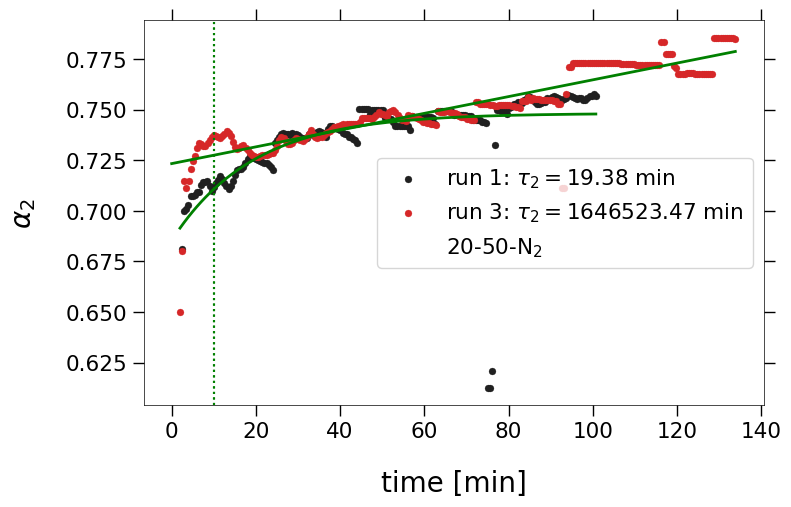

[-0.12867, 198.82, 0.7638]
[-0.046966, 38.327, 0.67525]


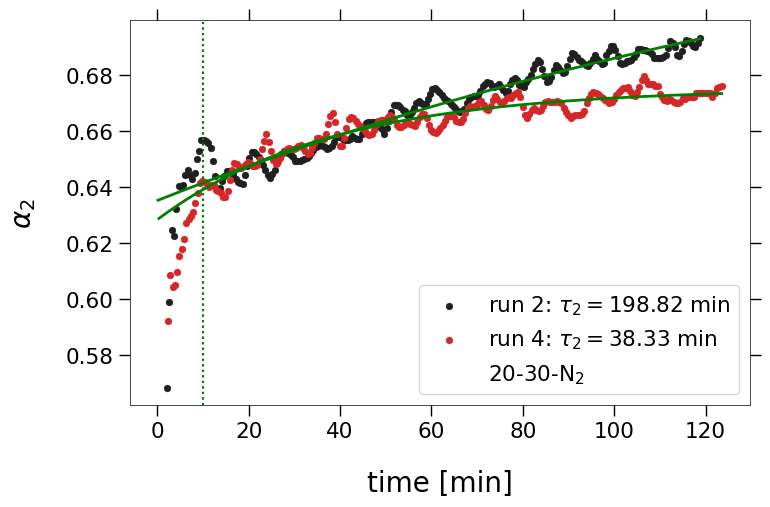

[-362.78, 3.1011, 867.47, 29.161, -568.82]
[-320.74, 3.6996, 920.27, 39.808, -638.71]


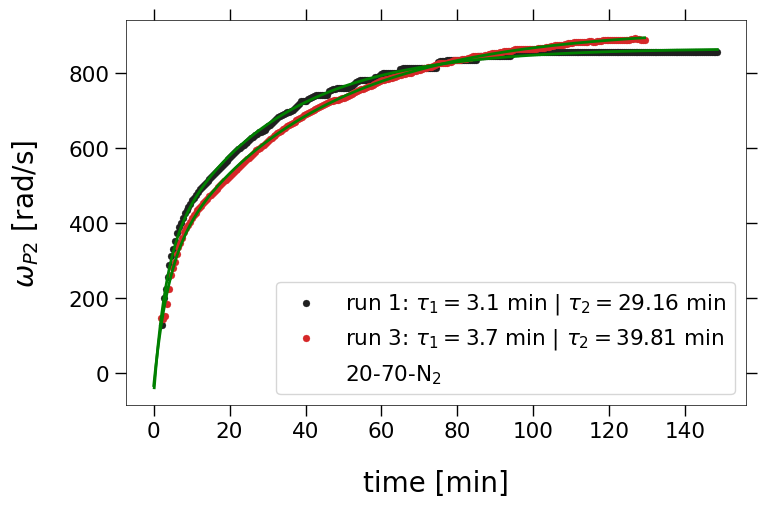

[-177.13, 64.58, 165.34]
[-169.06, 51.661, 138.52]


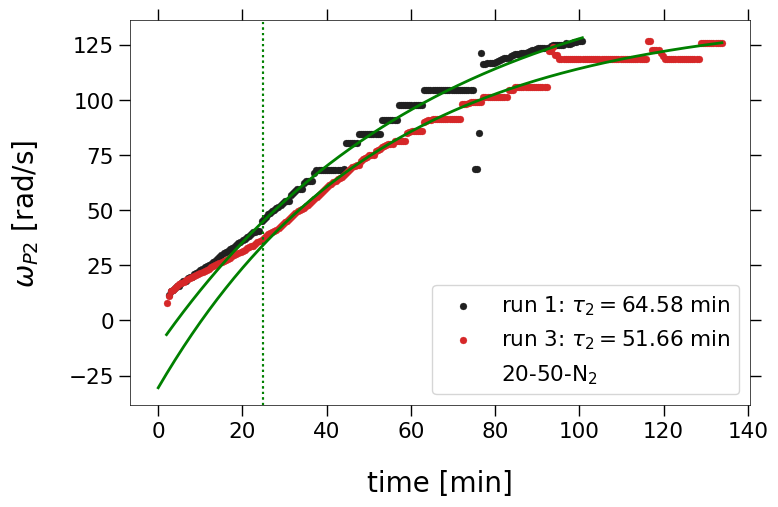

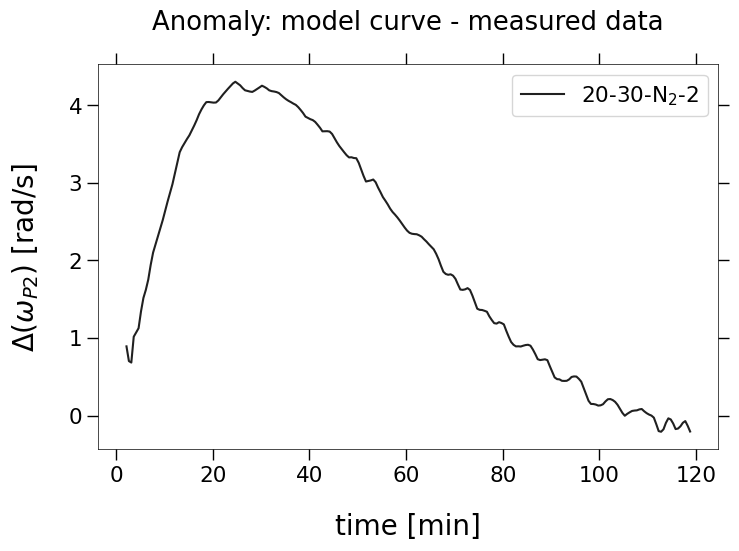

[-6.6231, 8.0987, 20.627, 168.48, -12.907]


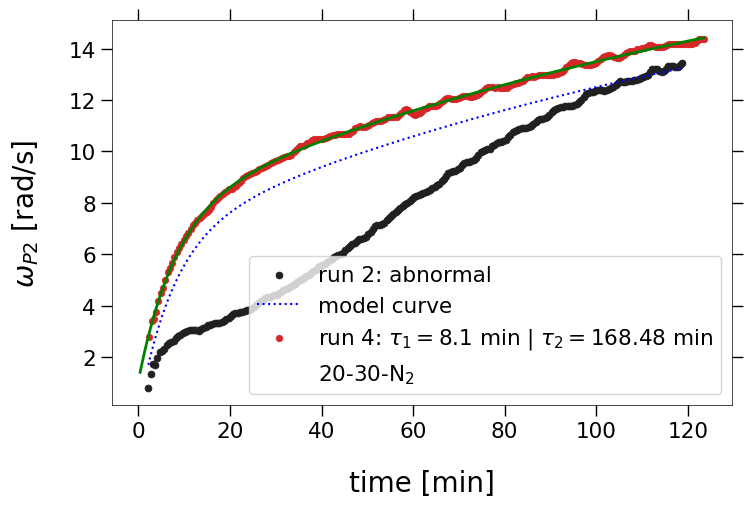

[-0.89254, 4.7169, 1.7787, 59.002, -0.88914]
[-0.72162, 9.8586, 1.8809, 91.129, -0.71078]


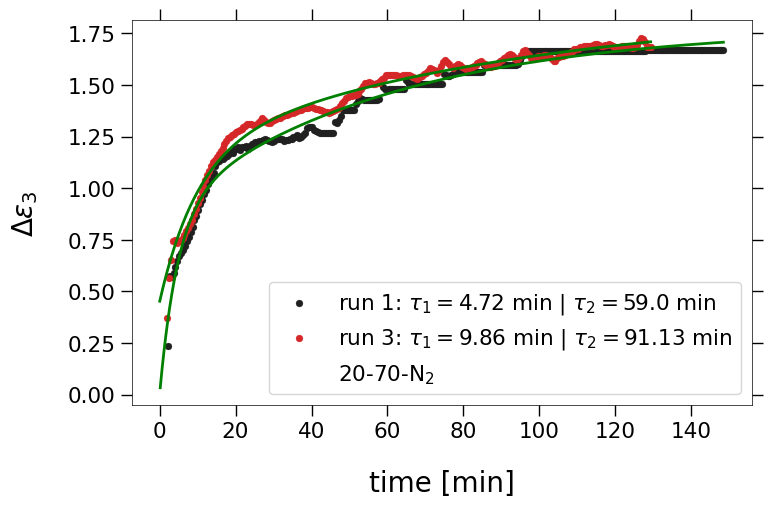

[-0.6105, 17.972, 0.65747]
[-0.51031, 16.586, 0.64806]


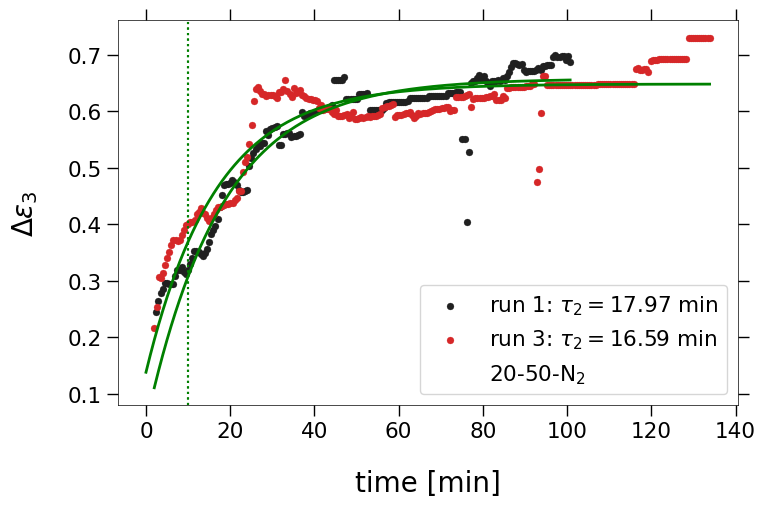

[-0.24729, 96.455, 0.44681]
[-0.081439, 100.04, 0.35685]


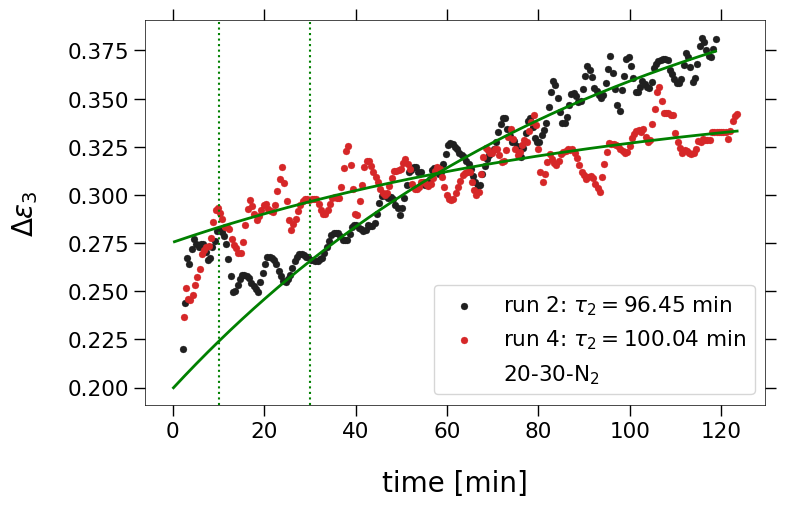

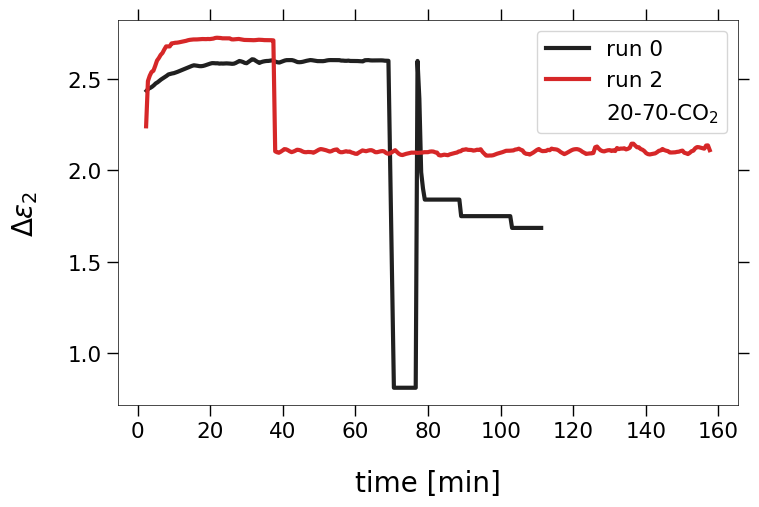

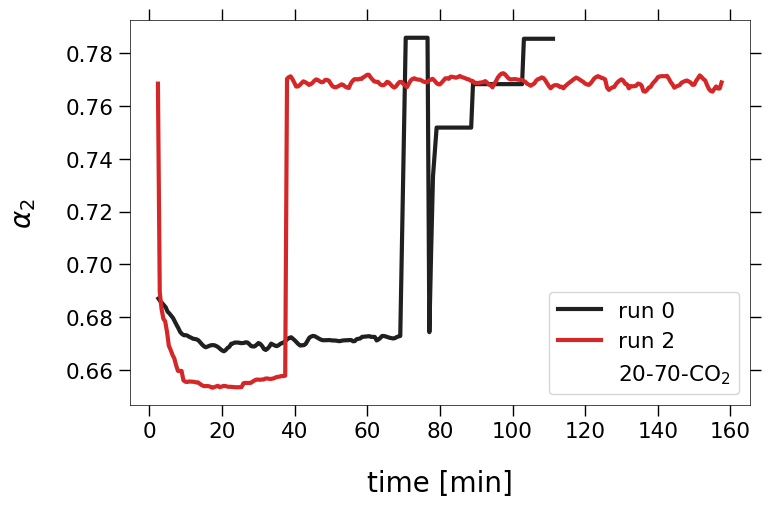

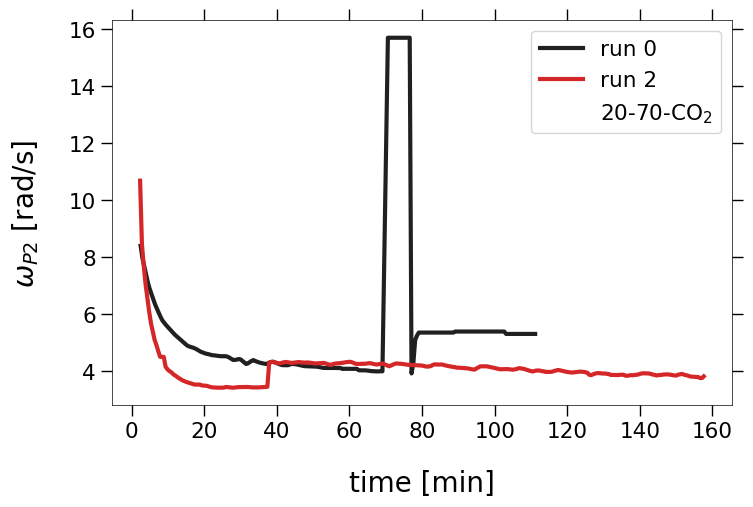

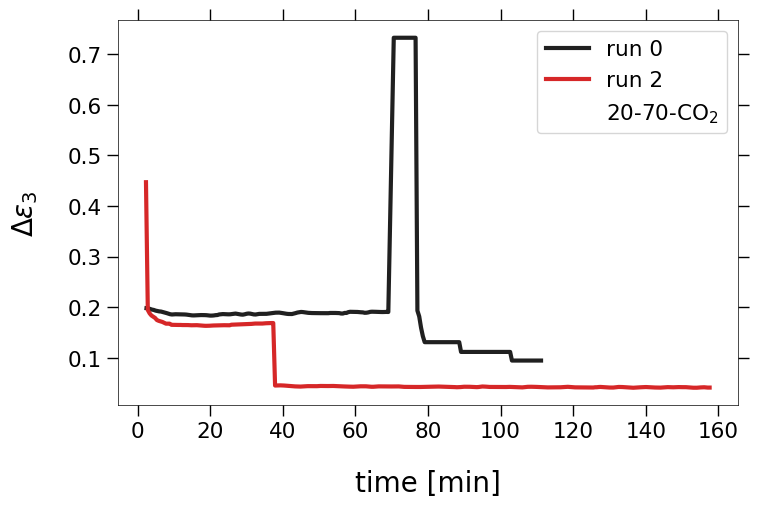

In [ ]:
### parameters by temperature in N2

title_text = "Fit parameter evolution / exponential fits for " + SAMPLE_SHORT +"-"

def exp(x, a, b, c) :
    return a * np.exp(-x/b) + c
def exp2(x, a, b, c, d, e) :
    return a * np.exp(-x/b) + c + e * np.exp(-x/d)

p0_list = [
    [0.8339, 5.2189, 1.2384, 40.091, 0.44262],
    [0.88466, 7.7722, 4.3142e-11, 768.78, 1.4709],
    [0.61185, 32.341, 1.2989],
    [0.47537, 57.774, 1.2508],
    [0.31608, 45.815, 1.6999],
    [0.12895, 31.238, 1.7819],
    [-0.041573, 27.38, 0.80124],
    [-0.042833, 61.915, 0.8071],
    [-0.059169, 34.301, 0.75737],
    [-17.644, 60464.0, 18.371],
    [-0.1303, 202.91, 0.76558],
    [-0.046935, 38.333, 0.67525],
    [-327.95, 2.9828, 845.96, 25.523, -572.6],
    [-597.68, 2.3191, 907.41, 37.63, -624.68],
    [-168.88, 44.715, 138.8],
    [-149.38, 58.953, 134.69],
    [-6.7167, 7.5933, 19.897, 152.68, -12.313],
    [-0.79511, 4.4321, 1.5741, 38.544, -0.75878],
    [-0.84687, 10.533, 2.4398, 334.52, -1.265],
    [-0.50919, 33.138, 0.71171],
    [-0.42379, 23.027, 0.66063],
    [-0.24722, 96.58, 0.44685],
    [-0.081276, 99.864, 0.35672]]

p_i = 0

look_at = [0, 1, 2, 3]
idp_out = ["3022"]
idp_2exp = ["7010", "7030", "7012", "7032", "7013", "7033", "3042"]
start = [0, 0, 5, 5, 5, 5, 5, 5, 10, 10, 25, 25, 0, 0, 30, 0]
s_i = 0

for gas in GASES :
    for i in look_at :

        for temperature in TEMPS :
            if gas[0] == "C" and temperature != 70 :
                continue
            temp = str(temperature)

            plt.xscale('linear')
            plt.yscale('linear')

            for j, id in enumerate(ID) :
                if id[3] != gas[0] or id[0] != temp[0] or (id[0]=='3' and id[-1]=='0') :
                    continue
                label0 = "run " + id[-1]
                label_id = SAMPLE_SHORT + '-' + id[:-2]
                idp = temp + id[-1] + str(i)
                t, p = DT_ALL[j][:], P_ALL[j][i][:]
                cutoff = 100
                pltt = t > 0

                if gas[0] == "C" :
                    plt.plot(t[pltt], p[pltt], label=label0, lw=3)
                    continue


                if idp in idp_out :
                    label = label0 + ": abnormal"
                    y2 = exp2(t[pltt], *[-6.717, 7.593, 18.9, 152.7, -12.31])
                    plt.plot(t[pltt], y2-p[pltt], label=SAMPLE_SHORT+'-'+id)
                    plt.title("Anomaly: model curve - measured data")
                    plt.xlabel("time [min]")
                    plt.ylabel("$\\Delta\\left(\\omega_{P2}\\right)$ [rad/s]")
                    plt.legend()
                    #plt.savefig(results_folder + "/param2/anomaly.pdf", bbox_inches='tight')
                    plt.show()
                    plt.scatter(t[pltt], p[pltt], label=label, lw=0.5)
                    plt.plot(t[pltt], y2, ls=':', color='b', label='model curve')
                    continue

                if idp not in idp_2exp :
                    fitf = exp
                    s = max(10, start[s_i])
                    fitt2 = (t > s)# & (t < cutoff)
                    try :
                        popt2, _ = curve_fit(fitf, t[fitt2], p[fitt2], p0=p0_list[p_i], bounds=((-i_, 0., 0.), (i_, i_, i_)))
                        print([round_sig(pi, 5) for pi in popt2])
                        label = label0 + f': $\\tau_2 = ${np.round(popt2[1],2)} min'

                        y2 = fitf(t, *popt2)
                        plt.plot(t, y2, color='g', lw=2)
                    except Exception as err :
                        print(str(type(err))[8:-2], ": ", err)

                    plt.axvline(s, linestyle=':', color='g')
                    s_i += 1
                    #plt.axvline(cutoff, linestyle=':', color='g')

                else :
                    fitf = exp2
                    fitt = t < cutoff
                    try :
                        popt, _ = curve_fit(fitf, t, p, p0=p0_list[p_i], bounds=((-i_, 0, 0., 0, -i_), (i_, i_, i_, i_, i_)))
                        print([round_sig(pi, 5) for pi in popt])
                        tau1 = np.round(min(popt[1], popt[3]),2)
                        tau2 = np.round(max(popt[1], popt[3]),2)
                        label = label0 + f': $\\tau_1 = ${tau1} min | $\\tau_2 = ${tau2} min'

                        y = fitf(t, *popt)
                        plt.plot(t, y, color='g', lw=2)
                    except Exception as err :
                        print(str(type(err))[8:-2], ": ", err)

                    #plt.axvline(cutoff, linestyle=':', color='g')

                plt.scatter(t[pltt], p[pltt], label=label, lw=0.2)
                p_i += 1
            
            plt.plot([],[],color='white',label=label_id)
            plt.xlabel("time [min]")
            plt.ylabel(p_labels[i])
            plt.legend()
            #plt.savefig(results_folder + "/param2/"+label_id+"-"+p_file_labels[i]+".pdf", bbox_inches='tight')
            plt.show()

[-3.3849, 0.84878, 5.5453, 27.824, -1.6888]
[-6.8948, 0.97979, 5.6006, 29.965, -1.6901]


/tmp/ipykernel_111910/3947453125.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


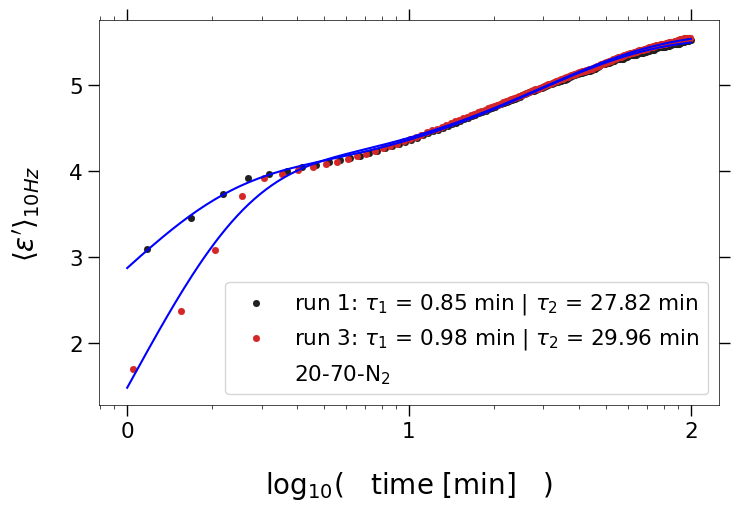

[-0.8372, 3.2751, 2.9408, 32.978, -0.75614]
[-1.2054, 1.7468, 2.8691, 27.282, -0.90064]


/tmp/ipykernel_111910/3947453125.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


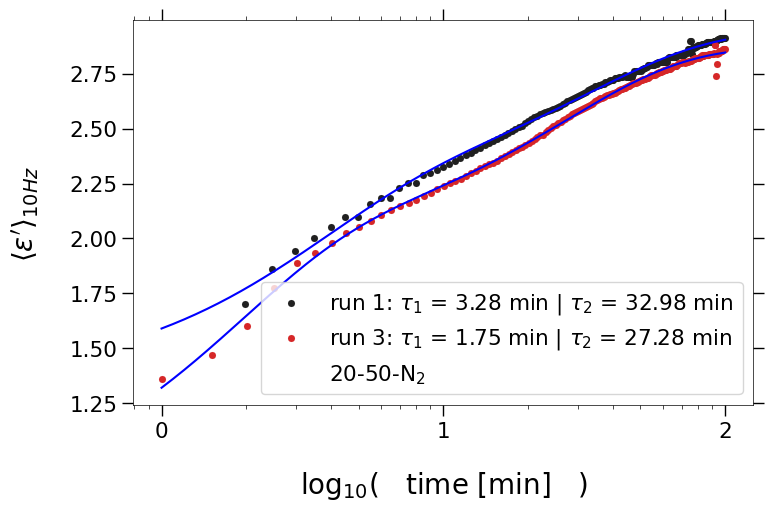

[-0.75929, 4.9625, 2.132, 70.056, -0.49096]


/tmp/ipykernel_111910/3947453125.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


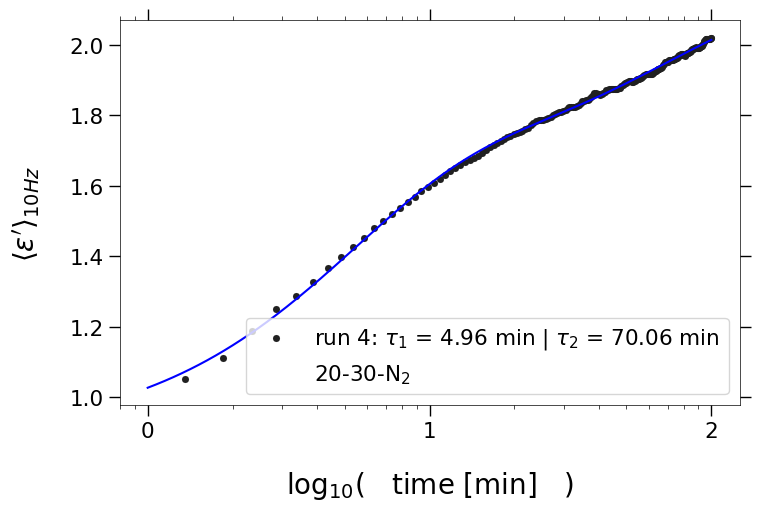

[0.56561, 4.3927, 1.446, 42.64, 0.30644]
[1.3758, 4.1663, 1.4498]


/tmp/ipykernel_111910/3947453125.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


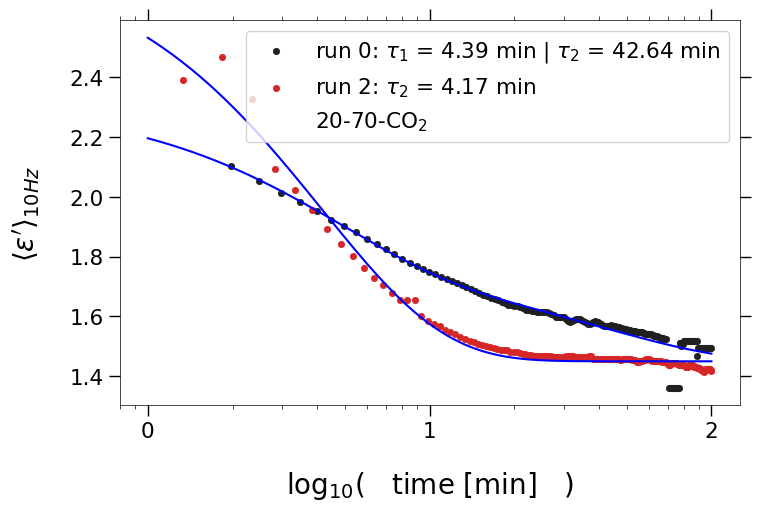

/tmp/ipykernel_111910/3947453125.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


[1.0595, 0.56486, 0.48214, 5.7829, 0.31129]


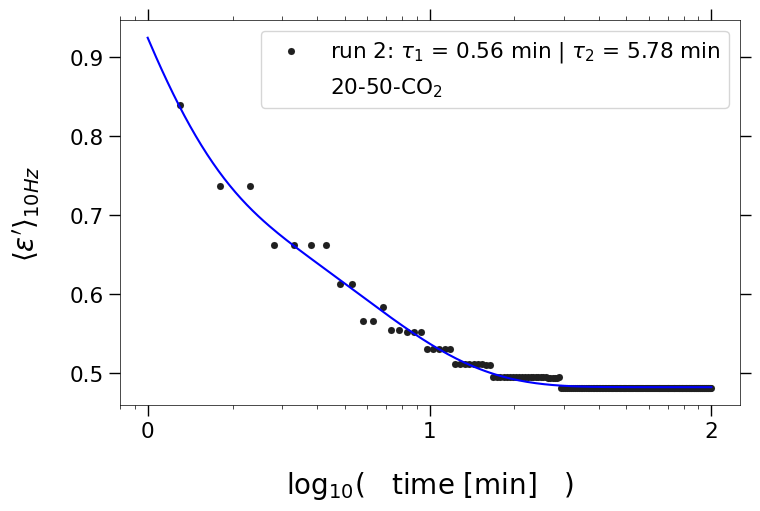

[0.13273, 5.5072, 0.40635, 54.668, 0.061283]
[0.13338, 2.1896, 0.41323, 23.378, 0.040838]


/tmp/ipykernel_111910/3947453125.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


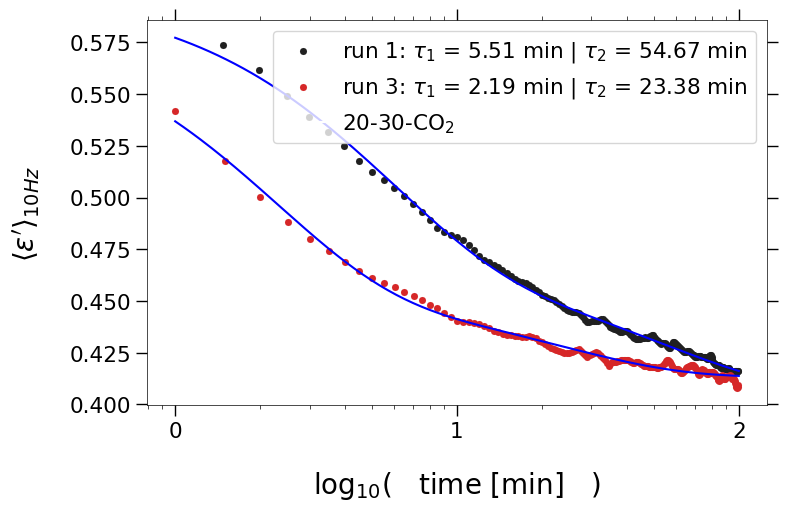

In [9]:
### Plot area

title_text = "Fit area evolution of "

p01 = [
    [-3.3728, 0.861, 5.5448, 27.765, -1.6805],
    [-0.94137, 2.764, 2.9277, 32.179, -0.75788],
    [-0.75991, 4.9524, 2.1315, 69.878, -0.4908]]
p02 = [
    [1.2712, 3.2663, 1.4237, 61.509, 0.12305],
    [0.13294, 5.4554, 0.40669, 53.689, 0.06141],
    [0.13294, 5.4554, 0.40669, 53.689, 0.06141]]

t_fit = np.logspace(0, 2, 200)

for gas in GASES :
    for T_i, temperature in enumerate(TEMPS) :
        temp = str(temperature)

        plt.xscale('log')
        plt.yscale('linear')

        for j, id in enumerate(ID) :
            if not (id[3] == gas[0] and id[0] == temp[0]) or (id[0]=='3' and id[-1] in ['0', '2']) :
                continue
            label0 = "run " + id[-1]
            label_id = SAMPLE_SHORT + '-' + id[:-2]
            t, a = DT_ALL[j], A_ALL[j]
            fitt = (a < 100) & (t>1) & (t<100)
            t, a = t[fitt], a[fitt]


            if id[3] == "N" :
                p0 = p01[T_i]
            else :
                p0 = p02[T_i]
            try :
                fitf = exp2
                popt, _ = curve_fit(fitf, t, a, p0=p0, bounds=((-i_, 0, 0., 0, -i_), (i_, 20, i_, 2000, i_)))

                tau1 = np.round(popt[1],2)
                tau2 = np.round(popt[3],2)
                label = label0 + f': $\\tau_1$ = {tau1} min | $\\tau_2$ = {tau2} min'

                if tau2 > 500 :
                    fitf = exp
                    popt, _ = curve_fit(fitf, t, a, p0=p0[:3], bounds=((-i_, 0, 0.), (i_, i_, i_)))
                    tau2 = np.round(popt[1],2)
                    label = label0 + f': $\\tau_2$ = {tau2} min'


                print([round_sig(pi, 5) for pi in popt])
                plt.plot(t_fit, fitf(t_fit, *popt), color="b")

                #y1 = fitf(t_fit, 0, *popt[1:])
                #y2 = fitf(t_fit, *popt[:-1], 0)
                #plt.plot(t_fit, y1, color='yellow', ls=":")
                #plt.plot(t_fit, y2, color='green', ls=":")

            except Exception as err :
                print(str(type(err))[8:-2], ": ", err)

            plt.scatter(t, a, label=label, linewidth=0.1)

        ax = plt.gca()
        ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])
        plt.plot([],[],color='white',label=label_id)
        plt.xlabel("log$_{10}$(   time [min]   )")
        plt.ylabel("$\\langle\\varepsilon'\\rangle_{10Hz}$")
        plt.legend()
        #plt.savefig(results_folder + "/area/"+label_id+".pdf", bbox_inches='tight')
        plt.show()

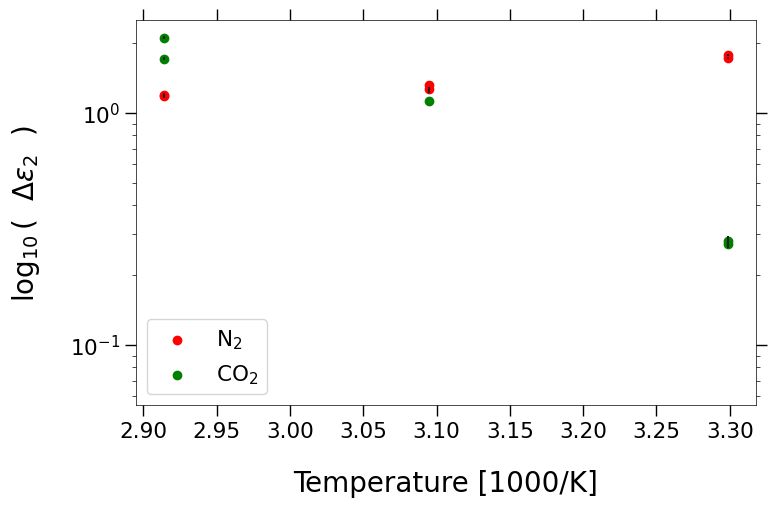

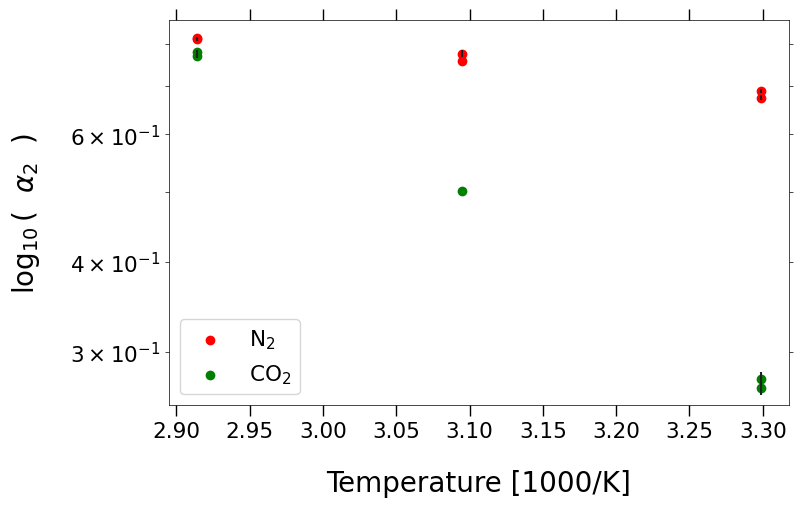

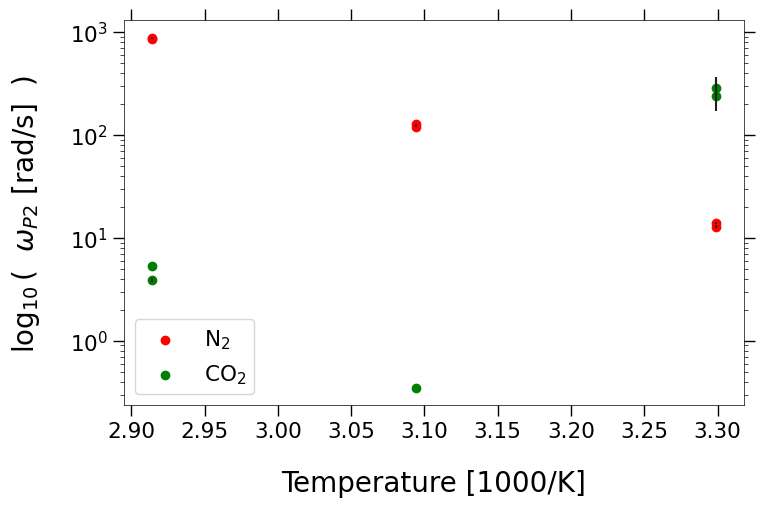

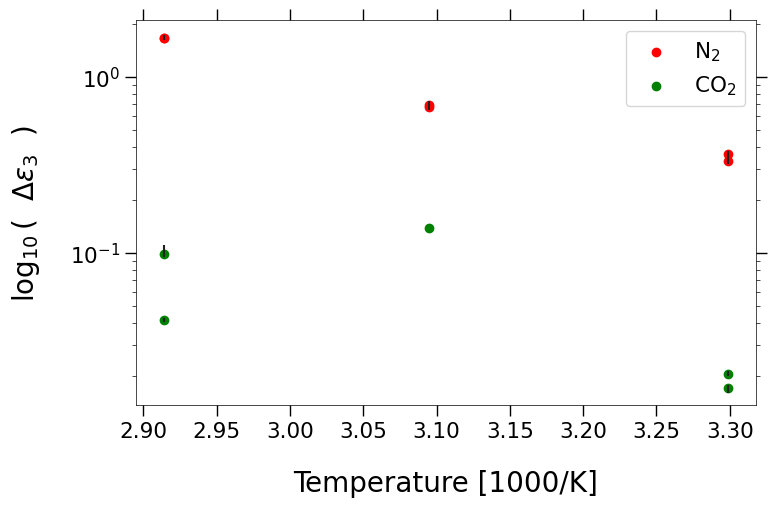

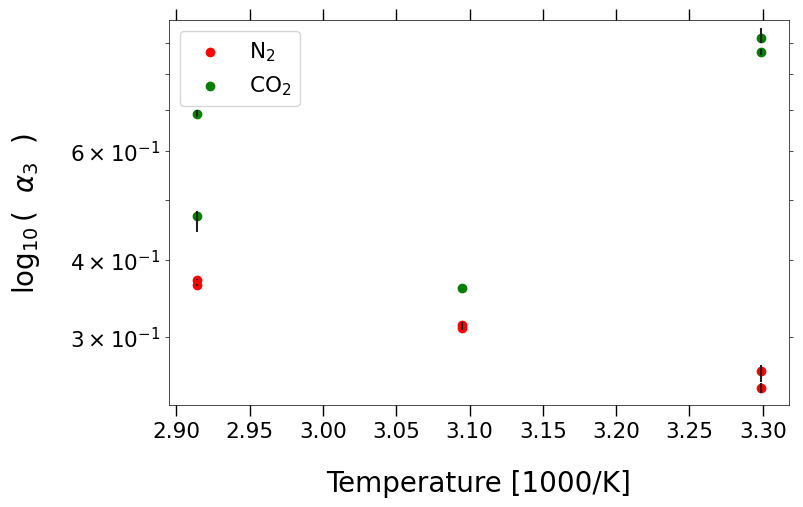

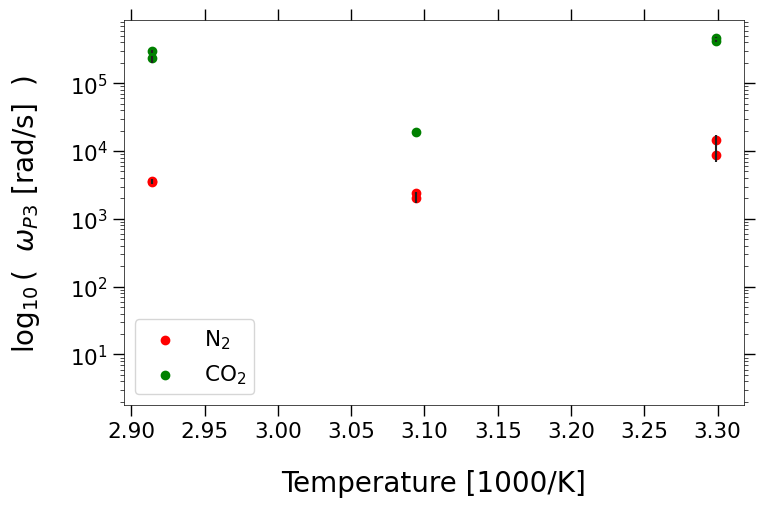

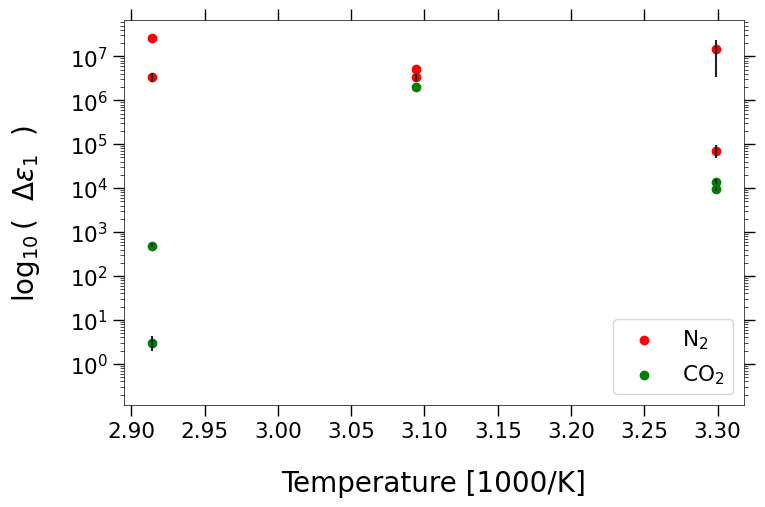

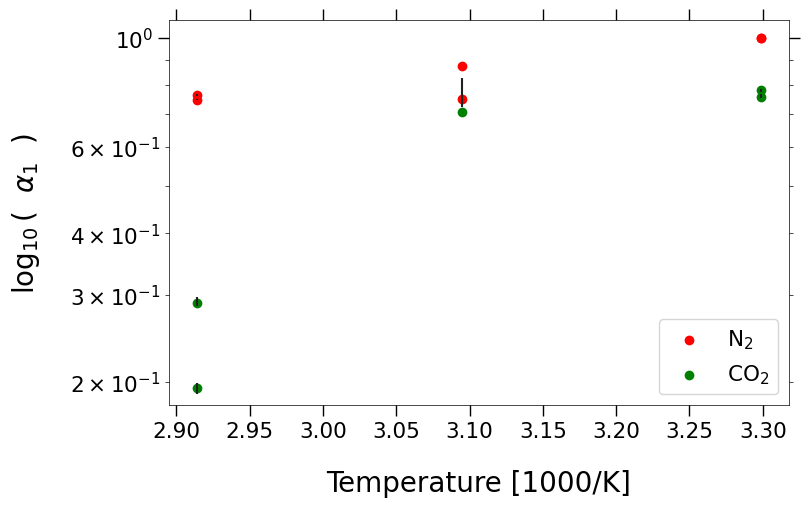

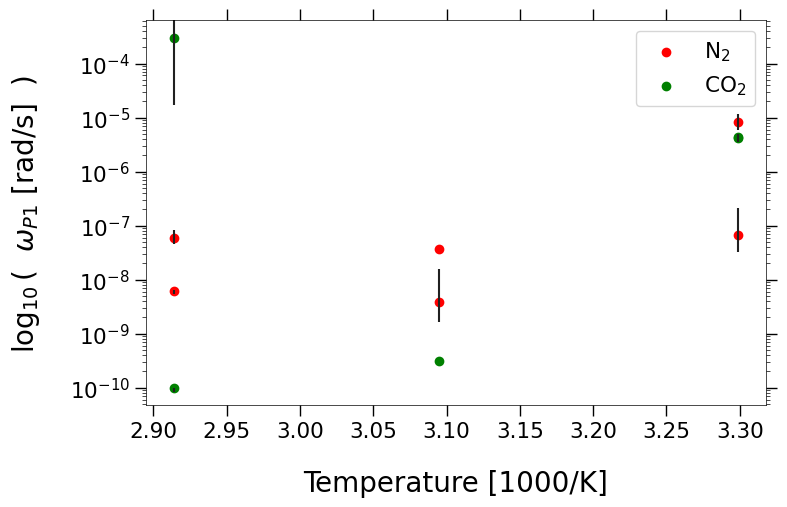

In [10]:
### plot final fit parameters against temperature
title = "Equilibrated fit parameter of " + SAMPLE
colors = ['red', 'green']

for i, p in enumerate(p_labels) :

    plt.yscale('log')

    for g_i, gas in enumerate(GASES) :
        values = []
        for j, id in enumerate(ID) :
            if not id[3] == gas[0] or (id[0]=='3' and id[-1]=='0') :
                continue
            end = DT_ALL_[j] > 100
            x = P_ALL_[j][i][end]
            xa = np.average(x)
            xe1 = xa - np.min(x)
            xe2 = np.max(x) - xa
            xe1 = xe1 * (xe1 > 0)
            xe2 = xe2 * (xe2 > 0)
            values.append(np.array([int(id[:2]), xa, xe1, xe2]))
        v = np.swapaxes(values, 0, 1)

        T = 1000/(v[0]+273.15)
        plt.scatter(T, v[1], linewidths=2, label=gas, color=colors[g_i])
        plt.errorbar(T, v[1], yerr=v[2:], fmt='none')
        plt.xlabel("Temperature [1000/K]")#"$1/(\\epsilon_0 k_B T)$")
    plt.ylabel("$\log_{10}(~~$" +p+ "  )")

    #plt.title(title)
    plt.legend()
    #plt.savefig(results_folder + "/endval/"+p_file_labels[i]+".pdf", bbox_inches='tight')
    plt.show()
